# __Ultrasonic Flowmeter Diagnostics Data Set__

## __0. Overview__


The dataset was given without much explanation on each features. To better understand the data that was given, we went to research for more information regarding each individual feature.

The following are features that may be used to predict our target variable (health state of pipeline):

1. Profile factor - relationship between the inner and outer paths of a meter also referred to as flatness ratio. It is an indication of the shape of the flow profile passing through the meter. Changes can indicate dirt build up, presence of liquids or blockages upstream of the meter/ ratio of individual path velocities is used to quantify the shape of profile (B+C)/(A+D) [flow velocity]
2. Symmetry - a relationship between the paths in the top of the meter compared to the paths in the bottom half of the meter. Asymmetry can also indicate blockages or liquids. Installation effects often are
identified here as flow out of elbows or tees can present as different velocities in the top compared to the bottom of the meter
3. Crossflow - a relationship between the paths crossing at different angles through the meter body (indicates roughly horizontal symmetry compared to Symmetry which indicates vertical symmetry)
4. Swirl angle - a comparison of individual path velocities to determine rotational stability of the flow
5. Flow velocity in each of the four paths
6. Average flow velocity in all four paths
7. Speed of sound in each of the four paths
8. Average speed of sound in all four paths
9. Signal strength at both ends of each of the four paths
10. Turbulence in each of the four paths - an indication of flow stability determined by the deviation of individual velocity measurements over time (also referred to as standard deviation)
11. Meter performance
12. Signal quality at both ends of each of the four paths
13. Gain at both ends of each of the four paths
14. Transit time at both ends of each of the four paths
15. Class attribute or health state of meter:
    <ul>
        <li>1: Healthy </li>
        <li>2: Gas injection </li>
        <li>3: Installation effects </li>
        <li>4: Waxing </li>
    </ul>

## __1. Load Libraries and read data__

### __1.1. Import required libraries__

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import missingno as msno
from mpl_toolkits import mplot3d
import plotly.express as px

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline

# models
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn import linear_model

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from pandas.plotting import scatter_matrix
from scipy import stats

### __1.2. Read data__

In [2]:
colNameB = [ 'ProfileFactor', 'Symmetry', 'Crossflow', 'SwirlAngle',
             'FlowVelocityP1', 'FlowVelocityP2', 'FlowVelocityP3', 'FlowVelocityP4','AvgFlowVelocity', 
             'SpeedOfSoundP1', 'SpeedOfSoundP2','SpeedOfSoundP3', 'SpeedOfSoundP4', 'AvgSpeedOfSound',
             'SignalStrP1_1', 'SignalStrP1_2', 'SignalStrP2_1', 'SignalStrP2_2', 'SignalStrP3_1', 'SignalStrP3_2', 'SignalStrP4_1', 'SignalStrP4_2',
             'TurbulenceP1', 'TurbulenceP2', 'TurbulenceP3', 'TurbulenceP4', "MeterPerformance",
             'SignalQltP1_1', 'SignalQltP1_2', 'SignalQltP2_1', 'SignalQltP2_2', 'SignalQltP3_1', 'SignalQltP3_2', 'SignalQltP4_1', 'SignalQltP4_2',
             'GainP1_1', 'GainP1_2', 'GainP2_1', 'GainP2_2', 'GainP3_1', 'GainP3_2', 'GainP4_1', 'GainP4_2', 
             'TransmitTimeP1_1', 'TransmitTimeP1_2', 'TransmitTimeP2_1', 'TransmitTimeP2_2', 'TransmitTimeP3_1', 'TransmitTimeP3_2', 'TransmitTimeP4_1', 'TransmitTimeP4_2', 
             'HealthState'
            ]

colNameCD = [ 'ProfileFactor', 'Symmetry', 'Crossflow',
              'FlowVelocityP1', 'FlowVelocityP2', 'FlowVelocityP3', 'FlowVelocityP4', 
              'SpeedOfSoundP1', 'SpeedOfSoundP2','SpeedOfSoundP3', 'SpeedOfSoundP4',
              'SignalStrP1_1', 'SignalStrP1_2', 'SignalStrP2_1', 'SignalStrP2_2', 'SignalStrP3_1', 'SignalStrP3_2', 'SignalStrP4_1', 'SignalStrP4_2',
              'SignalQltP1_1', 'SignalQltP1_2', 'SignalQltP2_1', 'SignalQltP2_2', 'SignalQltP3_1', 'SignalQltP3_2', 'SignalQltP4_1', 'SignalQltP4_2',
              'GainP1_1', 'GainP1_2', 'GainP2_1', 'GainP2_2', 'GainP3_1', 'GainP3_2', 'GainP4_1', 'GainP4_2', 
              'TransmitTimeP1_1', 'TransmitTimeP1_2', 'TransmitTimeP2_1', 'TransmitTimeP2_2', 'TransmitTimeP3_1', 'TransmitTimeP3_2', 'TransmitTimeP4_1', 'TransmitTimeP4_2', 
              'HealthState'
            ]

# meter B
df_B = pd.read_csv('Meter B.csv', header=None, names=colNameB)

# meter C
df_C = pd.read_csv('Meter C.csv', header=None, names=colNameCD)

# meter D
df_D = pd.read_csv('Meter D.csv', header=None, names=colNameCD)


### __1.3. Missing data__


<AxesSubplot:>

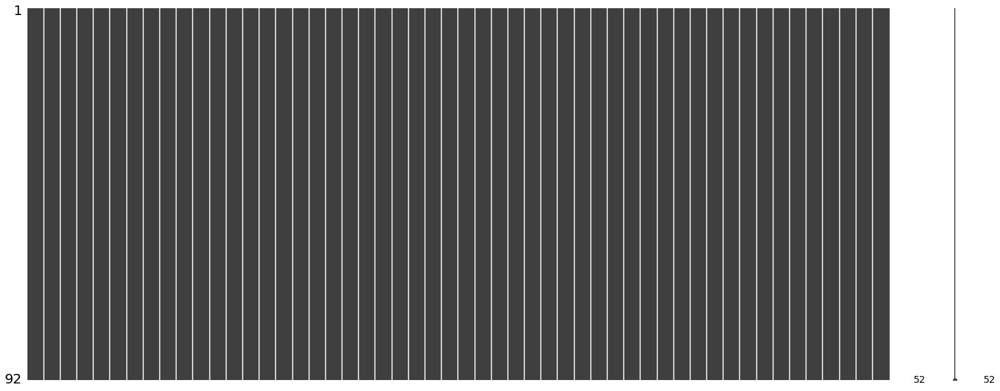

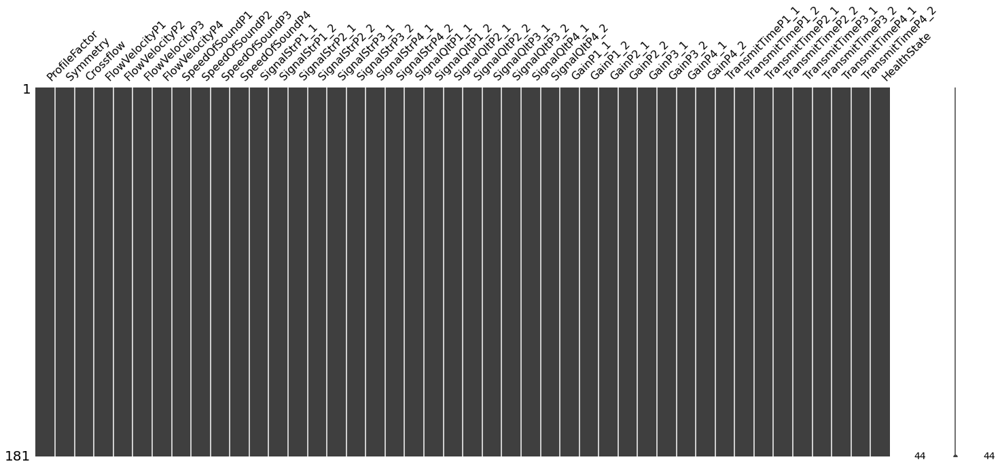

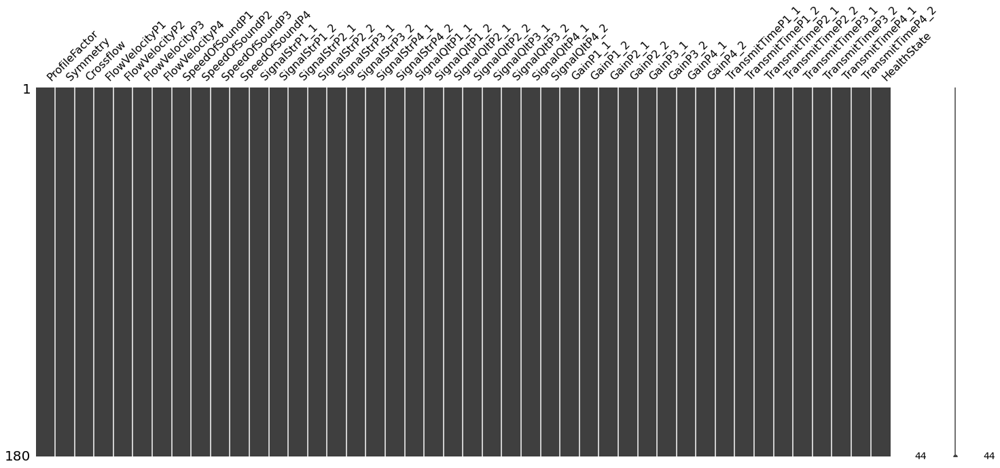

In [3]:
# meter B
msno.matrix(df_B)

# meter C
msno.matrix(df_C)

# meter D
msno.matrix(df_D)

### __1.4. Duplicated data__

In [4]:
# meter B
dups = df_B.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

# meter C
dups = df_C.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

# meter D
dups = df_D.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0
Number of duplicate rows = 0
Number of duplicate rows = 0


Observation:
There is no duplicated data

## __2. Exploratory Data analysis (EDA)__

In [212]:
# for plotting graphs (label-meterB, label2-meterCD)
label = {1:"Healthy", 2:"Gas injection", 3:"Waxing"}
label2 = {1:"Healthy", 2:"Gas injection", 3:"Installation Effects", 4:"Waxing"}

label_list = ["Healthy", "Gas injection", "Waxing"]
label_list2 =  ["Healthy", "Gas injection", "Installation Effects", "Waxing"]

def plotCorrMatHeatMap(df):
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    # Compute correlation matrix
    corr = df.corr()
    # Set up the matplotlib figure
    mask = np.triu(np.ones_like(corr, dtype=bool))
    # f, ax = plt.subplots(figsize=(df.shape[1], df.shape[1]))   
    plt.figure(figsize=(df.shape[1], df.shape[1]))
    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(df.corr(), cmap=cmap, center=0, annot = True, vmin =-1, vmax=1,
                square=True, linewidths=.5, cbar_kws={"shrink": .75})
    plt.show()

# sns.pairplot(df_D[['ProfileFactor','Crossflow', 'HealthState']], hue="HealthState")
# plt.gcf().set_size_inches(12, 6) #set size of pairplot
# plt.show()

# Plot
#Gas injection', 'Healthy', 'Waxing', 'Installation Effects'
# def plotScatter(feature_1, feature_2, df):
#     plt.figure(figsize=(10,7))
#     sns.scatterplot(x=df[f'{feature_1}'], y=df[f'{feature_2}'], s=70, hue=df['HealthState'].map(label), palette=['blue', 'orange', 'green', 'red'])
#     plt.title(f'{feature_1} vs {feature_2}')
#     plt.xlabel(f'{feature_1}')
#     plt.ylabel(f'{feature_2}')
#     plt.show()

palette ={ 'Healthy': 'green', 'Gas injection': 'orange', 'Installation Effects':'blue', 'Waxing':'red'}
edgecolor = 'grey'

color = ["green", "orange", "red"]
color2 = ["green", "orange", "blue", "red"]

def plotScatter(feature_1, feature_2, df):
    fig = plt.figure(figsize=(10,7))
    mapped = None
    if df['HealthState'].nunique() == 3:
        mapped = label
    else:
        mapped = label2

    # plt.subplot(221)
    ax1 = sns.scatterplot(x = df[f'{feature_1}'], y=df[f'{feature_2}'], hue = df['HealthState'].map(mapped),
                        palette = palette, edgecolor=edgecolor, alpha=0.5)
    plt.title(f'{feature_1} vs {feature_2}')
    plt.show()

def plotTargetCount(Y, label=""):
    # plt.rcdefaults()
    params = {'figure.figsize' : (6.4, 4.8)}
    plt.rcParams.update(params)
    c = None
    l = None 
    if Y.nunique() == 3:
        c = color
        l = label_list
    else:
        c = color2
        l = label_list2

    ax = sns.countplot(x=Y, label="Count", palette=c)
    ax.bar_label(ax.containers[0])
    # ax.set_xticklabels(['Healthy', 'Gas injection', 'Installation Effects', 'Waxing'], fontsize=8)
    ax.set_title(label)
    plt.show()
    
    #create pie chart
    # colors = sns.color_palette('pastel')[0:5]
    # plt.pie(Y.value_counts(), labels = l, colors = c, autopct='%.0f%%')
    
    # plt.show()

def plotBoxplot(attriList, df):
    for col in attriList:
        plt.figure(figsize = (15, 8))
        # sns.boxplot(x="variable", y="value", data=pd.melt(df[attri])) # vertical
        sns.boxplot(data=df[col], orient="h") # horizontal version 
        # sns.boxplot(x="variable", y="value", data=pd.melt(X[attri])).set(xlabel='FICO Score', ylabel='Interest Rate') #vertical with label
        plt.show()

    for col in attriList:
        plt.figure(figsize = (15, 8))
        sns.boxplot(x="variable", y="value",hue='HealthState', data=pd.melt(pd.concat([df.loc[:,col],df.loc[:,'HealthState']], axis=1), id_vars=['HealthState']))
        plt.show()
        
def plotBoxplot2(attriList, df, row=3, col=3):
    # #  Categorical Data
    a = row  # number of rows
    b = col  # number of columns
    c = 1  # initialize plot counter
   
    # plt.figure(figsize = (15, 8))
    plt.figure(figsize = (20, 15))

    for i in attriList:
        plt.subplot(a, b, c)
        # plt.title('{}, subplot: {},{},{}'.format(i, a, b, c))
        # plt.xlabel(i)
        # sns.countplot(df_B[i])
        sns.boxplot(data=df[i], orient="h")
        c = c + 1

    plt.tight_layout()
    plt.show()

def plotBoxplot3(attriList, df, row=3, col=3):
    a = row  # number of rows
    b = col  # number of columns
    c = 1  # initialize plot counter

    plt.figure(figsize = (20, 15))

    for i in attriList:
        plt.subplot(a, b, c)
        sns.boxplot(x="variable", y="value",hue='HealthState', data=pd.melt(pd.concat([df.loc[:,i],df.loc[:,'HealthState']], axis=1), id_vars=['HealthState']))
        c = c + 1

    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()


def removeOutliersIQR(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - (1.5*IQR)
    upper_bound = Q3 + (1.5*IQR)

    filtered = ~((df < lower_bound) | (df > upper_bound)).any(axis=1)
    clean_df = df[filtered]

    return clean_df

def removeOutliersIQRByGroup(df):
    clean_df_list = []
    classGrp = df.groupby('HealthState')

    for index in range(1, len(classGrp)+1):
        clean_df = removeOutliersIQR(classGrp.get_group(index))
        clean_df_list.append(clean_df)
    
    return pd.concat(clean_df_list)

def plotHistogram(df):
    _, axes = plt.subplots(17,3, figsize=(20, 60))
    ax = axes.ravel() 
    if df['HealthState'].nunique() == 3:
        for i in range(df.shape[1] - 1):                 
            bins = 60  
            healthyDF = df[df['HealthState'] == 1] 
            gasInjectionDF = df[df['HealthState'] == 2] 
            waxingDF = df[df['HealthState'] == 3] 
            ax[i].hist(healthyDF.iloc[:,i], bins=bins, color='g', alpha=0.5)
            ax[i].hist(gasInjectionDF.iloc[:,i], bins=bins, color='b', alpha=0.3)    
            ax[i].hist(waxingDF.iloc[:,i], bins=bins, color='r', alpha=0.2)
            ax[i].set_title(df.columns[i], fontsize=15)        
            ax[i].legend(['Healthy','Gas Injection','Waxing'], loc='best', fontsize=8)
    else:
        for i in range(df.shape[1] - 1):                  
            bins = 60  
            healthyDF = df[df['HealthState'] == 1] 
            gasInjectionDF = df[df['HealthState'] == 2] 
            installationEffectsDF = df[df['HealthState'] == 3] 
            waxingDF = df[df['HealthState'] == 4] 
            ax[i].hist(healthyDF.iloc[:,i], bins=bins, color='g', alpha=0.5)
            ax[i].hist(gasInjectionDF.iloc[:,i], bins=bins, color='b', alpha=0.3)   
            ax[i].hist(installationEffectsDF.iloc[:,i], bins=bins, color='r', alpha=0.4)
            ax[i].hist(waxingDF.iloc[:,i], bins=bins, color='y', alpha=0.2)
            ax[i].set_title(df.columns[i], fontsize=15)        
            ax[i].legend(['Healthy','Gas Injection','Installation effects','Waxing'], loc='best', fontsize=8)

    plt.tight_layout()
    plt.show()


### __2.B__

#### __2.B.1 General information__

In [6]:
df_B.head()

,ProfileFactor,Symmetry,Crossflow,SwirlAngle,FlowVelocityP1,FlowVelocityP2,FlowVelocityP3,FlowVelocityP4,AvgFlowVelocity,SpeedOfSoundP1,...,GainP4_2,TransmitTimeP1_1,TransmitTimeP1_2,TransmitTimeP2_1,TransmitTimeP2_2,TransmitTimeP3_1,TransmitTimeP3_2,TransmitTimeP4_1,TransmitTimeP4_2,HealthState
0,1.185089,1.028128,1.016478,0.1500,2.195744,2.540944,2.511961,2.087889,2.394439,1483.869833,...,49.8,84.107067,84.003098,120.338783,120.144244,120.371772,120.179078,84.019053,83.919971,1
1,1.191806,1.033750,1.019411,0.2170,2.192467,2.546594,2.516744,2.075706,2.396089,1483.747389,...,49.8,84.114116,84.009973,120.349089,120.153889,120.381700,120.188800,84.025607,83.927260,1
2,1.181983,1.028089,1.020994,0.0889,3.246672,3.738378,3.715217,3.079356,3.523517,1483.777056,...,49.8,84.137487,83.983336,120.392450,120.106206,120.425422,120.140578,84.047809,83.901593,1
3,1.182761,1.028783,1.021072,0.1170,3.244489,3.741861,3.718839,3.080400,3.525933,1483.847444,...,49.8,84.133493,83.979407,120.387033,120.100444,120.419883,120.134933,84.043715,83.897597,1
4,1.182272,1.028922,1.021350,0.0222,3.245944,3.742217,3.715456,3.080950,3.525128,1483.819056,...,49.8,84.135354,83.980807,120.389361,120.102800,120.422050,120.137472,84.045346,83.898959,1


In [7]:
df_B.describe()

,ProfileFactor,Symmetry,Crossflow,SwirlAngle,FlowVelocityP1,FlowVelocityP2,FlowVelocityP3,FlowVelocityP4,AvgFlowVelocity,SpeedOfSoundP1,...,GainP4_2,TransmitTimeP1_1,TransmitTimeP1_2,TransmitTimeP2_1,TransmitTimeP2_2,TransmitTimeP3_1,TransmitTimeP3_2,TransmitTimeP4_1,TransmitTimeP4_2,HealthState
count,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,...,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000
mean,1.550166,0.829287,0.814946,0.690942,4.120882,4.981197,4.897354,3.183318,4.673391,1408.931444,...,69.450176,78.603632,78.411524,118.026201,117.647109,119.273272,118.900991,68.747999,68.603348,2.326087
std,1.161946,0.431154,0.432390,0.817834,1.865454,2.120780,1.979600,2.048628,1.900039,271.067536,...,18.448332,14.880508,14.841298,11.577071,11.542253,3.449410,3.458579,30.593764,30.530074,0.799845
min,-0.909168,-0.000233,-0.005494,-1.410000,-0.067617,0.881794,1.299422,0.000000,1.256283,41.149556,...,49.800000,2.337279,2.340476,20.124378,20.056861,91.382267,91.026656,0.000000,0.000000,1.000000
25%,1.182639,0.824857,0.784160,0.022217,2.905011,3.512235,3.324794,1.644943,3.225096,1483.325278,...,49.800000,80.509385,80.317608,119.360682,119.087846,119.103836,118.700189,80.457636,80.280803,2.000000
50%,1.274308,1.029114,1.021306,0.340000,4.196814,5.595289,5.410861,3.079878,5.295886,1483.882472,...,80.487500,84.135961,83.895873,120.390906,119.971947,120.316489,120.000478,80.541799,80.351317,3.000000
75%,1.372697,1.097043,1.053039,1.722000,5.899100,6.814089,6.455026,4.852438,6.200565,1484.281931,...,80.975417,84.185978,83.959031,120.490947,120.098428,120.506336,120.138249,84.020692,83.834637,3.000000
max,10.208497,1.497856,1.992583,2.200000,7.454328,8.843761,8.497083,7.104811,8.250361,1550.966889,...,97.501667,84.762891,84.405013,120.924622,120.458372,121.003439,120.553911,84.685309,84.401998,3.000000


array([[<AxesSubplot:title={'center':'ProfileFactor'}>,
        <AxesSubplot:title={'center':'Symmetry'}>,
        <AxesSubplot:title={'center':'Crossflow'}>,
        <AxesSubplot:title={'center':'SwirlAngle'}>,
        <AxesSubplot:title={'center':'FlowVelocityP1'}>,
        <AxesSubplot:title={'center':'FlowVelocityP2'}>,
        <AxesSubplot:title={'center':'FlowVelocityP3'}>],
       [<AxesSubplot:title={'center':'FlowVelocityP4'}>,
        <AxesSubplot:title={'center':'AvgFlowVelocity'}>,
        <AxesSubplot:title={'center':'SpeedOfSoundP1'}>,
        <AxesSubplot:title={'center':'SpeedOfSoundP2'}>,
        <AxesSubplot:title={'center':'SpeedOfSoundP3'}>,
        <AxesSubplot:title={'center':'SpeedOfSoundP4'}>,
        <AxesSubplot:title={'center':'AvgSpeedOfSound'}>],
       [<AxesSubplot:title={'center':'SignalStrP1_1'}>,
        <AxesSubplot:title={'center':'SignalStrP1_2'}>,
        <AxesSubplot:title={'center':'SignalStrP2_1'}>,
        <AxesSubplot:title={'center':'SignalSt

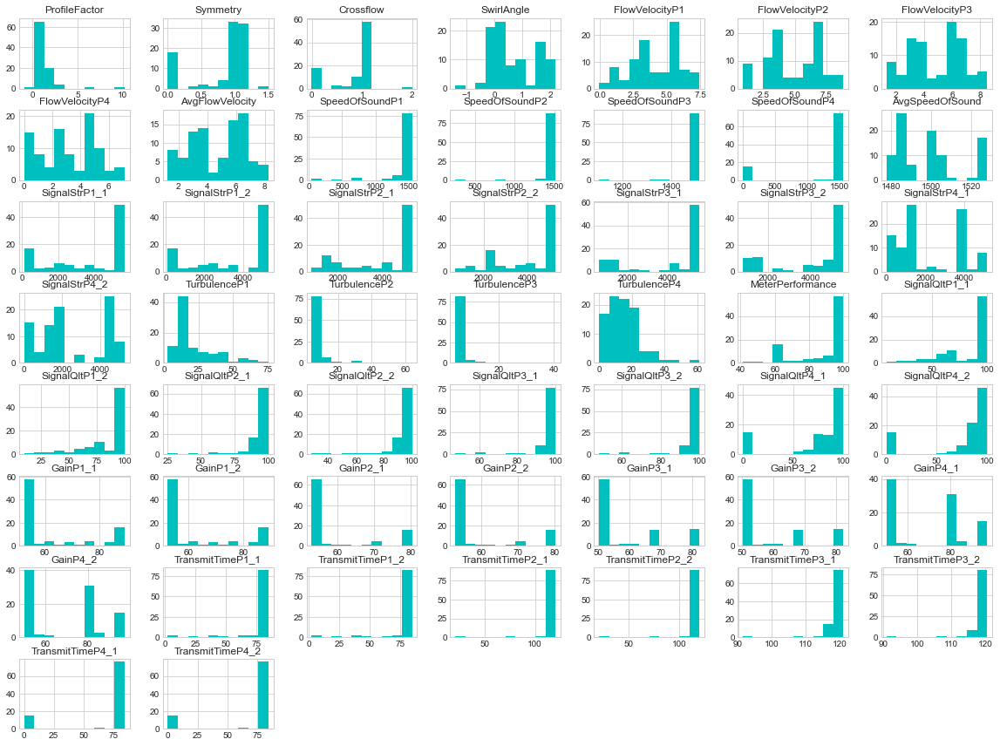

In [158]:
# for col in df_B:
#     fig = plt.figure(figsize=(15,10))
#     sns.displot(df_B[col], bins=30, kde=True)
#     plt.title(f'Distribution for {col}')
#     plt.xlabel(f'{col}')
#     plt.ylabel('Frequency')

test = df_B.drop('HealthState', axis=1)
(test+0.001).hist(figsize=(20, 15), color = 'c')

# plt.style.use('seaborn-whitegrid')
# df_B.hist(bins=20, figsize=(60,40), color='lightblue', edgecolor = 'red')
# plt.show()

#### __2.B.2. Target class distribution__

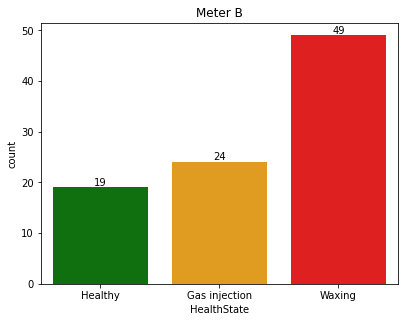

In [8]:
X_B = df_B.drop('HealthState', axis=1)
Y_B = df_B['HealthState']
Y_B_map = df_B['HealthState'].map(label)

# entire dataframe with target class mapped
df_B_map = pd.concat([X_B, Y_B_map], axis=1)

plotTargetCount(Y_B_map, "Meter B")
# plt.pie(Y_B_map.value_counts(), labels = Y_B_map.value_counts().index, colors=color, autopct='%.0f%%')
    
# plt.show()
# Y_B.value_counts().sort_index()


#### __2.B.3. Features distribution__

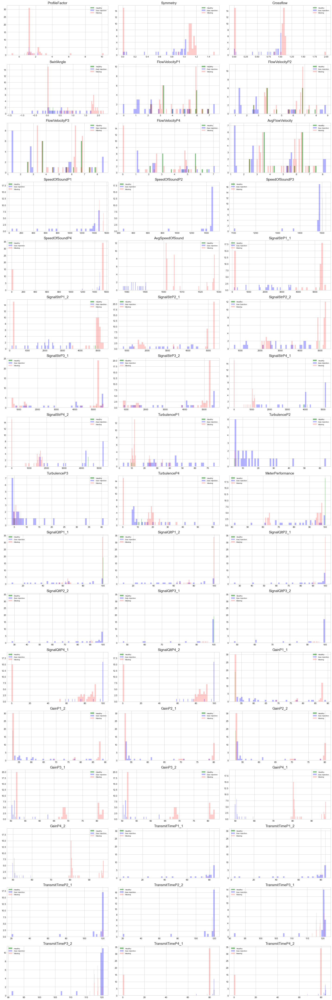

In [151]:
plotHistogram(df_B)

#### __2.B.X. Correlation Matrix__

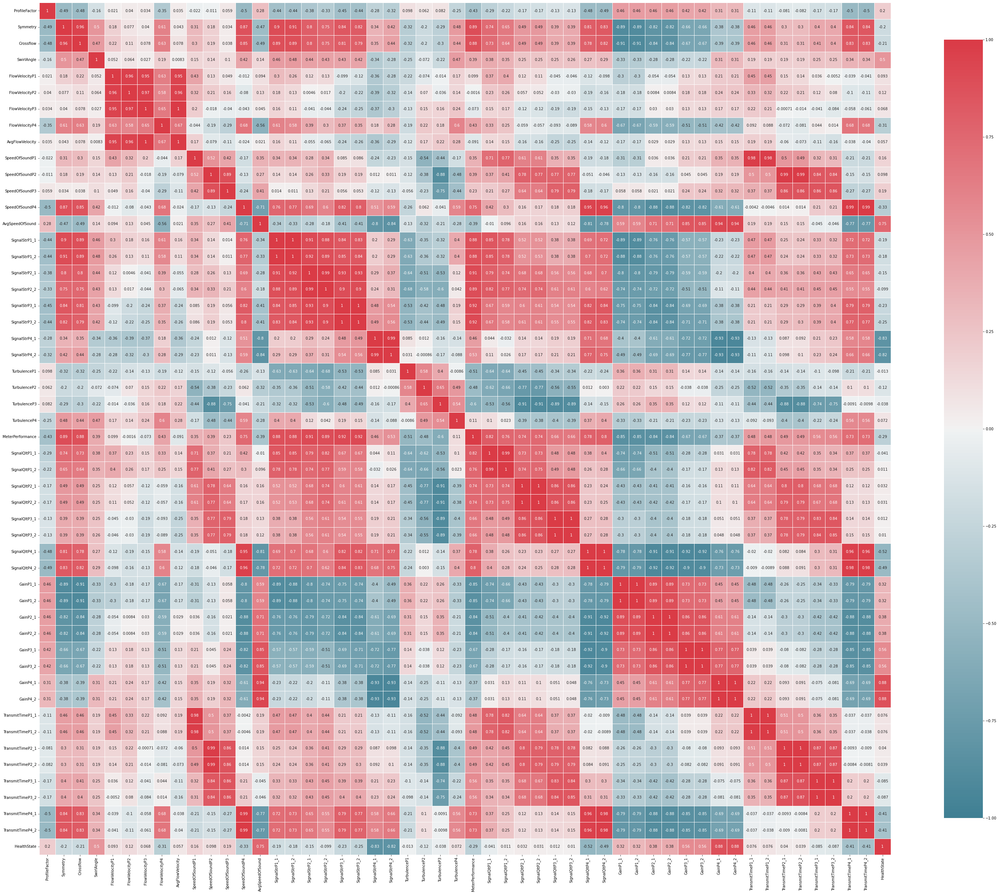

In [9]:
plotCorrMatHeatMap(df_B)

#### __2.B.X. Positive Correlated features__

#### __2.B.X. Negative Correlated features__

#### __2.B.X. Detecting Outliers__

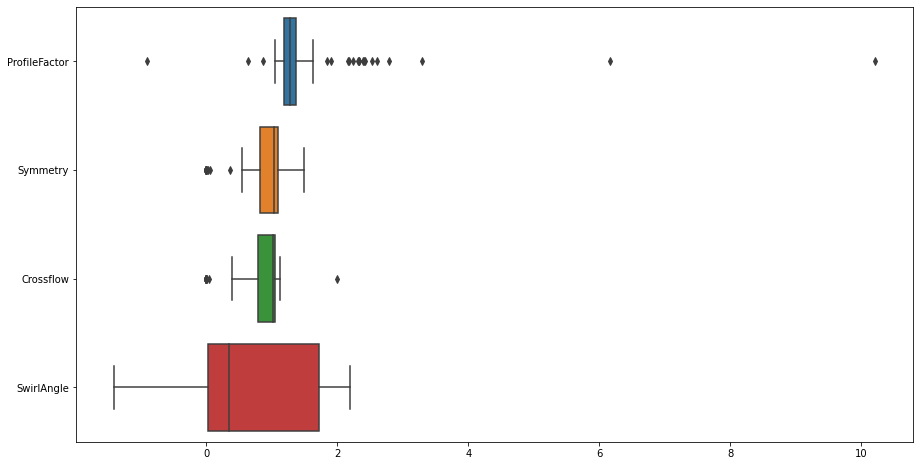

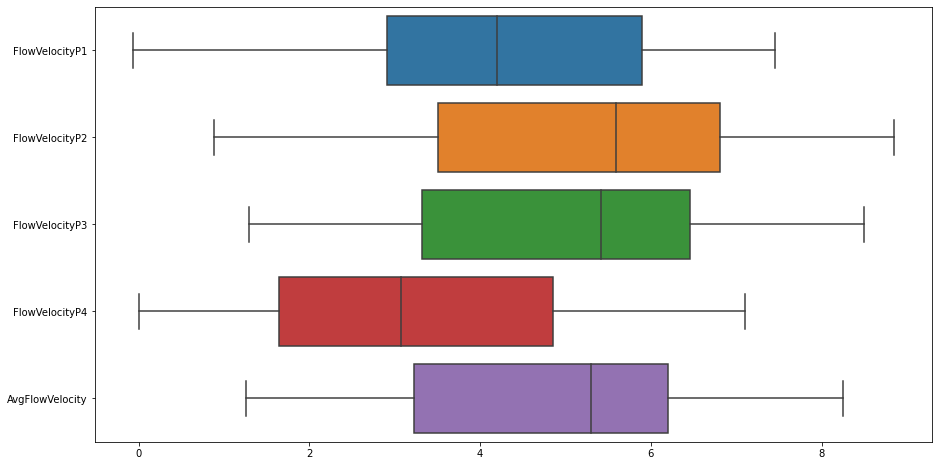

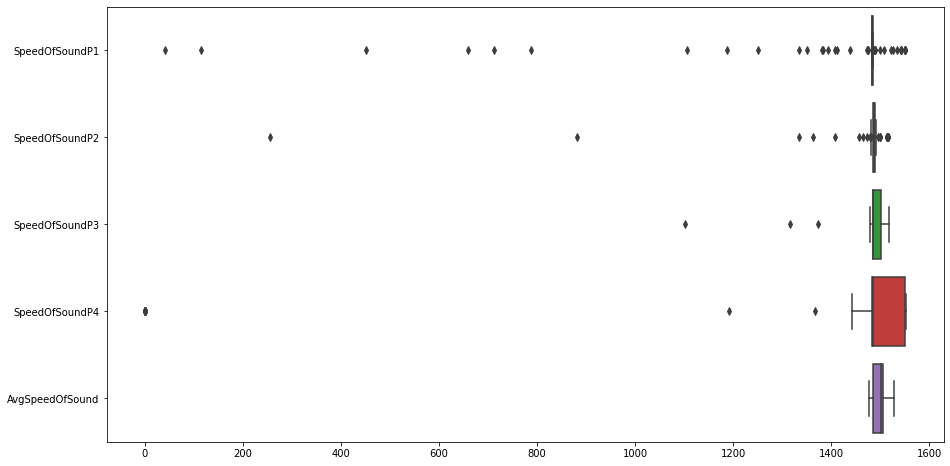

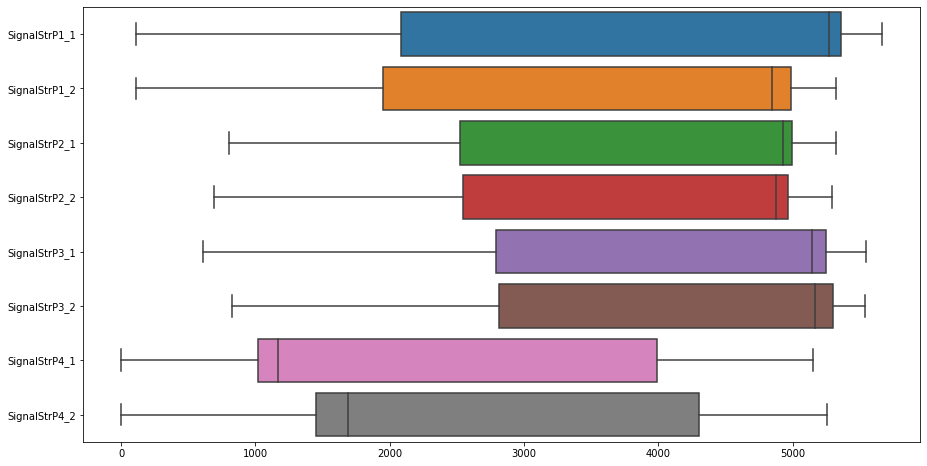

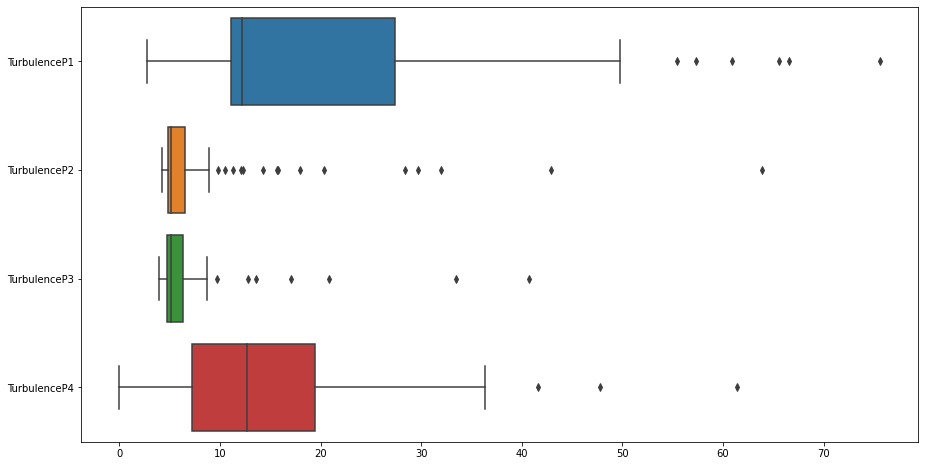

...

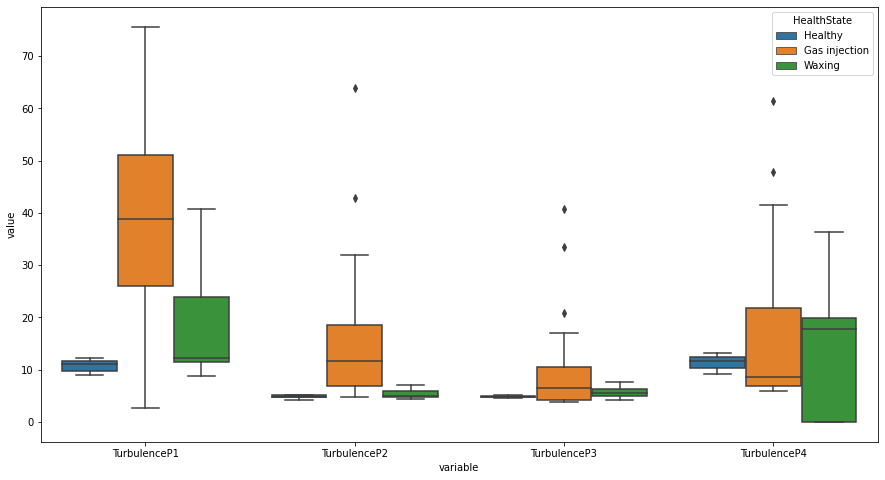

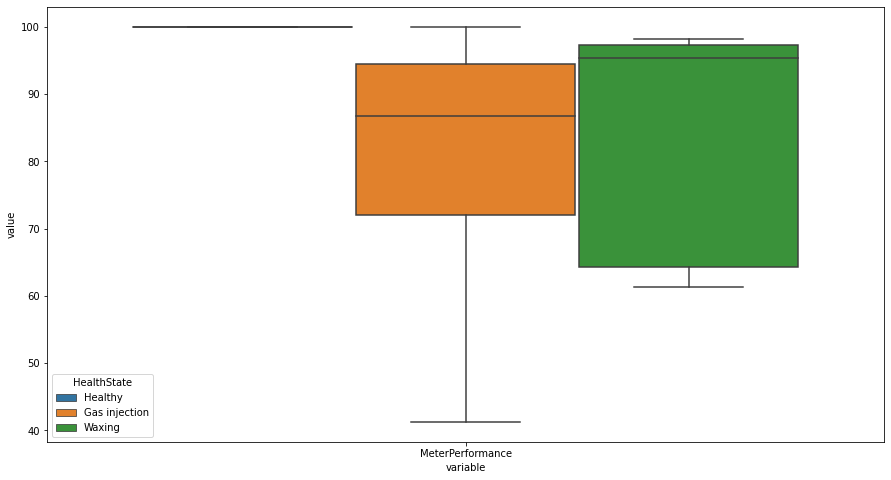

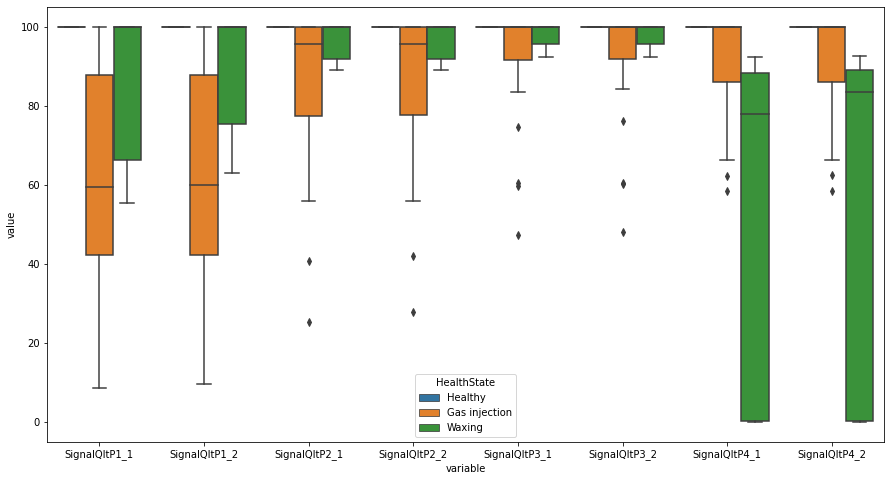

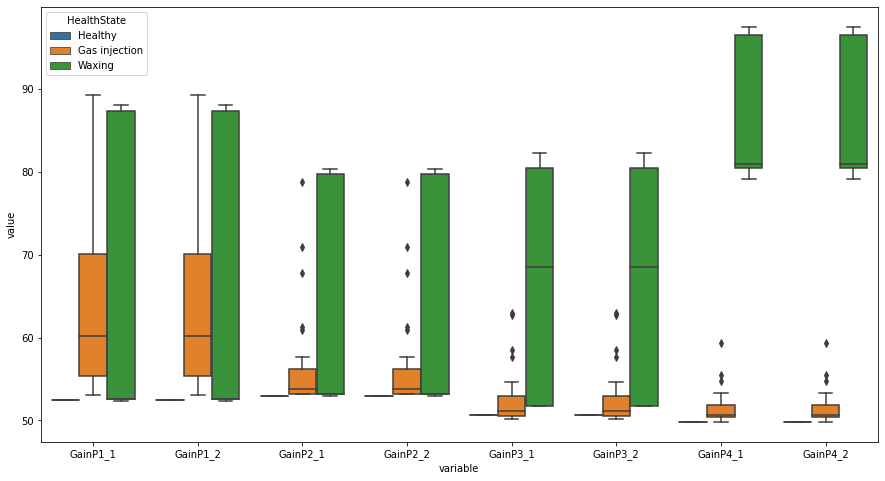

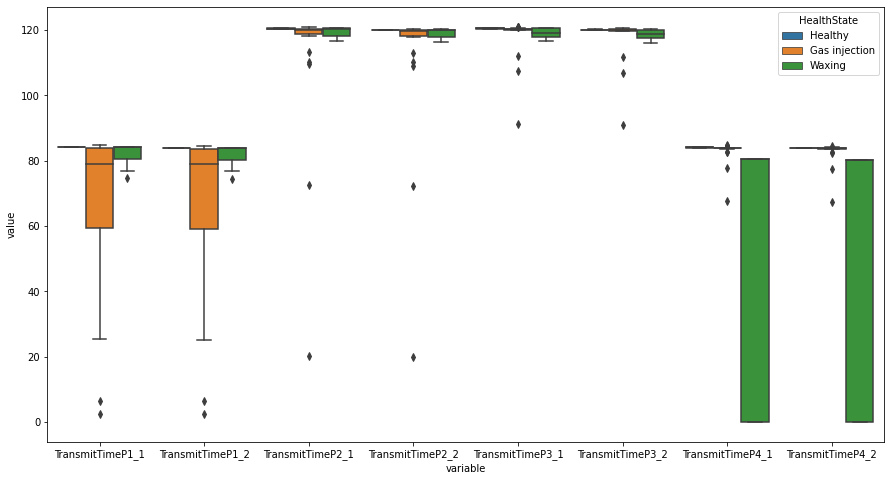

In [140]:
# group by columns
firstCol = df_B.columns[0:4].to_list() #'ProfileFactor', 'Symmetry', 'Crossflow', 'SwirlAngle
flowVelocity = df_B.columns[4:9].to_list() #'FlowVelocityP1','FlowVelocityP2', 'FlowVelocityP3','FlowVelocityP4', 'AvgFlowVelocity'
speedOfSound = df_B.columns[9:14].to_list() # 'SpeedOfSoundP1', 'SpeedOfSoundP2', 'SpeedOfSoundP3', 'SpeedOfSoundP4', 'AvgSpeedOfSound'
signalStr = df_B.columns[14:22].to_list()
turbulence = df_B.columns[22:26].to_list()
meterPerformance = df_B.columns[26:27].to_list()
signalQlt = df_B.columns[27:35].to_list()
gain = df_B.columns[35:43].to_list()
transmitTime = df_B.columns[43:51].to_list()

# list of all attributes in groups
attri_B = []
attri_B.extend([firstCol, flowVelocity, speedOfSound, signalStr, turbulence, meterPerformance, signalQlt, gain, transmitTime])

plotBoxplot(attri_B, df_B_map)

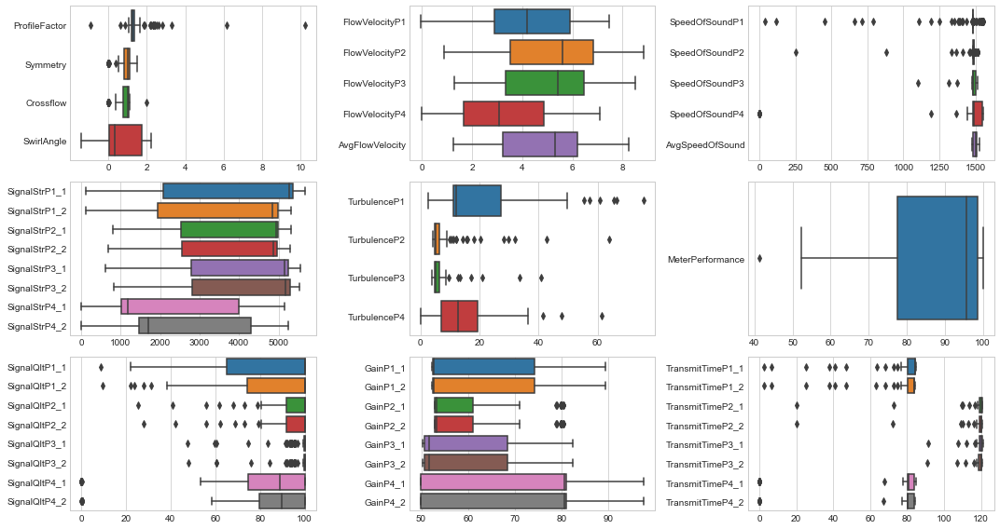

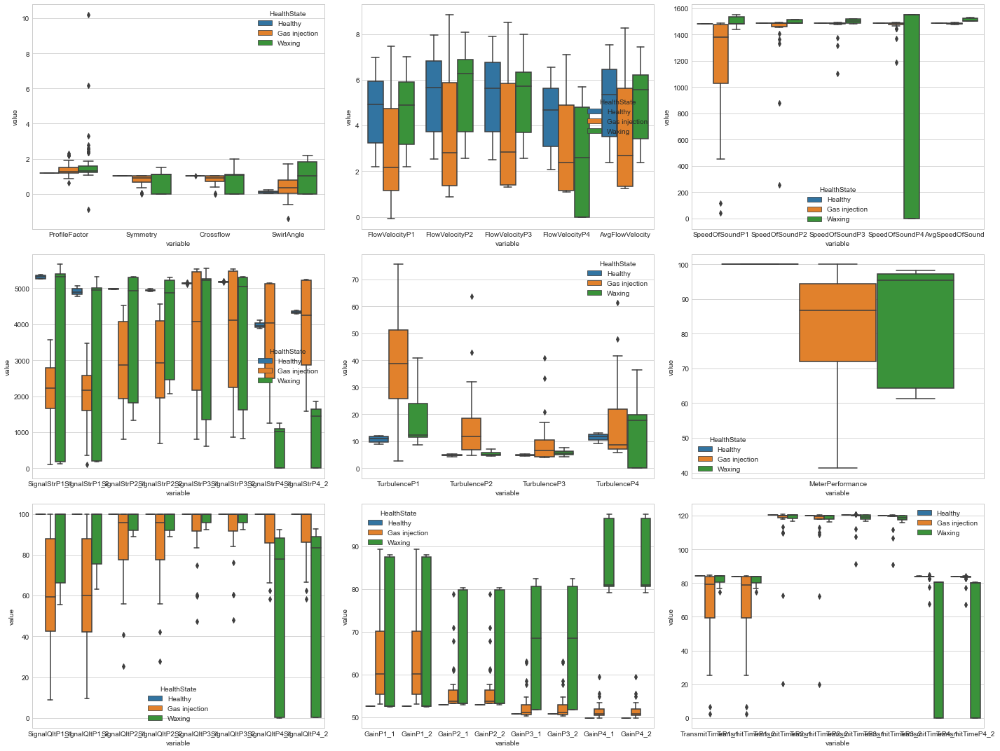

In [206]:
plotBoxplot2(attri_B, df_B)
plotBoxplot3(attri_B, df_B_map)

#### __2.B.X. Remove Outliers__

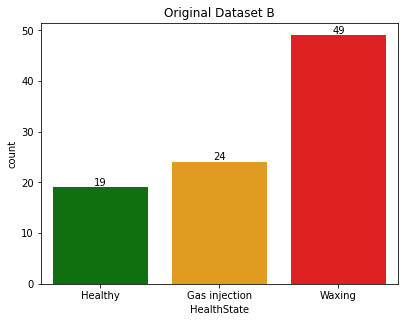

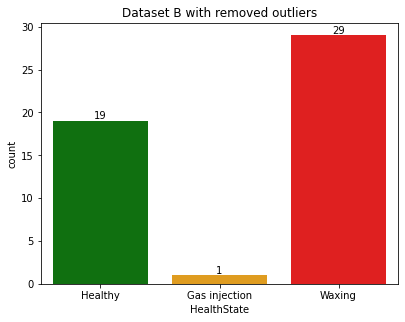

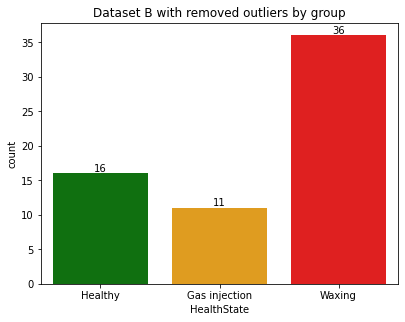

In [141]:
plotTargetCount(Y_B_map, "Original Dataset B")

df_B_clean_single = removeOutliersIQR(df_B)
plotTargetCount(df_B_clean_single['HealthState'].map(label), "Dataset B with removed outliers")

df_B_clean = removeOutliersIQRByGroup(df_B)
plotTargetCount(df_B_clean['HealthState'].map(label), "Dataset B with removed outliers by group")

### __2.C__

#### __2.C.1 General information__

In [10]:
df_C.head()

,ProfileFactor,Symmetry,Crossflow,FlowVelocityP1,FlowVelocityP2,FlowVelocityP3,FlowVelocityP4,SpeedOfSoundP1,SpeedOfSoundP2,SpeedOfSoundP3,...,GainP4_2,TransmitTimeP1_1,TransmitTimeP1_2,TransmitTimeP2_1,TransmitTimeP2_2,TransmitTimeP3_1,TransmitTimeP3_2,TransmitTimeP4_1,TransmitTimeP4_2,HealthState
0,1.102690,1.004425,1.006741,15.228611,16.676389,16.713056,15.051389,1485.447222,1485.416667,1485.491667,...,17.7,86.585833,85.576667,106.985000,105.530833,106.714444,105.255833,86.461111,85.460833,1
1,1.101432,1.003722,1.008256,14.106667,15.407500,15.473889,13.930833,1485.222222,1485.211111,1485.288889,...,17.7,86.560000,85.628056,106.942500,105.603611,106.676111,105.326667,86.433889,85.510556,1
2,1.098568,1.002528,1.009103,14.136667,15.388056,15.484444,13.965833,1485.061111,1485.047222,1485.133333,...,17.7,86.572222,85.635278,106.954722,105.614722,106.686389,105.336389,86.444722,85.519167,1
3,1.099516,1.007024,1.009363,14.146389,15.405000,15.439167,13.906111,1485.144444,1485.113889,1485.216667,...,17.7,86.566111,85.630833,106.952500,105.609444,106.681389,105.331667,86.439722,85.515833,1
4,1.100336,1.000661,1.006709,14.056944,15.363611,15.452222,13.948889,1485.202778,1485.180556,1485.272222,...,17.7,86.561111,85.630833,106.946667,105.603889,106.676111,105.328889,86.436944,85.512222,1


In [11]:
df_C.describe()

,ProfileFactor,Symmetry,Crossflow,FlowVelocityP1,FlowVelocityP2,FlowVelocityP3,FlowVelocityP4,SpeedOfSoundP1,SpeedOfSoundP2,SpeedOfSoundP3,...,GainP4_2,TransmitTimeP1_1,TransmitTimeP1_2,TransmitTimeP2_1,TransmitTimeP2_2,TransmitTimeP3_1,TransmitTimeP3_2,TransmitTimeP4_1,TransmitTimeP4_2,HealthState
count,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,...,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000,181.000000
mean,3.171737,0.981282,0.859154,9.263857,10.934682,9.919550,10.414145,1590.833610,1404.180909,1326.739288,...,23.089441,83.971768,83.026743,102.277376,101.176097,96.806148,96.112049,86.583203,85.738448,2.552486
std,20.483482,0.353301,0.358915,5.102822,4.959069,5.740579,4.027330,370.484564,327.144298,445.585034,...,31.710203,13.375457,13.505744,24.185064,23.779168,32.647868,32.453512,6.535539,6.585082,1.184979
min,-0.750000,-0.181818,-0.735294,0.000000,-0.020000,-0.250000,0.170000,1026.900000,0.000000,0.000000,...,17.300000,48.530000,47.070000,0.000000,0.000000,0.000000,0.000000,24.029722,23.761111,1.000000
25%,1.097551,0.999877,1.002730,7.513611,8.290000,6.763333,7.500000,1484.591667,1484.213889,1484.033333,...,17.700000,86.318611,85.603889,106.622222,105.600556,106.323611,105.308889,86.242222,85.518889,1.000000
50%,1.101883,1.004159,1.008033,9.347500,10.302778,8.487222,11.565833,1485.102778,1484.677778,1484.705556,...,18.000000,86.451944,85.680556,106.769444,105.736944,106.458056,105.467778,86.356111,85.633889,3.000000
75%,1.105461,1.007860,1.009775,14.015278,15.367500,15.394444,13.931667,1485.886111,1485.447222,1485.463889,...,18.100000,86.575833,85.856389,106.958333,105.953056,106.686389,105.691111,86.465000,85.768611,4.000000
max,196.500000,2.103200,1.098355,16.526667,20.260000,19.753333,16.768056,2675.100000,1627.800000,1622.300000,...,354.116667,124.730000,124.300000,145.840000,144.710000,145.500000,144.340000,125.330000,124.560000,4.000000


#### __2.C.2. Target class distribution__

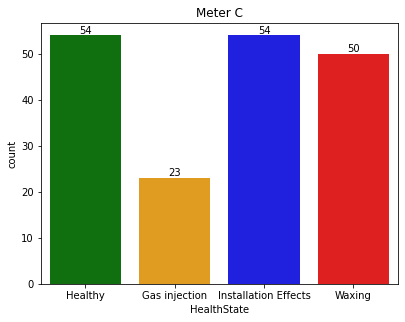

In [12]:
X_C = df_C.drop('HealthState', axis=1)
Y_C = df_C['HealthState']
Y_C_map = df_C['HealthState'].map(label2)

# entire dataframe with target class mapped
df_C_map = pd.concat([X_C, Y_C_map], axis=1)

plotTargetCount(Y_C_map, "Meter C")

#### __2.C.3. Features distribution__

#### __2.C.X. Correlation Matrix__

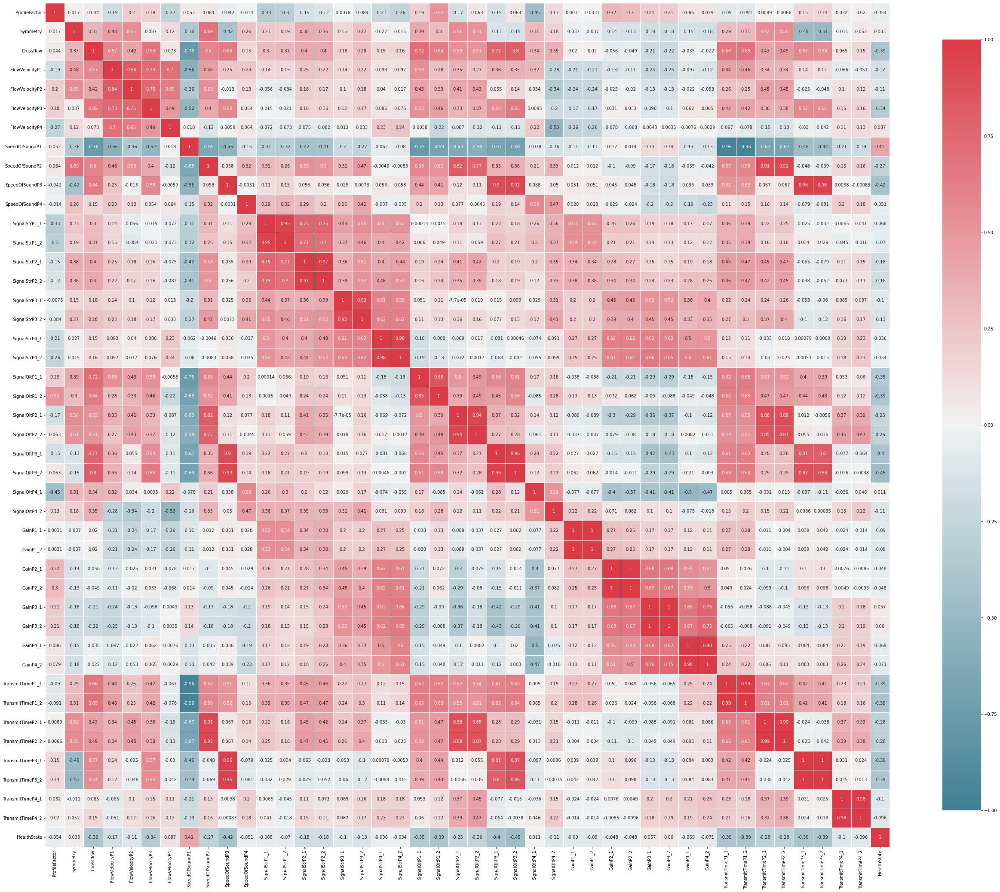

In [13]:
plotCorrMatHeatMap(df_C)

#### __2.C.X. Positive Correlated features__

#### __2.C.X. Negative Correlated features__

#### __2.C.X. Detecting Outliers__

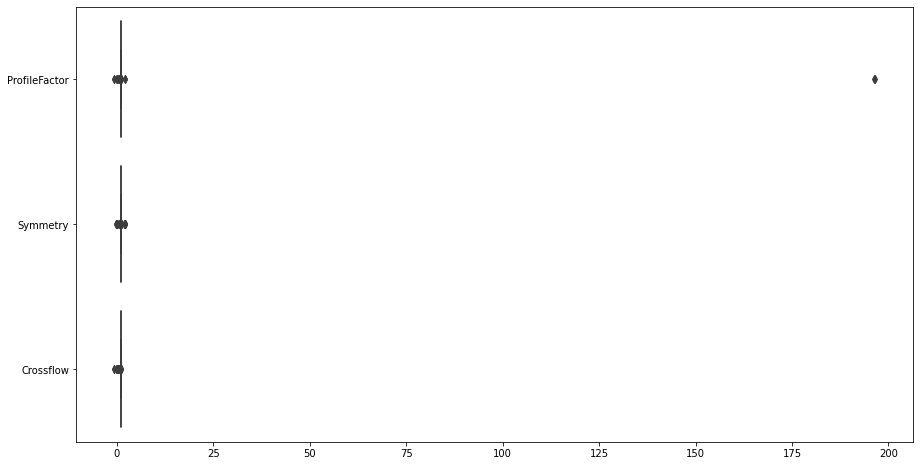

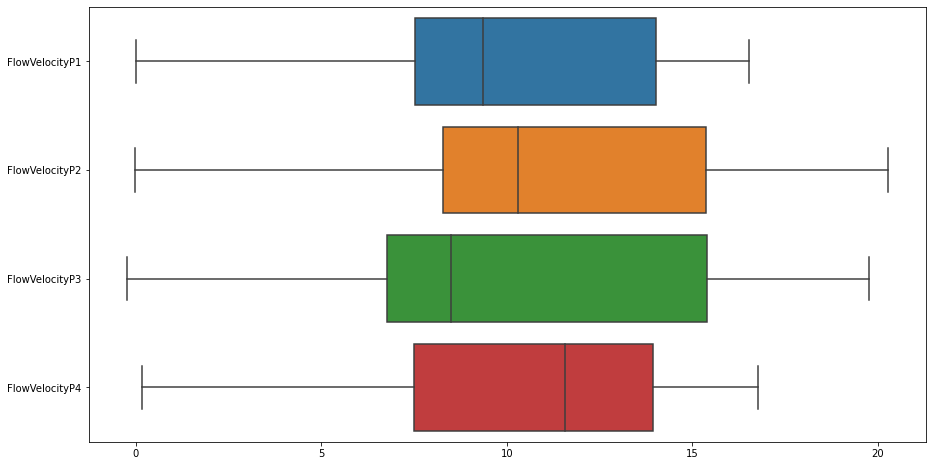

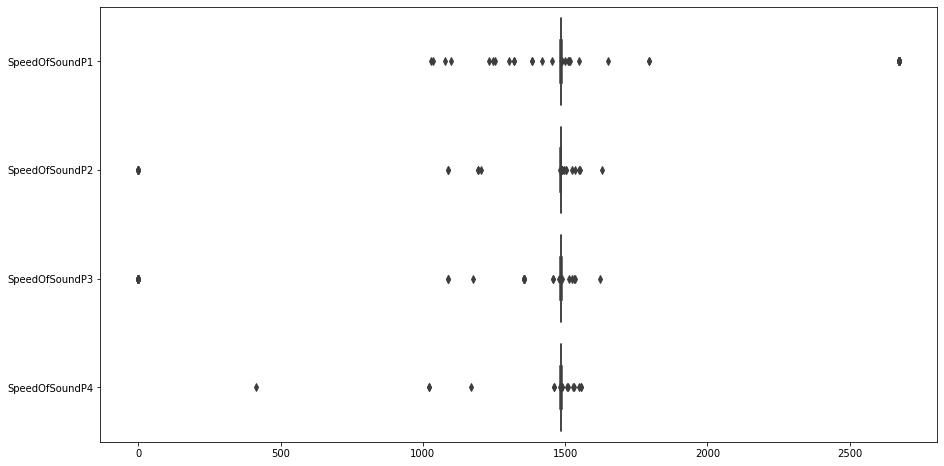

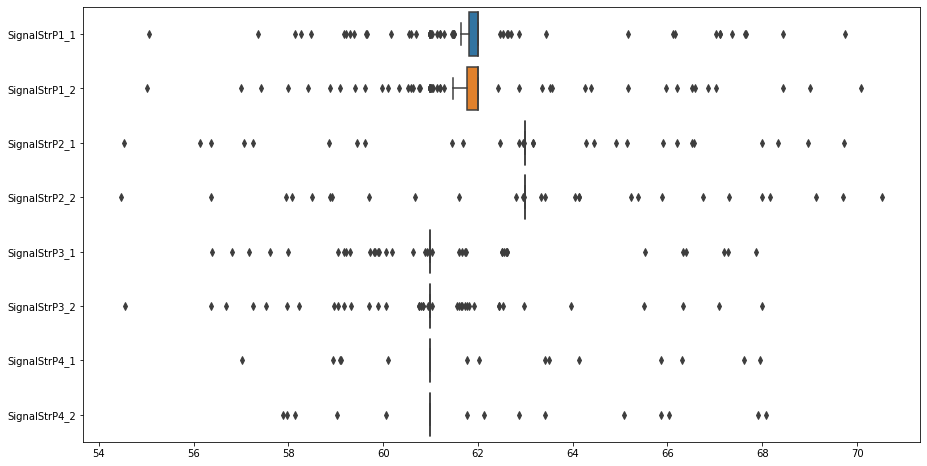

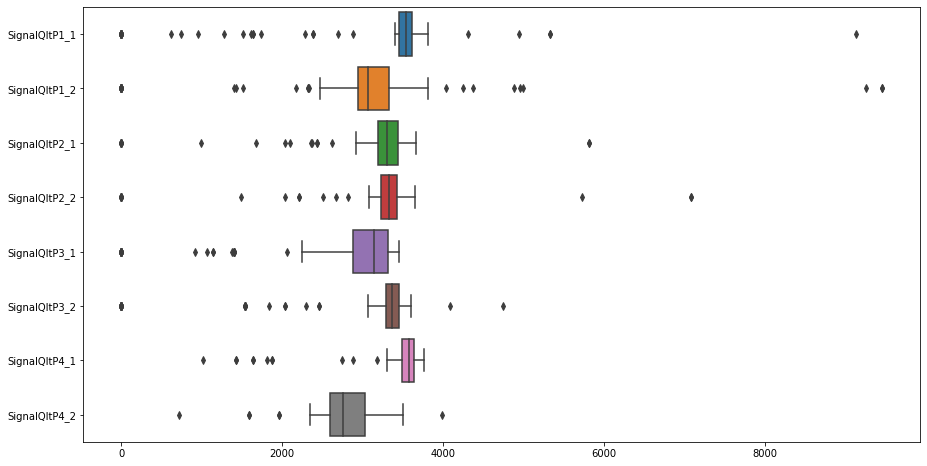

...

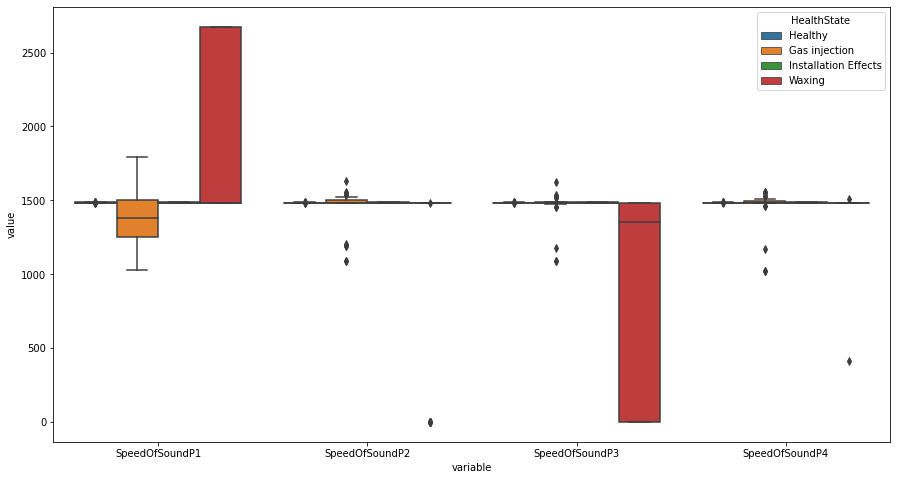

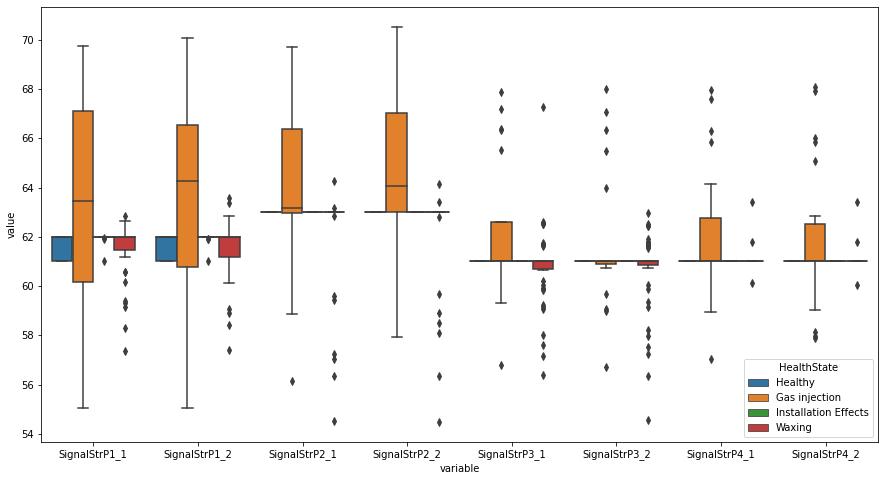

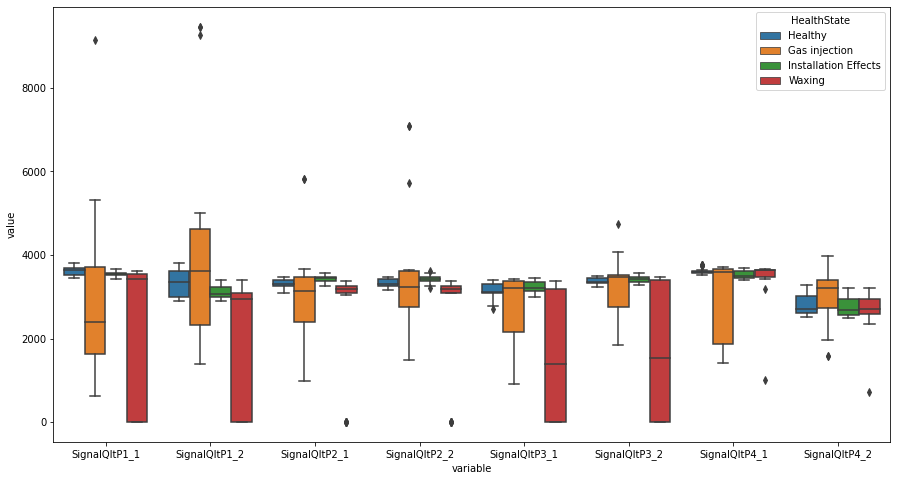

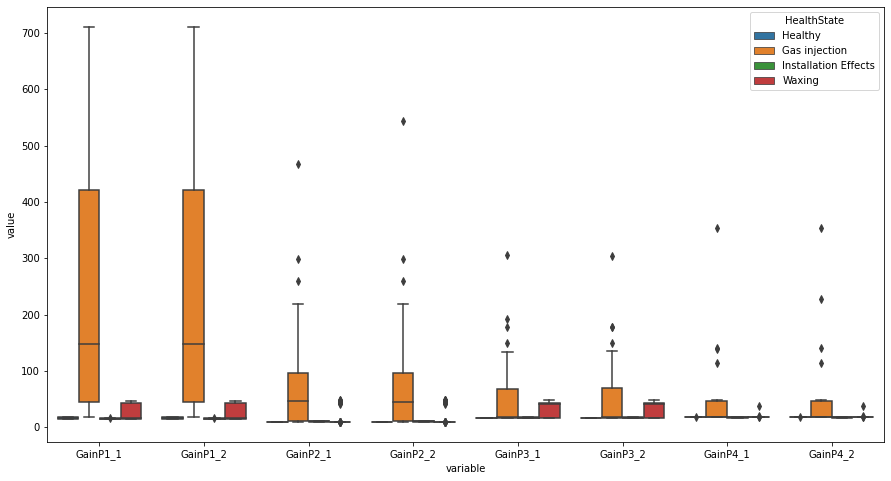

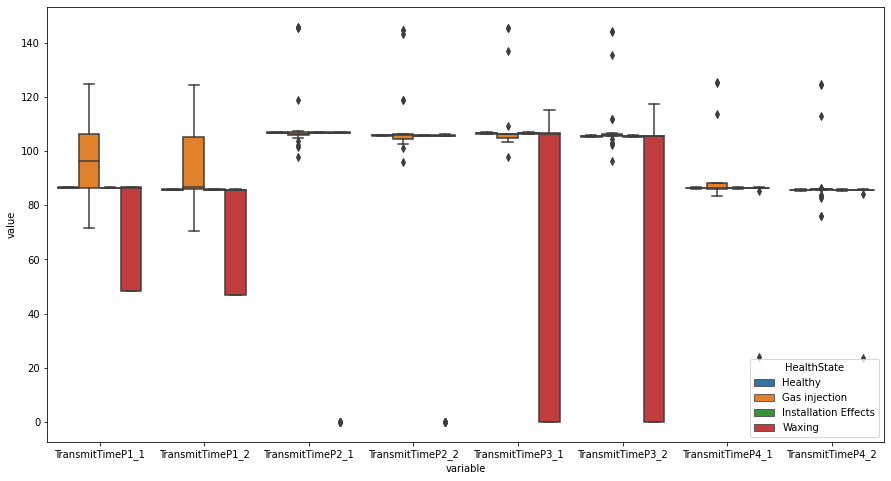

In [103]:
# group by columns
firstCol = df_C.columns[0:3].to_list()
flowVelocity = df_C.columns[3:7].to_list()
speedOfSound = df_C.columns[7:11].to_list()
signalStr = df_C.columns[11:19].to_list()
signalQlt = df_C.columns[19:27].to_list()
gain = df_C.columns[27:35].to_list()
transmitTime = df_C.columns[35:43].to_list()

# list of all attributes in groups
attri_C = []
attri_C.extend([firstCol, flowVelocity, speedOfSound, signalStr, signalQlt, gain, transmitTime])

plotBoxplot(attri_C, df_C_map)

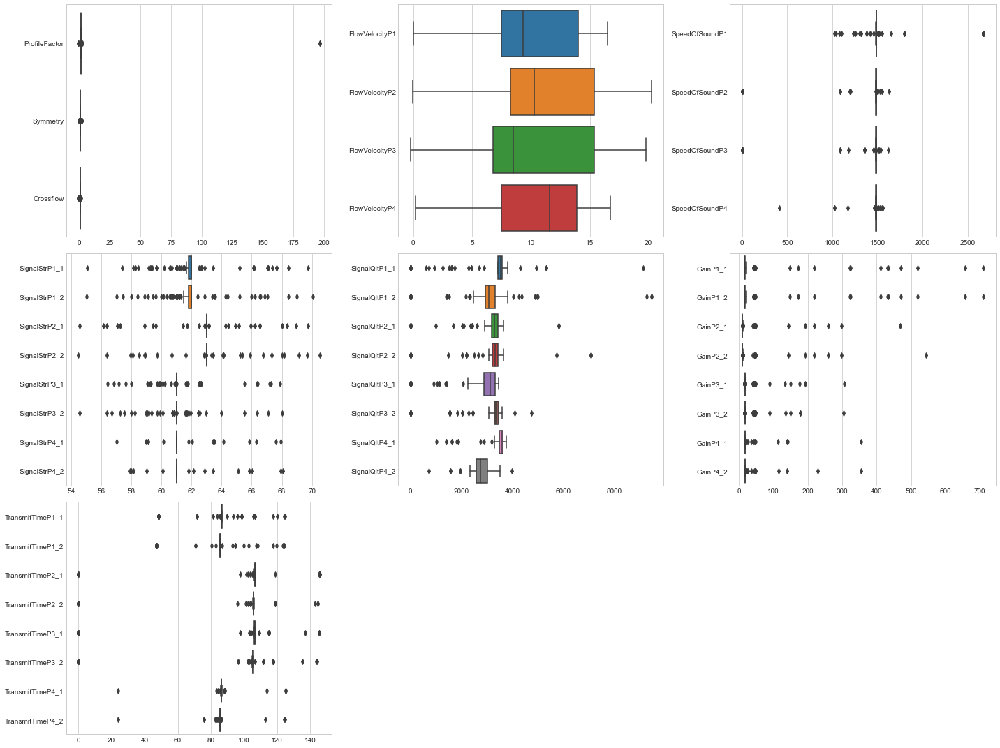

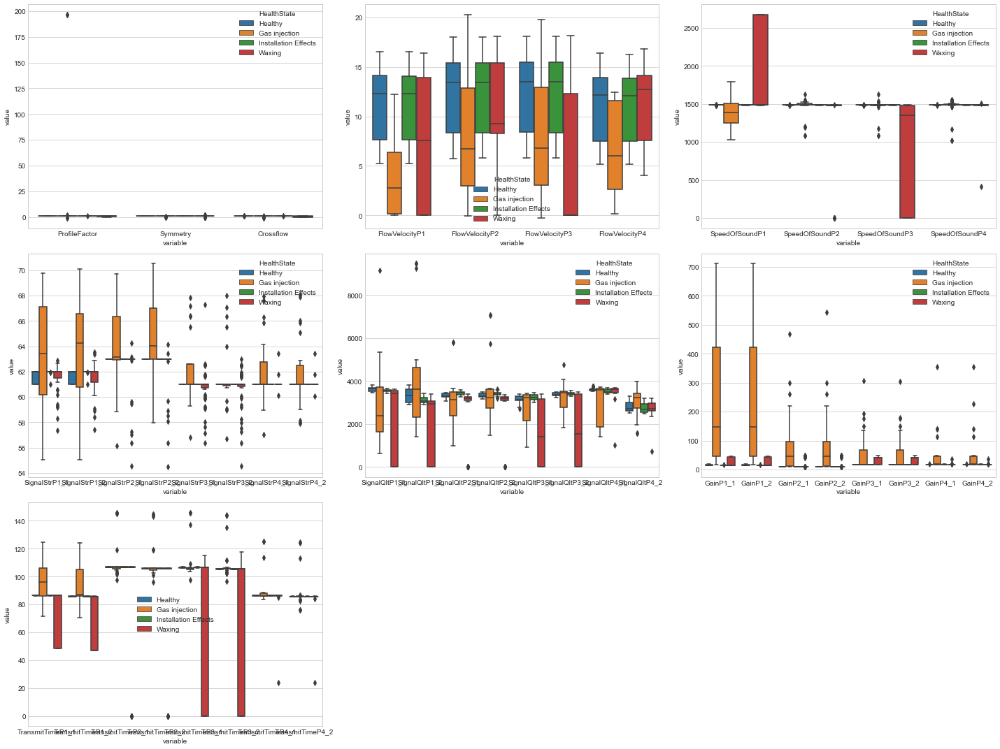

In [214]:
plotBoxplot2(attri_C, df_C)
plotBoxplot3(attri_C, df_C_map)

#### __2.C.X. Remove Outliers__

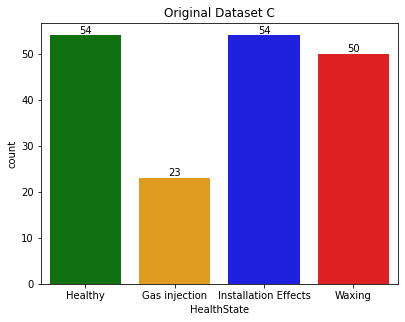

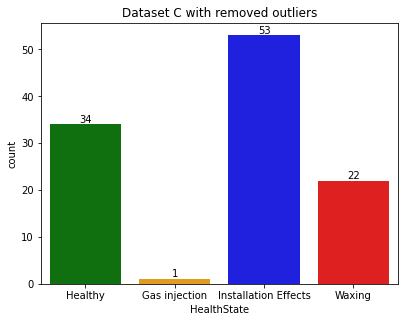

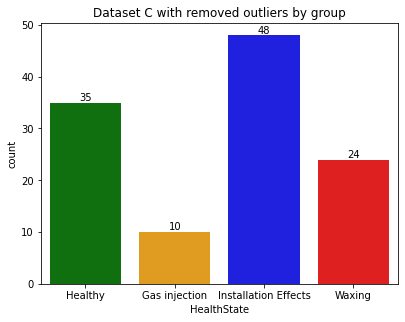

In [106]:
plotTargetCount(Y_C_map, "Original Dataset C")

df_C_clean_single = removeOutliersIQR(df_C)
plotTargetCount(df_C_clean_single['HealthState'].map(label2), "Dataset C with removed outliers")

df_C_clean = removeOutliersIQRByGroup(df_C)
plotTargetCount(df_C_clean['HealthState'].map(label2), "Dataset C with removed outliers by group")

### __2.D__

#### __2.D.1 General information__

In [14]:
df_D.head()

,ProfileFactor,Symmetry,Crossflow,FlowVelocityP1,FlowVelocityP2,FlowVelocityP3,FlowVelocityP4,SpeedOfSoundP1,SpeedOfSoundP2,SpeedOfSoundP3,...,GainP4_2,TransmitTimeP1_1,TransmitTimeP1_2,TransmitTimeP2_1,TransmitTimeP2_2,TransmitTimeP3_1,TransmitTimeP3_2,TransmitTimeP4_1,TransmitTimeP4_2,HealthState
0,1.104706,1.004679,0.994783,2.345833,2.604444,2.580000,2.347222,1485.805556,1485.930556,1485.941667,...,-0.7,124.150000,123.911944,151.615833,151.275000,151.559444,151.221111,124.253611,124.017778,1
1,1.089401,0.997778,0.998012,3.399444,3.711111,3.711944,3.414444,1486.163889,1486.302778,1486.302778,...,-0.7,124.171944,123.831667,151.652222,151.164444,151.595278,151.113333,124.274167,123.937778,1
2,1.079671,1.006056,0.999027,3.438056,3.714722,3.689722,3.420000,1486.322222,1486.452778,1486.455556,...,-0.7,124.160000,123.818056,151.636111,151.150833,151.580000,151.096944,124.260833,123.923611,1
3,1.090834,1.013194,0.994911,3.399444,3.725000,3.660556,3.371111,1486.455556,1486.575000,1486.583333,...,-0.7,124.144722,123.808611,151.622500,151.139167,151.564167,151.084167,124.250833,123.913056,1
4,1.093816,1.009716,1.003622,3.398889,3.702778,3.681389,3.351944,1486.600000,1486.725000,1486.730556,...,-0.7,124.134444,123.797500,151.607500,151.122778,151.550278,151.068889,124.236111,123.903056,1


In [15]:
df_D.describe()

,ProfileFactor,Symmetry,Crossflow,FlowVelocityP1,FlowVelocityP2,FlowVelocityP3,FlowVelocityP4,SpeedOfSoundP1,SpeedOfSoundP2,SpeedOfSoundP3,...,GainP4_2,TransmitTimeP1_1,TransmitTimeP1_2,TransmitTimeP2_1,TransmitTimeP2_2,TransmitTimeP3_1,TransmitTimeP3_2,TransmitTimeP4_1,TransmitTimeP4_2,HealthState
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,...,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,1.411731,1.166684,1.188470,4.475259,4.890867,4.910373,3.266045,1487.287238,1484.539830,1485.889306,...,12.504306,124.020073,123.821264,151.796256,151.411492,151.681565,151.092505,122.045856,120.976574,2.588889
std,0.904196,3.189220,0.675639,2.183965,2.357263,2.229163,2.944863,10.828438,10.910521,7.462522,...,20.331656,1.403897,1.036510,1.677263,1.279263,0.872729,0.895633,4.713213,6.406887,1.176060
min,-2.474166,-37.780488,-2.275649,-2.617222,-2.124444,-0.190000,-3.028611,1441.675000,1413.877778,1458.702778,...,-1.000000,111.804444,121.059167,140.902222,149.773889,147.680000,146.737778,99.679444,97.809167,1.000000
25%,1.085364,0.999759,0.992503,3.377778,3.703611,3.660764,0.373194,1483.476389,1483.579861,1483.596528,...,-0.700000,124.143889,123.719792,151.632917,151.021042,151.587639,150.962153,118.698194,118.818958,1.000000
50%,1.093996,1.005958,0.998655,4.859306,5.604306,5.609861,3.398194,1484.890278,1484.918056,1484.847222,...,-0.700000,124.374306,123.858194,151.930833,151.189444,151.880000,151.128333,124.364583,123.911667,3.000000
75%,1.207706,1.020066,1.007719,6.250347,6.815278,6.771667,6.194306,1486.661805,1486.586806,1486.588194,...,44.200000,124.487361,124.031181,152.064097,151.415278,152.012431,151.350903,124.567153,124.057361,4.000000
max,5.911308,11.191656,3.314103,8.041111,8.667222,8.622500,7.941944,1552.372222,1523.722222,1512.719444,...,45.100000,128.273056,127.807500,161.174167,160.737222,154.210833,154.225278,124.886111,124.396389,4.000000


#### __2.D.2. Target class distribution__

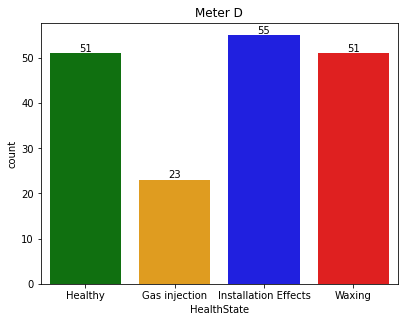

In [16]:
X_D = df_D.drop('HealthState', axis=1)
Y_D = df_D['HealthState']
Y_D_map = df_D['HealthState'].map(label2)

# dataframe with target class mapped
df_D_map = pd.concat([X_D, Y_D_map], axis=1)

plotTargetCount(Y_D_map, "Meter D")

Observation: 
The target classes are imbalanced.

#### __2.D.3. Features distribution__

#### __2.D.X. Correlation Matrix__

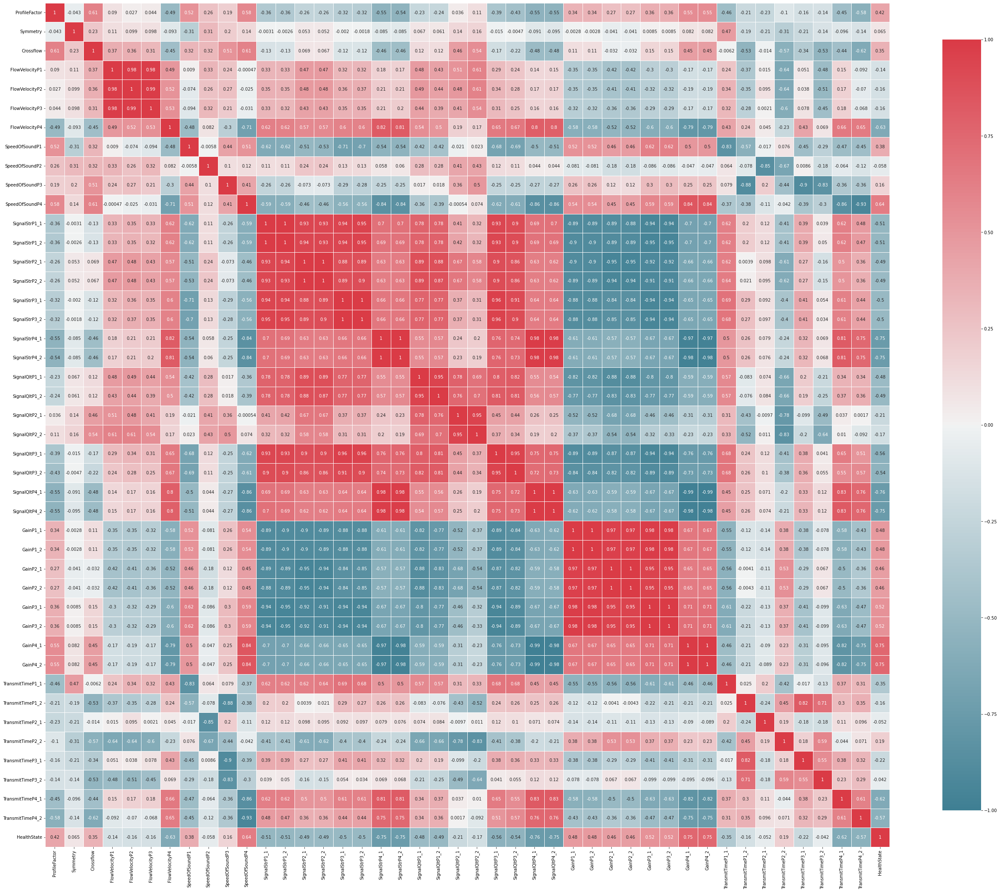

In [17]:
plotCorrMatHeatMap(df_D)

#### __2.D.X. Positive Correlated features__

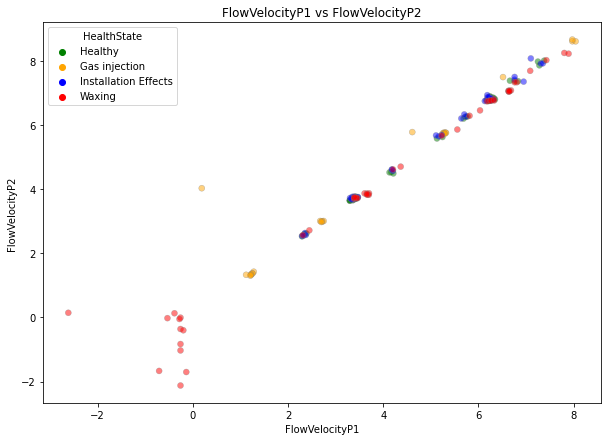

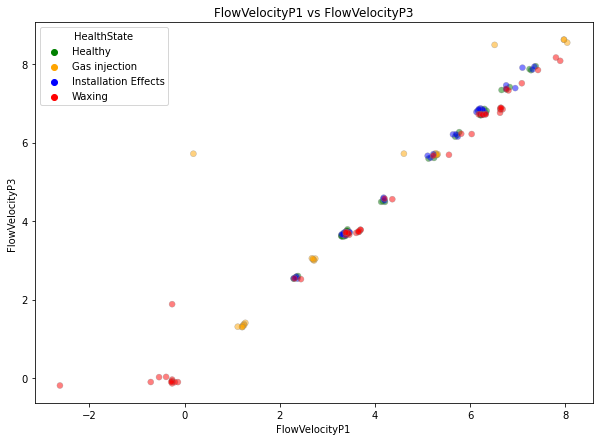

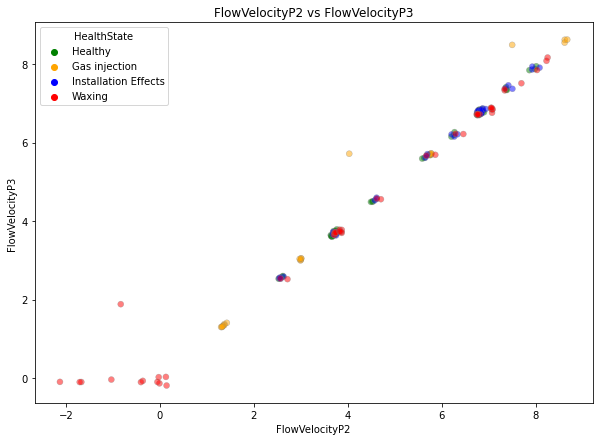

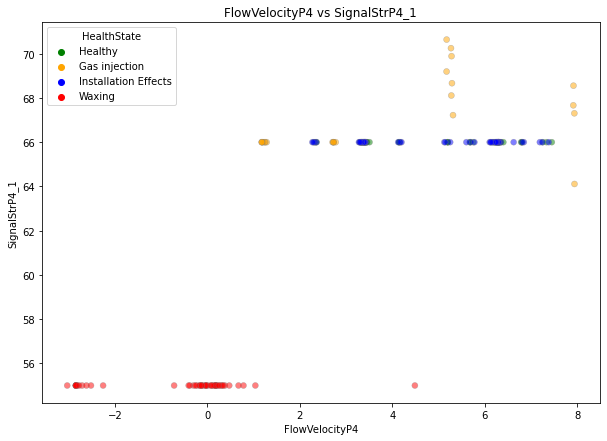

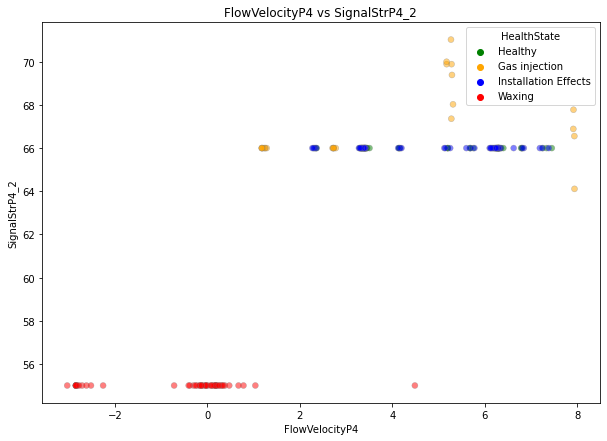

...

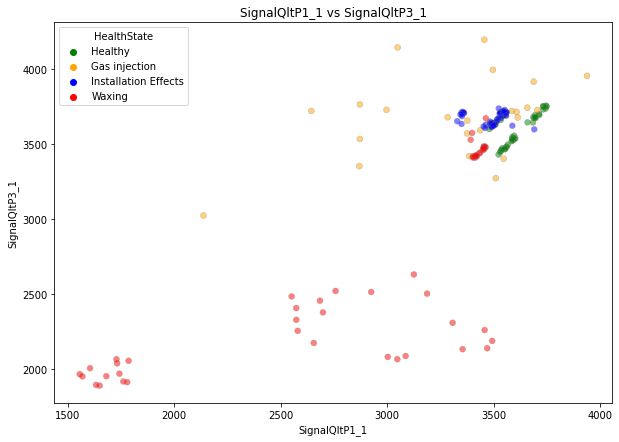

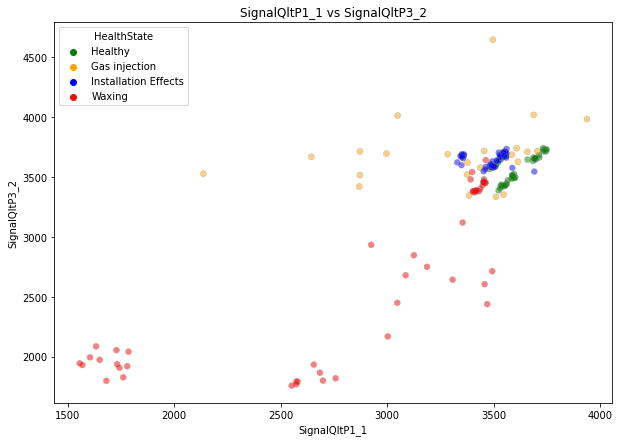

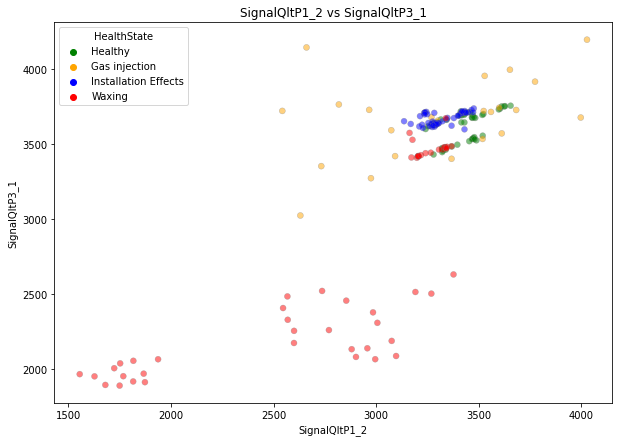

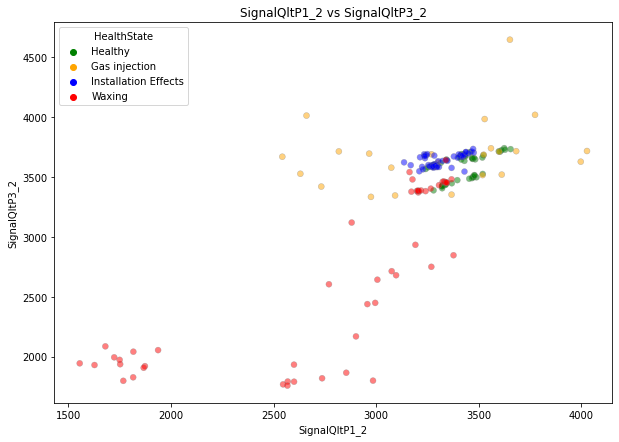

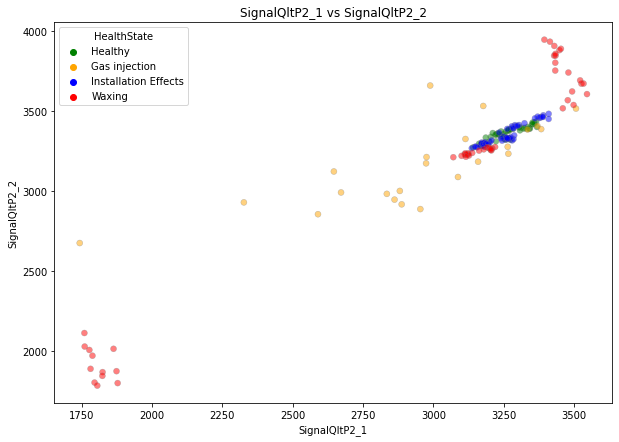

In [18]:
plotScatter('FlowVelocityP1','FlowVelocityP2', df_D)
plotScatter('FlowVelocityP1','FlowVelocityP3', df_D)

plotScatter('FlowVelocityP2','FlowVelocityP3', df_D)

plotScatter('FlowVelocityP4','SignalStrP4_1', df_D)
plotScatter('FlowVelocityP4','SignalStrP4_2', df_D)
plotScatter('FlowVelocityP4','SignalQltP4_1', df_D)
plotScatter('FlowVelocityP4','SignalQltP4_2', df_D)

plotScatter('SpeedOfSoundP4','GainP4_1', df_D) #0.84
plotScatter('SpeedOfSoundP4','GainP4_2', df_D) #0.84

plotScatter('SignalStrP1_1','SignalStrP2_2', df_D) #0.93
plotScatter('SignalStrP1_1','SignalStrP2_2', df_D) #0.93
plotScatter('SignalStrP1_1','SignalStrP3_1', df_D) #0.94
plotScatter('SignalStrP1_1','SignalStrP3_2', df_D) #0.95
plotScatter('SignalStrP1_1','SignalQltP3_1', df_D) #0.93
plotScatter('SignalStrP1_1','SignalQltP3_2', df_D) #0.9

plotScatter('SignalStrP1_2','SignalStrP2_2', df_D) #0.93
plotScatter('SignalStrP1_2','SignalStrP2_2', df_D) #0.93
plotScatter('SignalStrP1_2','SignalStrP3_1', df_D) #0.94
plotScatter('SignalStrP1_2','SignalStrP3_2', df_D) #0.95
plotScatter('SignalStrP1_2','SignalQltP3_1', df_D) #0.93
plotScatter('SignalStrP1_2','SignalQltP3_2', df_D) #0.9

plotScatter('SignalStrP2_1','SignalStrP3_1', df_D) #0.88
plotScatter('SignalStrP2_1','SignalStrP3_1', df_D) #0.89
plotScatter('SignalStrP2_1','SignalQltP1_1', df_D) #0.89
plotScatter('SignalStrP2_1','SignalQltP1_2', df_D) #0.88
plotScatter('SignalStrP2_1','SignalQltP3_1', df_D) #0.9
plotScatter('SignalStrP2_1','SignalQltP3_2', df_D) #0.86

plotScatter('SignalStrP2_2','SignalStrP3_1', df_D) #0.89
plotScatter('SignalStrP2_2','SignalStrP3_1', df_D) #0.9
plotScatter('SignalStrP2_2','SignalQltP1_1', df_D) #0.89
plotScatter('SignalStrP2_2','SignalQltP1_2', df_D) #0.87
plotScatter('SignalStrP2_2','SignalQltP3_1', df_D) #0.9
plotScatter('SignalStrP2_2','SignalQltP3_2', df_D) #0.86

plotScatter('SignalStrP3_1','SignalQltP1_1', df_D) #0.96
plotScatter('SignalStrP3_1','SignalQltP1_2', df_D) #0.91

plotScatter('SignalStrP3_2','SignalQltP1_1', df_D) #0.96
plotScatter('SignalStrP3_2','SignalQltP1_2', df_D) #0.9

plotScatter('SignalStrP4_1','FlowVelocityP4', df_D) #0.82
plotScatter('SignalStrP4_1','SignalQltP4_1', df_D) #0.98
plotScatter('SignalStrP4_1','SignalQltP4_2', df_D) #0.98
plotScatter('SignalStrP4_1','TransmitTimeP4_1', df_D) #0.81

plotScatter('SignalStrP4_2','FlowVelocityP4', df_D) #0.81
plotScatter('SignalStrP4_2','SignalQltP4_1', df_D) #0.98
plotScatter('SignalStrP4_2','SignalQltP4_2', df_D) #0.98
plotScatter('SignalStrP4_2','TransmitTimeP4_1', df_D) #0.81

plotScatter('SignalQltP1_1','SignalQltP1_2', df_D) #0.95
plotScatter('SignalQltP1_1','SignalQltP3_1', df_D) #0.8
plotScatter('SignalQltP1_1','SignalQltP3_2', df_D) #0.82

plotScatter('SignalQltP1_2','SignalQltP3_1', df_D) #0.81
plotScatter('SignalQltP1_2','SignalQltP3_2', df_D) #0.81

plotScatter('SignalQltP2_1','SignalQltP2_2', df_D) #0.95

#### __2.D.X. Negative Correlated features__

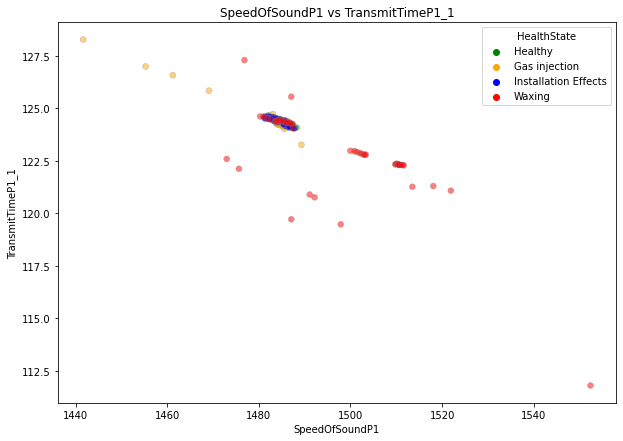

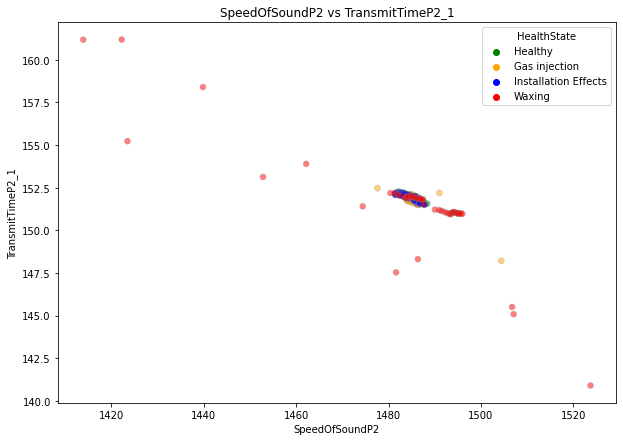

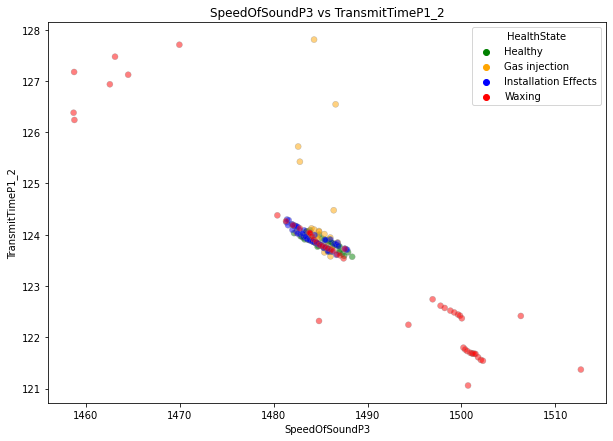

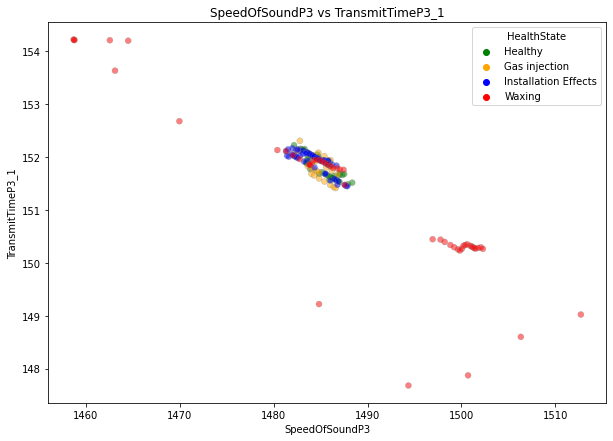

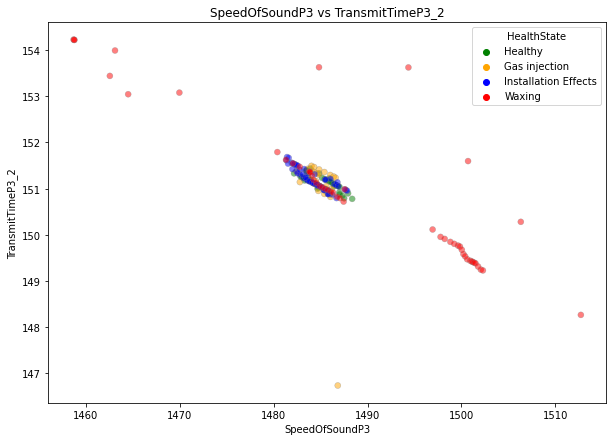

...

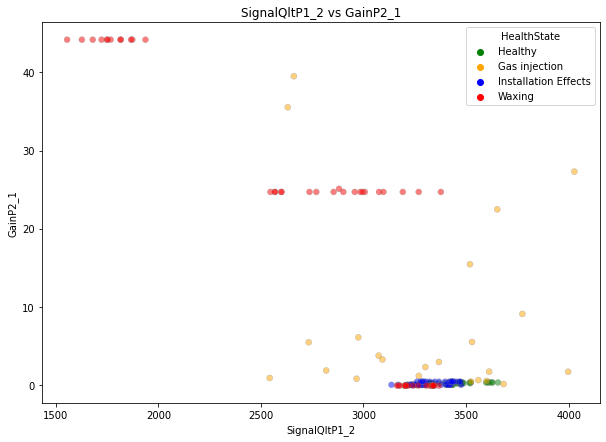

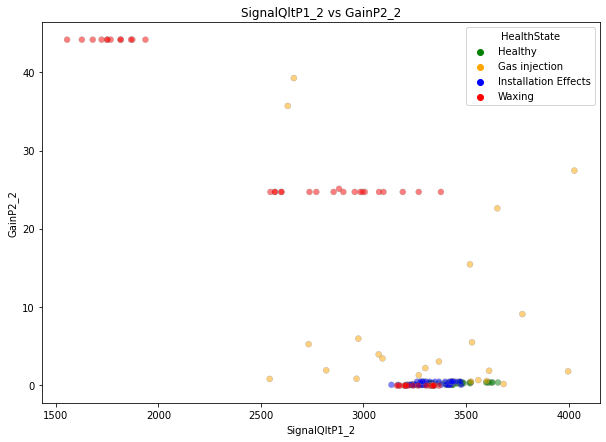

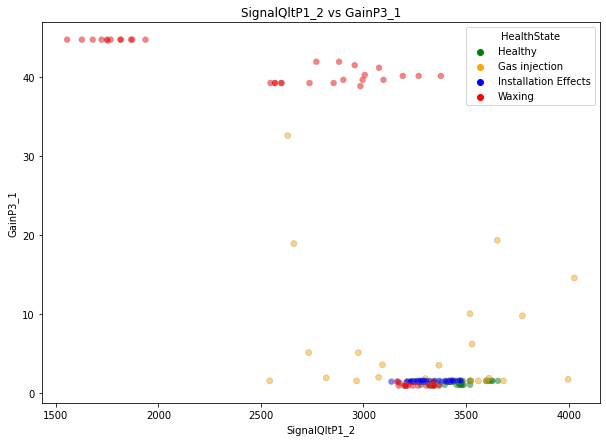

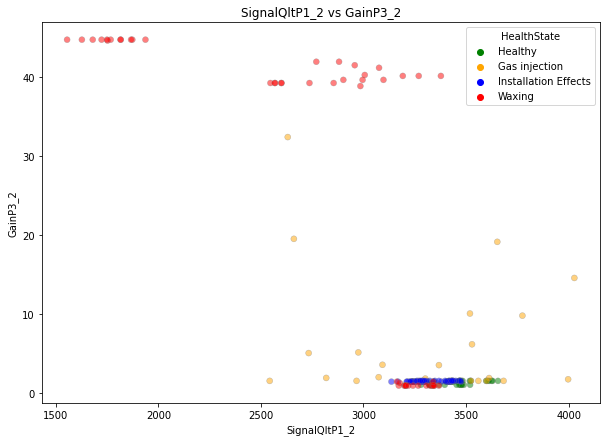

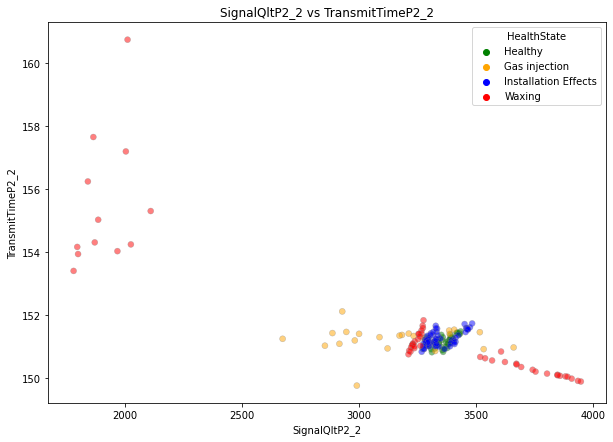

In [19]:
plotScatter('SpeedOfSoundP1','TransmitTimeP1_1', df_D)
plotScatter('SpeedOfSoundP2','TransmitTimeP2_1', df_D)
plotScatter('SpeedOfSoundP3','TransmitTimeP1_2', df_D)
plotScatter('SpeedOfSoundP3','TransmitTimeP3_1', df_D)
plotScatter('SpeedOfSoundP3','TransmitTimeP3_2', df_D)

plotScatter('SpeedOfSoundP4','SignalStrP4_1', df_D) #-0.84
plotScatter('SpeedOfSoundP4','SignalStrP4_2', df_D) #-0.84
plotScatter('SpeedOfSoundP4','SignalQltP4_1', df_D) #-0.86
plotScatter('SpeedOfSoundP4','SignalQltP4_2', df_D) #-0.86
plotScatter('SpeedOfSoundP4','TransmitTimeP4_1', df_D) #-0.86
plotScatter('SpeedOfSoundP4','TransmitTimeP4_2', df_D) #-0.93

plotScatter('SignalStrP1_1','GainP1_1', df_D) #-0.89
plotScatter('SignalStrP1_1','GainP1_2', df_D) #-0.89
plotScatter('SignalStrP1_1','GainP2_1', df_D) #-0.89
plotScatter('SignalStrP1_1','GainP2_2', df_D) #-0.88
plotScatter('SignalStrP1_1','GainP3_1', df_D) #-0.94
plotScatter('SignalStrP1_1','GainP3_2', df_D) #-0.94

plotScatter('SignalStrP1_2','GainP1_1', df_D) #-0.9
plotScatter('SignalStrP1_2','GainP1_2', df_D) #-0.9
plotScatter('SignalStrP1_2','GainP2_1', df_D) #-0.89
plotScatter('SignalStrP1_2','GainP2_2', df_D) #-0.89
plotScatter('SignalStrP1_2','GainP3_1', df_D) #-0.95
plotScatter('SignalStrP1_2','GainP3_2', df_D) #-0.95

plotScatter('SignalStrP2_1','GainP1_1', df_D) #-0.9
plotScatter('SignalStrP2_1','GainP1_2', df_D) #-0.9
plotScatter('SignalStrP2_1','GainP2_1', df_D) #-0.95
plotScatter('SignalStrP2_1','GainP2_2', df_D) #-0.95
plotScatter('SignalStrP2_1','GainP3_1', df_D) #-0.92
plotScatter('SignalStrP2_1','GainP3_2', df_D) #-0.92

plotScatter('SignalStrP2_2','GainP1_1', df_D) #-0.89
plotScatter('SignalStrP2_2','GainP1_2', df_D) #-0.89
plotScatter('SignalStrP2_2','GainP2_1', df_D) #-0.94
plotScatter('SignalStrP2_2','GainP2_2', df_D) #-0.94
plotScatter('SignalStrP2_2','GainP3_1', df_D) #-0.91
plotScatter('SignalStrP2_2','GainP3_2', df_D) #-0.91

plotScatter('SignalStrP3_1','GainP1_1', df_D) #-0.88
plotScatter('SignalStrP3_1','GainP1_2', df_D) #-0.88
plotScatter('SignalStrP3_1','GainP2_1', df_D) #-0.84
plotScatter('SignalStrP3_1','GainP2_2', df_D) #-0.84
plotScatter('SignalStrP3_1','GainP3_1', df_D) #-0.94
plotScatter('SignalStrP3_1','GainP3_2', df_D) #-0.94

plotScatter('SignalStrP3_2','GainP1_1', df_D) #-0.88
plotScatter('SignalStrP3_2','GainP1_2', df_D) #-0.88
plotScatter('SignalStrP3_2','GainP2_1', df_D) #-0.85
plotScatter('SignalStrP3_2','GainP2_2', df_D) #-0.85
plotScatter('SignalStrP3_2','GainP3_1', df_D) #-0.94
plotScatter('SignalStrP3_2','GainP3_2', df_D) #-0.94

plotScatter('SignalStrP4_1','SpeedOfSoundP4', df_D) #-0.84
plotScatter('SignalStrP4_1','GainP4_1', df_D) #-0.97
plotScatter('SignalStrP4_1','GainP4_2', df_D) #-0.97

plotScatter('SignalStrP4_2','SpeedOfSoundP4', df_D) #-0.84
plotScatter('SignalStrP4_2','GainP4_1', df_D) #-0.98
plotScatter('SignalStrP4_2','GainP4_2', df_D) #-0.98

plotScatter('SignalQltP1_1','GainP1_1', df_D) #-0.82
plotScatter('SignalQltP1_1','GainP1_2', df_D) #-0.82
plotScatter('SignalQltP1_1','GainP2_1', df_D) #-0.88
plotScatter('SignalQltP1_1','GainP2_2', df_D) #-0.88
plotScatter('SignalQltP1_1','GainP3_1', df_D) #-0.8
plotScatter('SignalQltP1_1','GainP3_2', df_D) #-0.8

plotScatter('SignalQltP1_2','GainP1_1', df_D) #-0.77
plotScatter('SignalQltP1_2','GainP1_2', df_D) #-0.77
plotScatter('SignalQltP1_2','GainP2_1', df_D) #-0.83
plotScatter('SignalQltP1_2','GainP2_2', df_D) #-0.83
plotScatter('SignalQltP1_2','GainP3_1', df_D) #-0.77
plotScatter('SignalQltP1_2','GainP3_2', df_D) #-0.77

plotScatter('SignalQltP2_2','TransmitTimeP2_2', df_D) #-0.83

#### __2.D.X. Detecting Outliers__

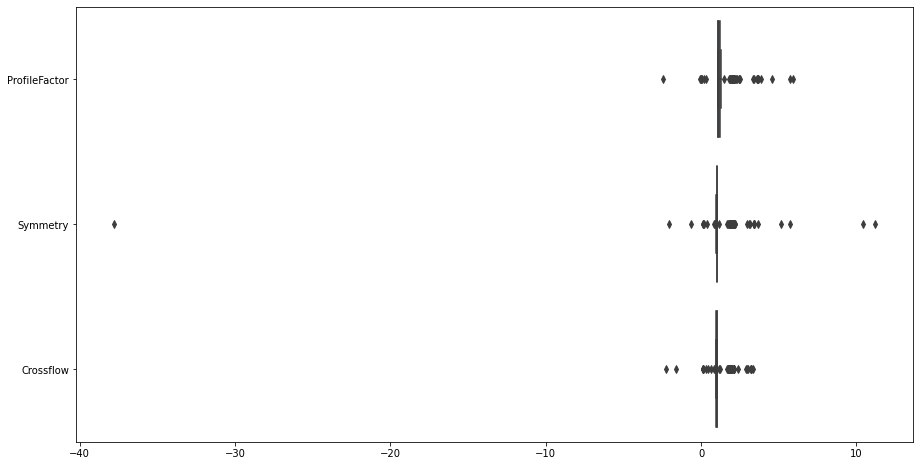

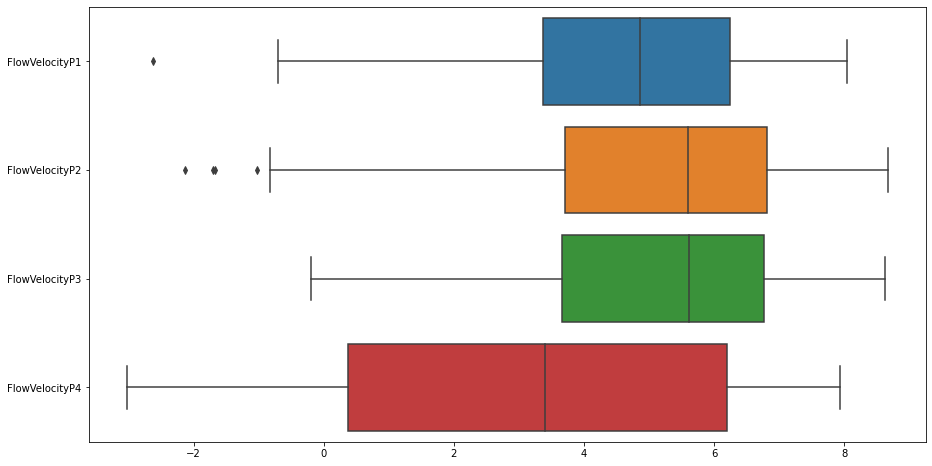

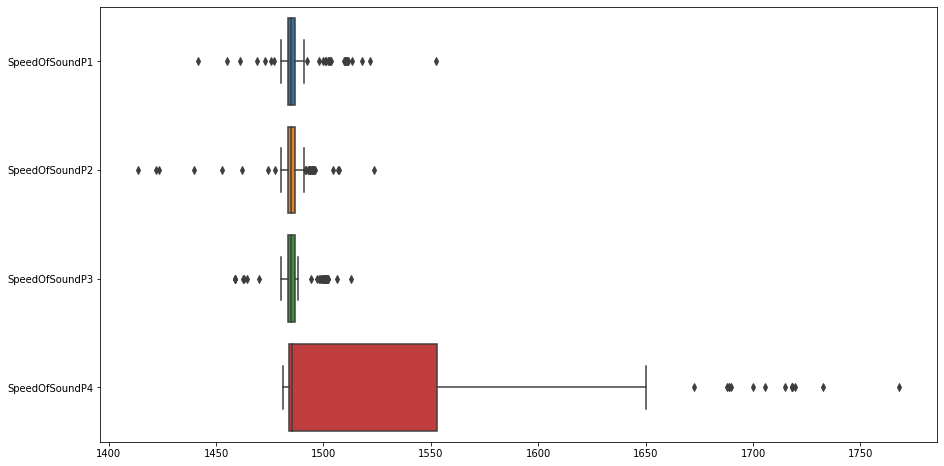

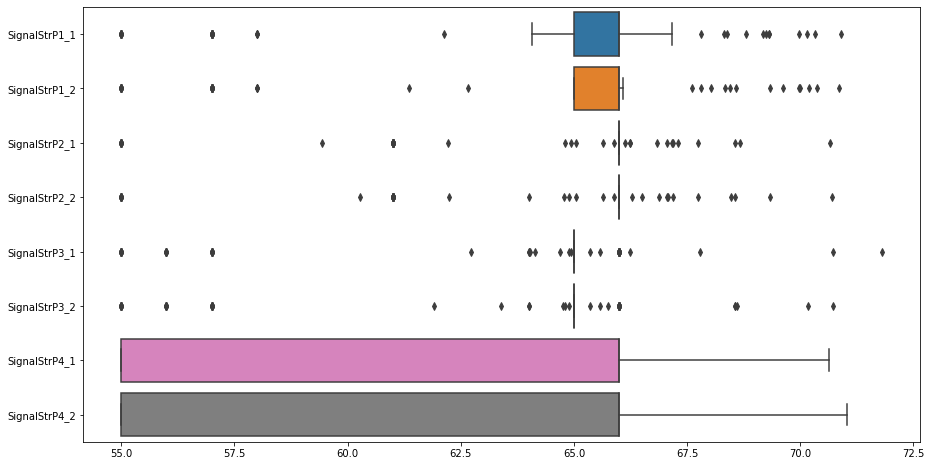

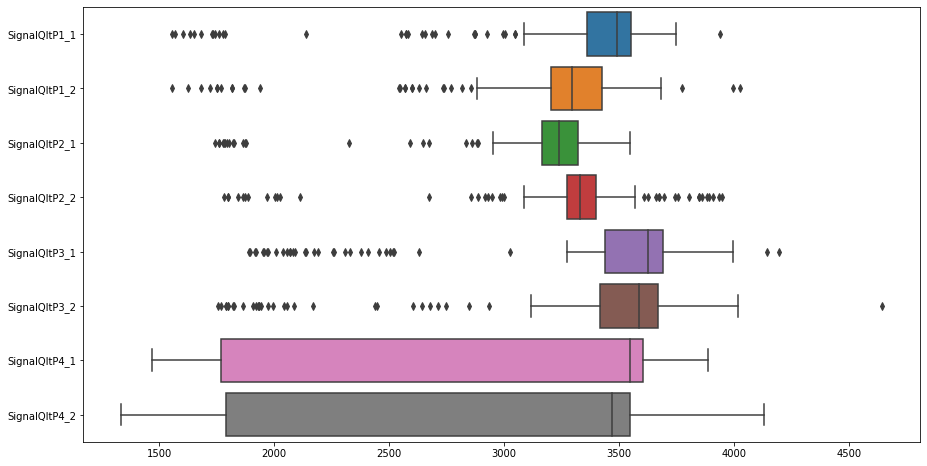

...

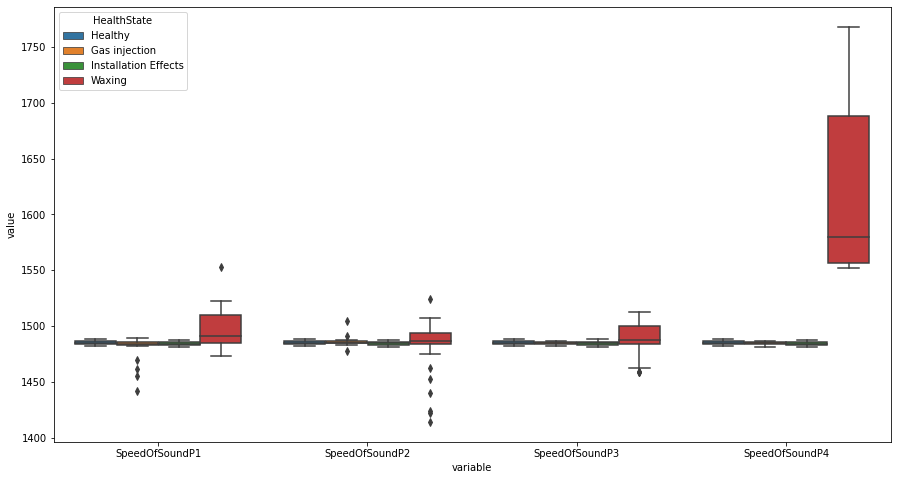

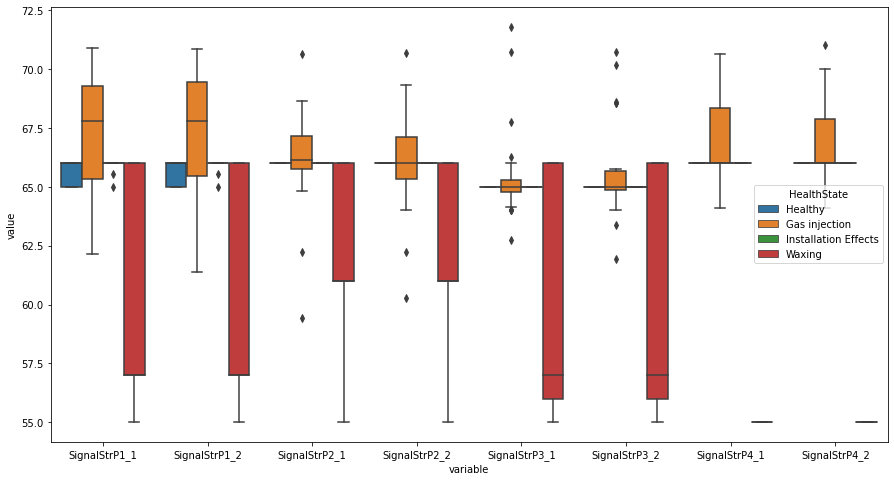

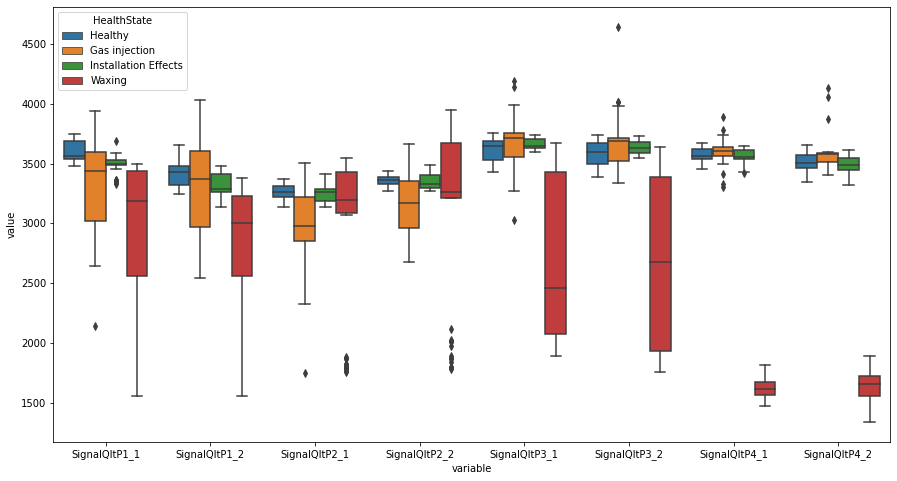

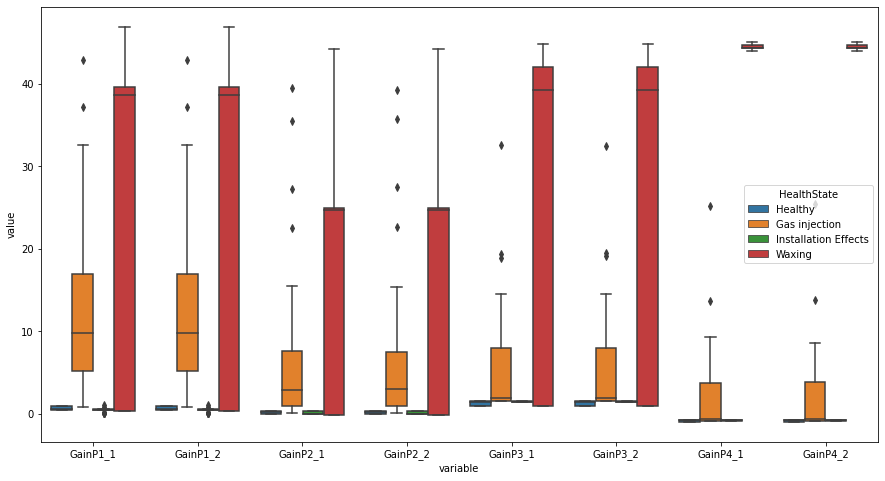

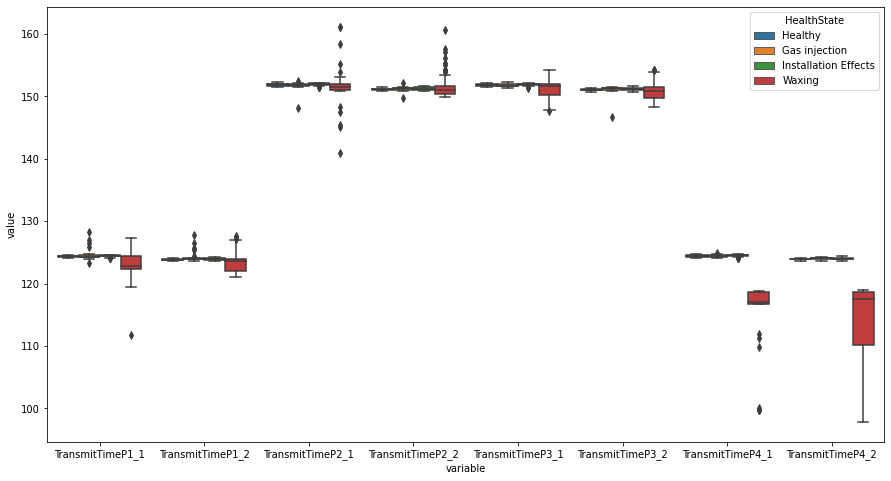

In [99]:
# group by columns
firstCol = df_D.columns[0:3].to_list()
flowVelocity = df_D.columns[3:7].to_list()
speedOfSound = df_D.columns[7:11].to_list()
signalStr = df_D.columns[11:19].to_list()
signalQlt = df_D.columns[19:27].to_list()
gain = df_D.columns[27:35].to_list()
transmitTime = df_D.columns[35:43].to_list()

# list of all attributes in groups
attri_D = []
attri_D.extend([firstCol, flowVelocity, speedOfSound, signalStr, signalQlt, gain, transmitTime])

plotBoxplot(attri_D, df_D_map)
# # grouped dataframe
# df_D_map_grp = []
# for col in attri_D:
#     # df_D_map_grp.append(df_D_map[col])
#     df_D_map_grp.append(pd.concat([df_D[col], Y_map], axis=1))

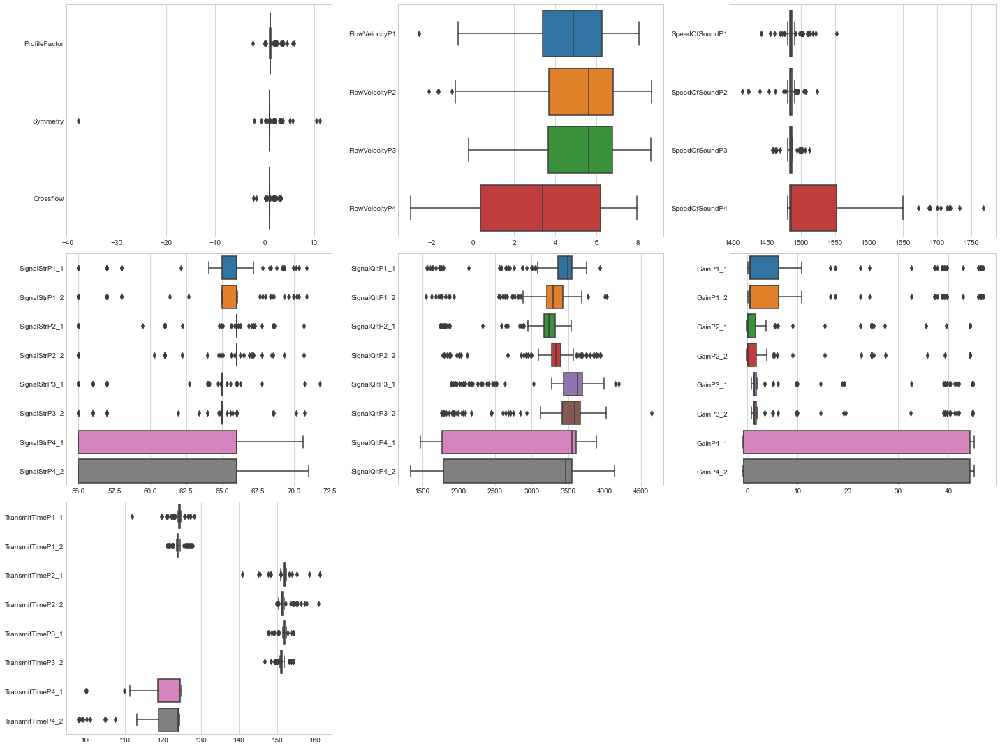

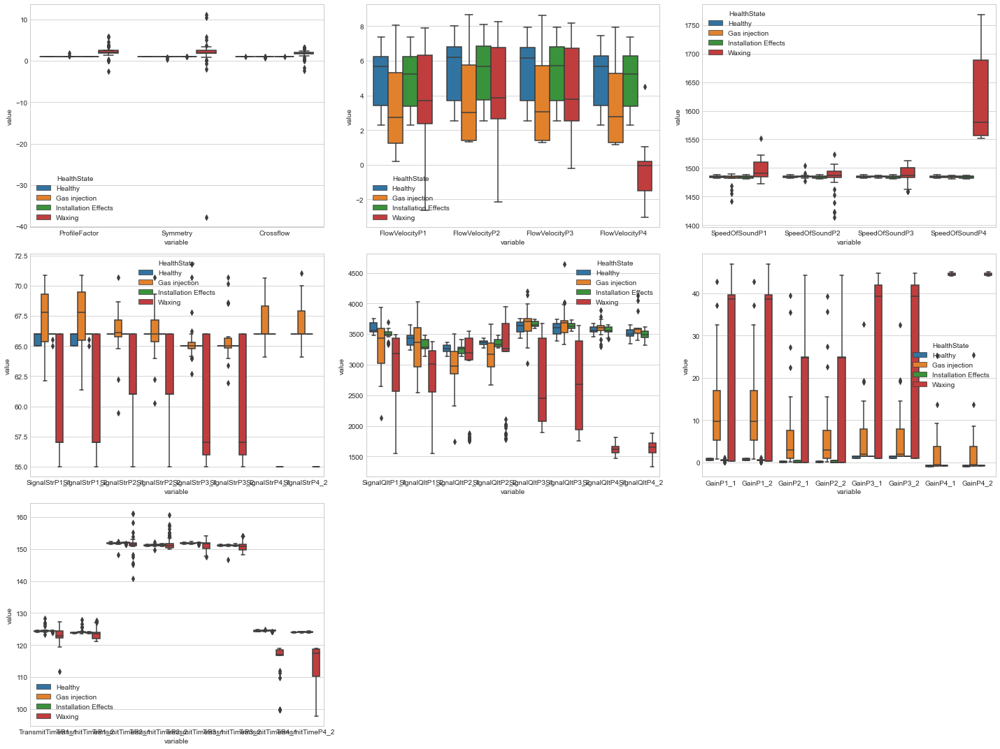

In [215]:
plotBoxplot2(attri_D, df_D)
plotBoxplot3(attri_D, df_D_map)

#### __2.D.X. Removing Outliers__

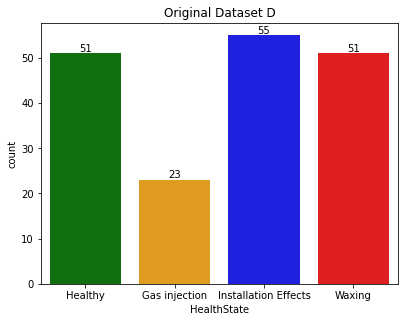

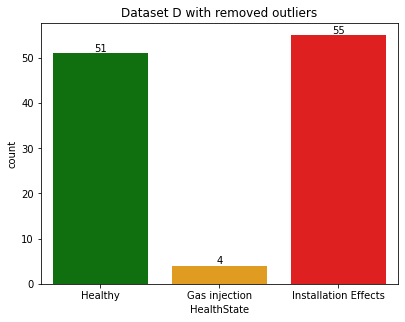

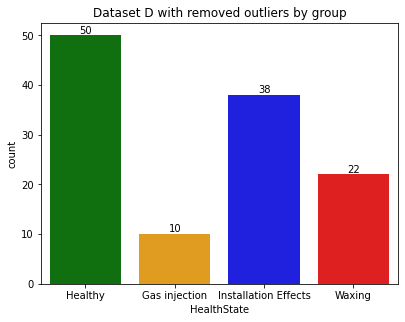

In [102]:
plotTargetCount(Y_D_map, "Original Dataset D")

df_D_clean_single = removeOutliersIQR(df_D)
plotTargetCount(df_D_clean_single['HealthState'].map(label2), "Dataset D with removed outliers")

df_D_clean = removeOutliersIQRByGroup(df_D)
plotTargetCount(df_D_clean['HealthState'].map(label2), "Dataset D with removed outliers by group")

# df_D_clean_X = df_D_clean.drop('HealthState', axis=1)
# df_D_clean_Y = df_D_clean['HealthState']
# df_D_clean_Y_map = df_D_clean['HealthState'].map(label2)

Observation:
Notice that if we were to remove by IQR for entire dataset, it will remove entire Waxing target class

TODO: probably plot boxplot again?

## __3. Principal Component Analysis (PCA)__

In [26]:
def plotPCA(df_X, label="Plot of eigen variance energy captured by Principle component"):
    # do feature scaling
    sc = StandardScaler()
    X_scaled = sc.fit_transform(df_X)

    # do PCA
    pca_all = PCA()
    pca_all.fit(X_scaled)

    var_exp = pca_all.explained_variance_ratio_
    cum_var_exp = np.cumsum(var_exp)
    print("var_exp: ", var_exp)
    print("cum_var_exp(%): ", cum_var_exp*100)
    
    # 6, 4 is default size plt.rcParams.get('figure.figsize')
    plt.figure(figsize=(12.0, 4.0))
    plt.subplot(1, 2, 1)
    plt.bar(range(1,pca_all.n_components_+1), var_exp, alpha=0.5, align='center', label='individual explained variance')
    plt.step(range(1,pca_all.n_components_+1), cum_var_exp, where='mid', label='cumulative explained variance', color='red')
    plt.xlabel('Principal component index')
    plt.ylabel('Explained variance ratio') #eigen_variance_energy_ratio
    plt.suptitle(label)
    # plt.title("Plot of eigen variance energy captured by Principle component")
    plt.legend(loc='best')

    plt.subplot(1, 2, 2)
    plt.plot(np.cumsum(pca_all.explained_variance_ratio_), color='red')
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    # plt.title("number of components")

    plt.show()

def scale_pca(df_X, n_components=2):
    # pipeline = Pipeline([('scalar', StandardScaler()),
    #                     ('pca', PCA(n_components=n_components))])
    sc = StandardScaler()
    X_scale = sc.fit_transform(df_X)
    # X_scaled = pd.DataFrame(X_scaled, columns=df_X.columns)
    # apply PCA
    pca = PCA(n_components=n_components)
    X_scale_pca = pca.fit_transform(X_scale)

    X_scale_pca = pd.DataFrame(X_scale_pca , columns=[f"PC{i}" for i in range(1,n_components+1)])

    # X_scale_pca = pd.DataFrame(pipeline.fit_transform(df_X), columns=[f"PC{i}" for i in range(1,n_components+1)])    
    return X_scale_pca, pca

def plotPCA2(df_X_pca_2, df_Y, value=""):
    df_X_pca_2_num = df_X_pca_2.to_numpy()
    palette = []

    plt.figure(figsize=(10,7))
    if df_Y.nunique() == 3:
        palette = ['green', 'orange', 'red']
    else:
        palette = ['green', 'orange', 'blue', 'red']
    sns.scatterplot(x=df_X_pca_2_num[:,0], y=df_X_pca_2_num[:,1], s=70, hue=df_Y, palette=palette)
    # sns.scatterplot(x=df_X_pca_2_num[:,0], y=df_X_pca_2_num[:,1], s=70, hue=df_Y, palette=['blue', 'orange', 'green', 'red'])
    plt.title(f"Projection of Data in Eigenspace: {value}% of variability captured")
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.legend(loc="best")
    plt.show()

def plotPCA3(df_X_pca_3, df_Y, value=0):
    df_X_pca_3_num = df_X_pca_3.to_numpy()

    fig = plt.figure(figsize = (12,8))
    ax = plt.axes(projection='3d')

    sctt = ax.scatter3D(df_X_pca_3_num[:,0], df_X_pca_3_num[:,1], df_X_pca_3_num[:,2],
                    c=df_Y, s=50, alpha=0.6)
    
    plt.title(f"3D Scatterplot: {value}% of variability captured", pad=15)
    plt.legend(*sctt.legend_elements(), loc="best")

    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")

    plt.show()

def plotPCA3I(df_X_pca_3, df_Y, label):
    fig = px.scatter_3d(df_X_pca_3, x='PC1', y='PC2', z='PC3', color=df_Y, title=label)
    fig.update_layout(legend_title_text='Health State')
    fig.update_traces(marker_coloraxis=None, marker_size=4)
    fig.show()

# dataframeX , pca, which PC
def plotFeatureImportance(df_X, pca, pc):
    if pc == 0: return
    arr = []
    topValue = 5
    loading = pd.DataFrame(pca.components_.T, columns=[f"PC{i}" for i in range(1,len(pca.components_)+1)], index = df_X.columns)
    sorted = abs(loading[f"PC{pc}"]).sort_values(ascending=False)

    # # plt.rcdefaults()
    params = {'figure.figsize' : (10, 10)}
    plt.rcParams.update(params)
    # plt.figure(figsize=(18,18))
    fig, ax = plt.subplots()

    feature = sorted.index.tolist()
    y_pos = np.arange(0, len(feature))
    importance = sorted.values.tolist()

    arr.append(feature[:topValue])

    bars = ax.barh(y_pos, importance, align='center')

    for bar in bars:
        width = bar.get_width()
        label_y = bar.get_y() + bar.get_height() * 0.5
        plt.text(width, label_y, s=f'{round(width, 4)}',fontsize=6)

    ax.set_yticks(y_pos, labels=feature, fontsize=6)
    ax.invert_yaxis()  # labels read top-to-bottom
    ax.set_xlabel('Weightage')
    ax.set_title(f'Feature importance by rank for PC{pc}')

    plt.show()

    print(f"Top 5 important feature for PC{pc}: ", arr)

### __3.B__

#### __3.B.1. Visualization of Explained Variance and Principal Component__

var_exp:  [4.34044765e-01 2.28978831e-01 1.25180561e-01 6.94987219e-02
 4.64424869e-02 3.40759147e-02 1.49210250e-02 1.14713921e-02
 8.97172336e-03 7.13959793e-03 6.22813344e-03 3.93989405e-03
 2.41186163e-03 1.32240621e-03 1.12757135e-03 9.37753989e-04
 8.23897675e-04 6.27049347e-04 5.44080025e-04 3.65262189e-04
 2.67341101e-04 2.00779564e-04 1.57076049e-04 9.37231606e-05
 8.23790408e-05 6.24178400e-05 3.03615187e-05 1.60459116e-05
 1.44740948e-05 6.17542621e-06 4.97457894e-06 3.04915367e-06
 2.86776435e-06 1.92012528e-06 1.17061444e-06 9.49885649e-07
 7.68705072e-07 3.00099069e-07 1.26169558e-07 7.77636563e-08
 5.92896374e-08 2.22177586e-08 1.03032611e-08 1.13804875e-10
 5.85266530e-12 2.90859998e-12 1.97033568e-12 3.10920393e-33
 3.10920393e-33 3.10920393e-33 3.10920393e-33]
cum_var_exp(%):  [ 43.4044765   66.30235964  78.82041577  85.77028796  90.41453665
  93.82212812  95.31423062  96.46136983  97.35854217  98.07250196
  98.6953153   99.08930471  99.33049087  99.46273149  99.57548

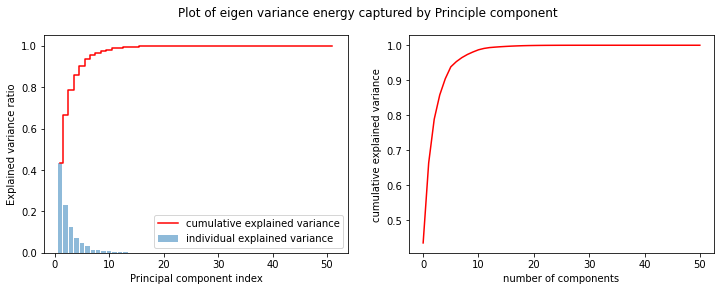

In [27]:
plotPCA(X_B)

#### __3.B.2. Compute and apply PCA with Principal Component=2__

In [28]:
X_B_pca_2, _ = scale_pca(X_B, 2)
X_B_pca_2

,PC1,PC2
0,-3.628615,0.617432
1,-3.637322,0.613647
2,-3.663585,0.590763
3,-3.660748,0.610328
4,-3.651005,0.593530
...,...,...
87,8.630955,-4.365540
88,8.793551,-4.300473
89,8.549573,-4.439776
90,8.503637,-4.449000


#### __3.B.3. Visualizing Data in 2 Dimension Scatter Plot__

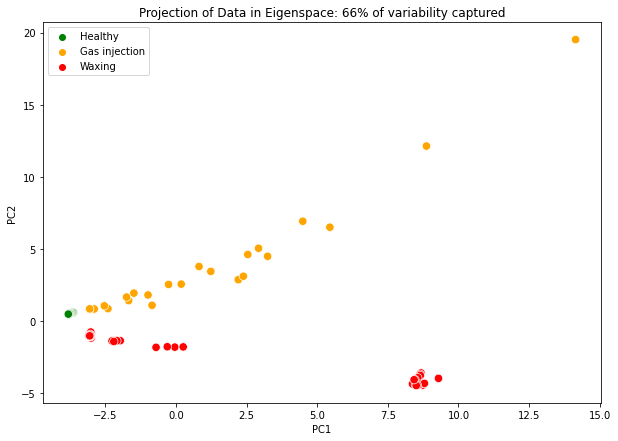

In [29]:
plotPCA2(X_B_pca_2, Y_B_map, "66")

#### __3.B.4. Compute and apply PCA with Principal Component=3__

In [30]:
X_B_pca_3, _ = scale_pca(X_B, 3)
X_B_pca_3

,PC1,PC2,PC3
0,-3.628615,0.617432,2.195728
1,-3.637322,0.613647,2.185342
2,-3.663585,0.590763,1.328614
3,-3.660748,0.610328,1.302664
4,-3.651005,0.593530,1.334930
...,...,...,...
87,8.630955,-4.365540,-0.516545
88,8.793551,-4.300473,-0.529485
89,8.549573,-4.439776,-0.491605
90,8.503637,-4.449000,-0.443529


#### __3.B.5. Visualizing Data in 3 Dimension Scatter Plot__

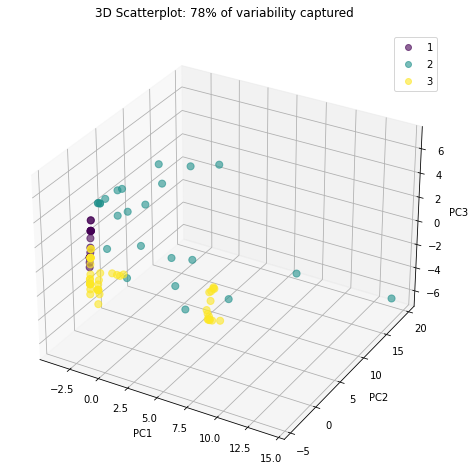

In [31]:
plotPCA3(X_B_pca_3, Y_B, "78")

In [32]:
plotPCA3I(X_B_pca_3, Y_B_map, "Meter B")

#### __3.B.6 Feature Importance__

In [33]:
# sc = StandardScaler()

# #  fit on training set only and apply transformation to both the training set and the test set
# x_b_scale = pd.DataFrame(sc.fit_transform(X_B), columns = X_B.columns) # 92 x 51
# # # apply PCA
# pca_2 = PCA(n_components=2)
# x_b_pca = pca_2.fit_transform(x_b_scale)
# x_b_pca = pd.DataFrame(x_b_pca , columns=[f"PC{i}" for i in range(1,2+1)]) # 92 x 2
# # #pca_2.components_.shape
# # pca_2.components_.shape
# xx = pd.DataFrame(pca_2.components_,columns=x_b_scale.columns,index = ['PC1','PC2'])
# xx.columns
# v = abs(xx.iloc[0,:]).sort_values(ascending=False)

# loading = pd.DataFrame(pca_2.components_.T, columns=["PC1", "PC2"], index = X_B.columns)
# abs(loading["PC1"]).sort_values(ascending=False)

# test = pd.DataFrame(v, columns=[f"{v.index[i]}" for i in range(0,len(v))])
# # value.index[0] # print Meterperformance
# sns.set_style("darkgrid")
# plt.bar(v.index,v.values)
# plt.show()

# sns.barplot(data=test, orient='h')
# plt.show()
# sns.barplot([i for i in range (len(value))], value)

#####################
# # plt.rcdefaults()
# params = {'figure.figsize' : (10, 10)}
# plt.rcParams.update(params)
# # plt.figure(figsize=(18,18))
# fig, ax = plt.subplots()

# feature = v.index.tolist()
# y_pos = np.arange(0, len(feature))
# importance = v.values.tolist()

# bars = ax.barh(y_pos, importance, align='center')

# for bar in bars:
#     width = bar.get_width()
#     label_y = bar.get_y() + bar.get_height() * 0.5
#     plt.text(width, label_y, s=f'{round(width, 4)}',fontsize=6)

# ax.set_yticks(y_pos, labels=feature, fontsize=6)
# ax.invert_yaxis()  # labels read top-to-bottom
# ax.set_xlabel('')
# ax.set_title('Feature importance by rank')

# plt.show()


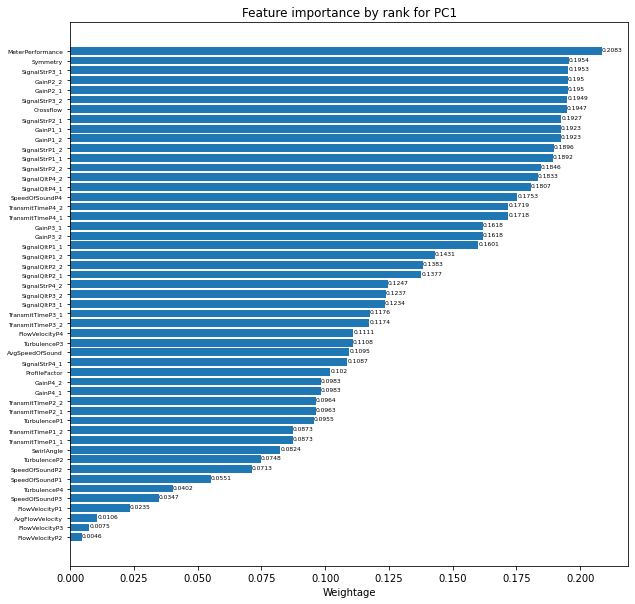

Top 5 important feature for PC1:  [['MeterPerformance', 'Symmetry', 'SignalStrP3_1', 'GainP2_2', 'GainP2_1']]


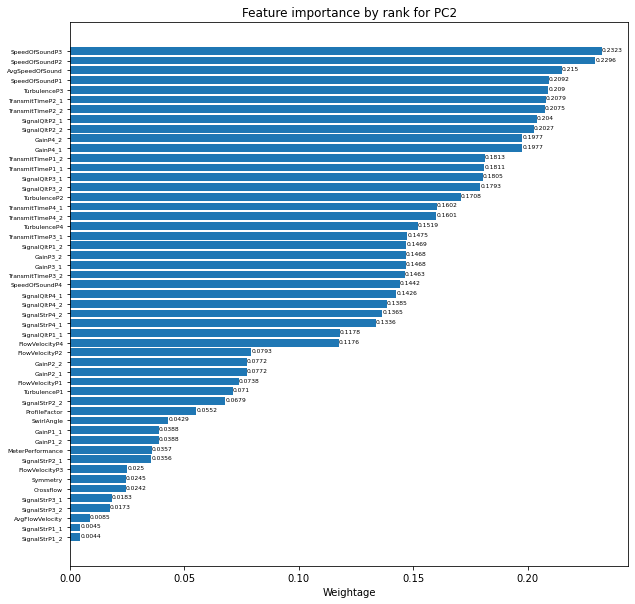

Top 5 important feature for PC2:  [['SpeedOfSoundP3', 'SpeedOfSoundP2', 'AvgSpeedOfSound', 'SpeedOfSoundP1', 'TurbulenceP3']]


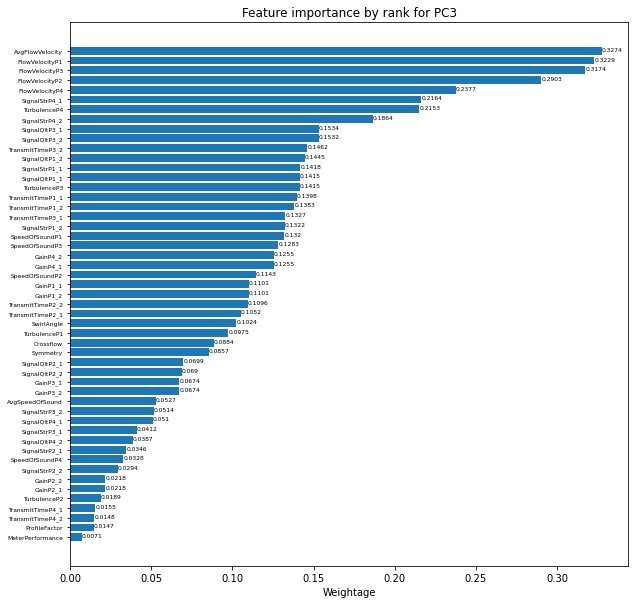

Top 5 important feature for PC3:  [['AvgFlowVelocity', 'FlowVelocityP1', 'FlowVelocityP3', 'FlowVelocityP2', 'FlowVelocityP4']]


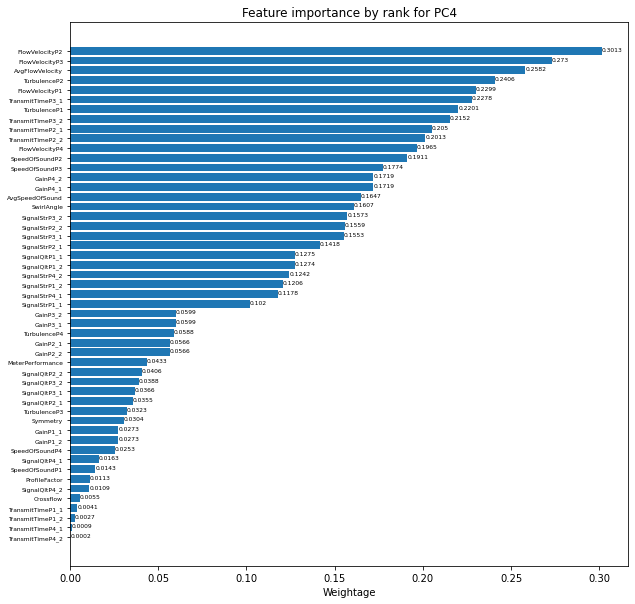

Top 5 important feature for PC4:  [['FlowVelocityP2', 'FlowVelocityP3', 'AvgFlowVelocity', 'TurbulenceP2', 'FlowVelocityP1']]


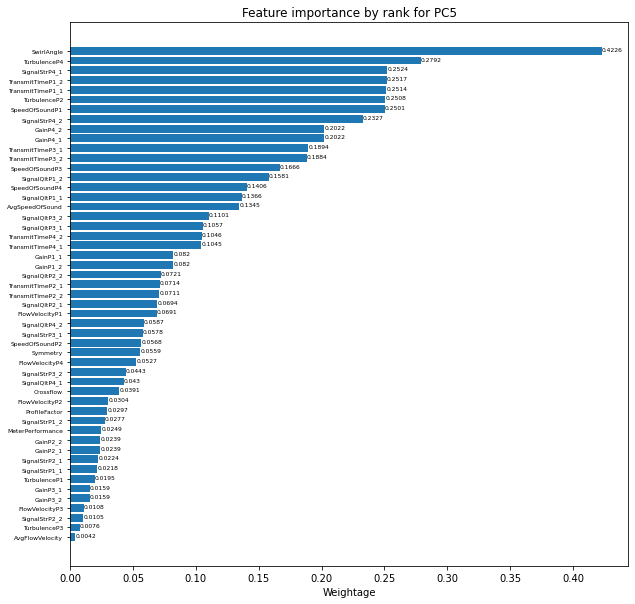

Top 5 important feature for PC5:  [['SwirlAngle', 'TurbulenceP4', 'SignalStrP4_1', 'TransmitTimeP1_2', 'TransmitTimeP1_1']]


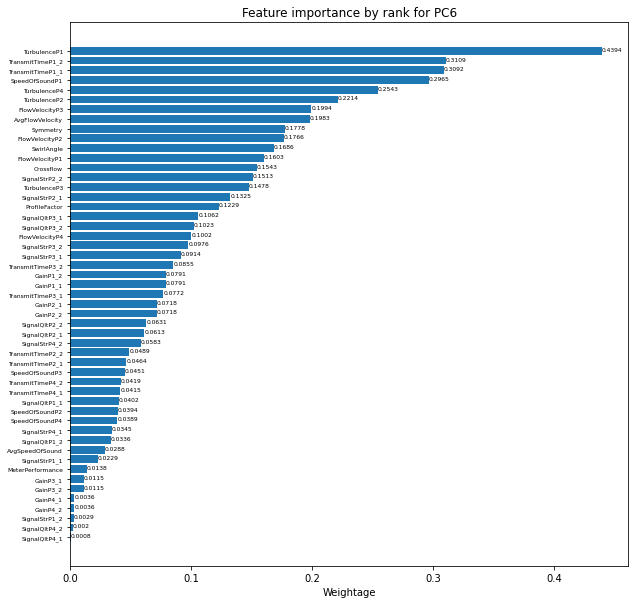

Top 5 important feature for PC6:  [['TurbulenceP1', 'TransmitTimeP1_2', 'TransmitTimeP1_1', 'SpeedOfSoundP1', 'TurbulenceP4']]


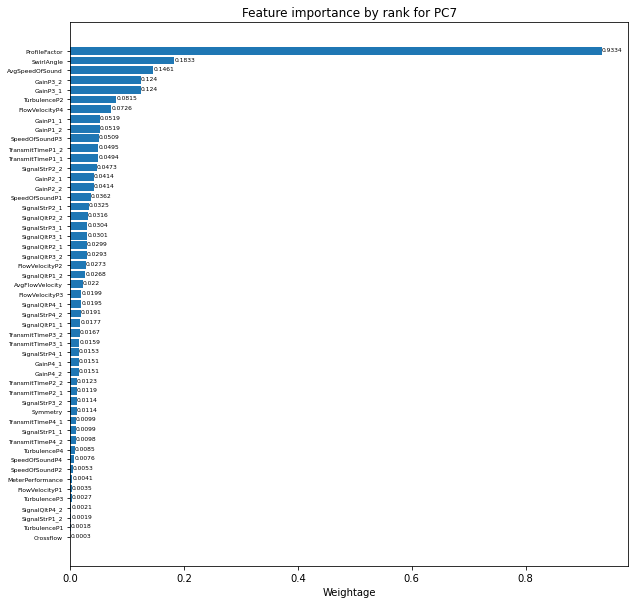

Top 5 important feature for PC7:  [['ProfileFactor', 'SwirlAngle', 'AvgSpeedOfSound', 'GainP3_2', 'GainP3_1']]


In [34]:
X_B_pca_7, B_pca_7 = scale_pca(X_B, 7)
for i in range(1,8):
    plotFeatureImportance(X_B, B_pca_7, i)

### __3.C__

#### __3.C.1. Visualization of Explained Variance and Principal Component__

var_exp:  [2.69100322e-01 1.84187757e-01 1.22455609e-01 9.25703375e-02
 7.39771507e-02 5.19124386e-02 4.73115773e-02 3.38881146e-02
 2.63733921e-02 2.03122046e-02 1.90589408e-02 1.55119702e-02
 1.09462388e-02 8.19816388e-03 7.66616843e-03 5.59364074e-03
 3.18061581e-03 1.99514392e-03 1.58453327e-03 1.11069279e-03
 8.14455120e-04 6.52525146e-04 4.51134346e-04 3.35202210e-04
 2.40215700e-04 1.81629209e-04 1.07961061e-04 8.66862041e-05
 6.31981676e-05 4.14554983e-05 3.31565633e-05 2.06747202e-05
 1.53396700e-05 9.76083751e-06 8.46605064e-06 1.19461087e-06
 8.80418886e-07 6.32563105e-07 3.35537196e-07 8.11073924e-08
 2.03492080e-09 1.64291075e-10 1.12478570e-33]
cum_var_exp(%):  [ 26.91003224  45.32880798  57.5743689   66.83140266  74.22911772
  79.42036158  84.15151931  87.54033078  90.17766999  92.20889045
  94.11478453  95.66598154  96.76060542  97.58042181  98.34703865
  98.90640273  99.22446431  99.4239787   99.58243203  99.69350131
  99.77494682  99.84019933  99.88531277  99.91883299

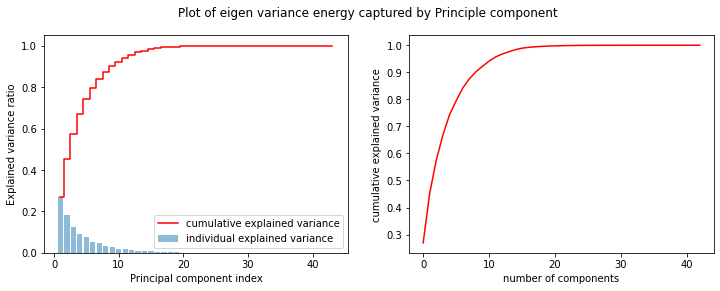

In [35]:
plotPCA(X_C)

#### __3.C.2. Compute and apply PCA with Principal Component=2__

In [36]:
X_C_pca_2, _ = scale_pca(X_C, 2)

#### __3.C.3. Visualizing Data in 2 Dimension Scatter Plot__

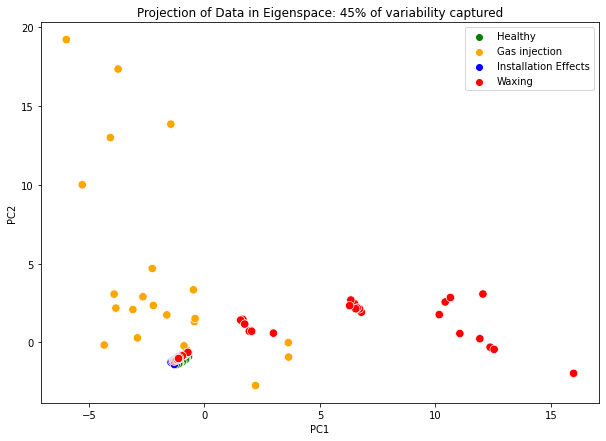

In [37]:
plotPCA2(X_C_pca_2, Y_C_map, "45")

#### __3.C.4. Compute and apply PCA with Principal Component=3__

In [38]:
X_C_pca_3, _ = scale_pca(X_C, 3)

#### __3.C.5. Visualizing Data in 3 Dimension Scatter Plot__

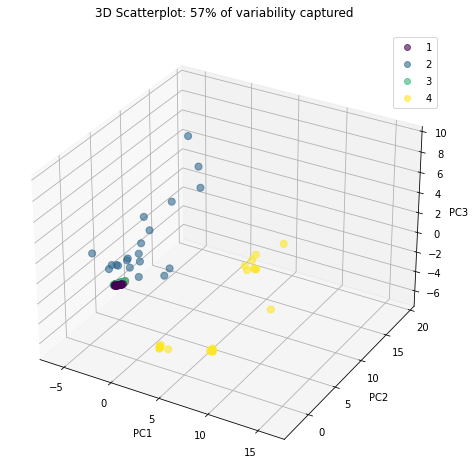

In [39]:
plotPCA3(X_C_pca_3, Y_C, "57")

In [40]:
plotPCA3I(X_C_pca_3, Y_C_map, "Meter C")

#### __3.C.6 Feature Importance__

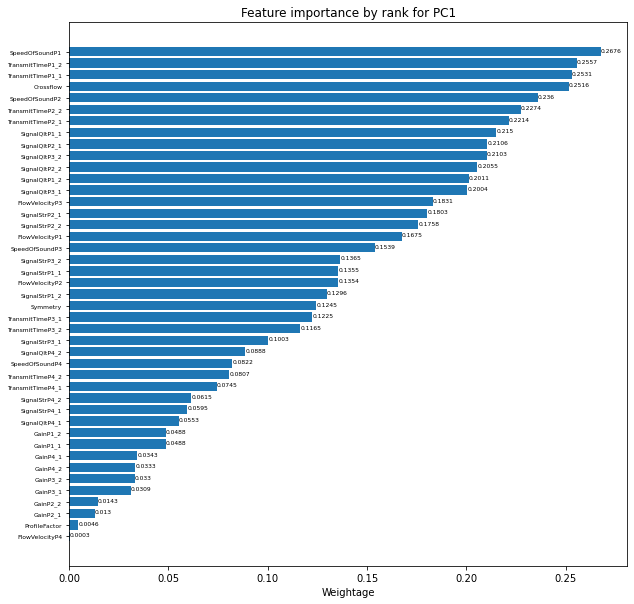

Top 5 important feature for PC1:  [['SpeedOfSoundP1', 'TransmitTimeP1_2', 'TransmitTimeP1_1', 'Crossflow', 'SpeedOfSoundP2']]


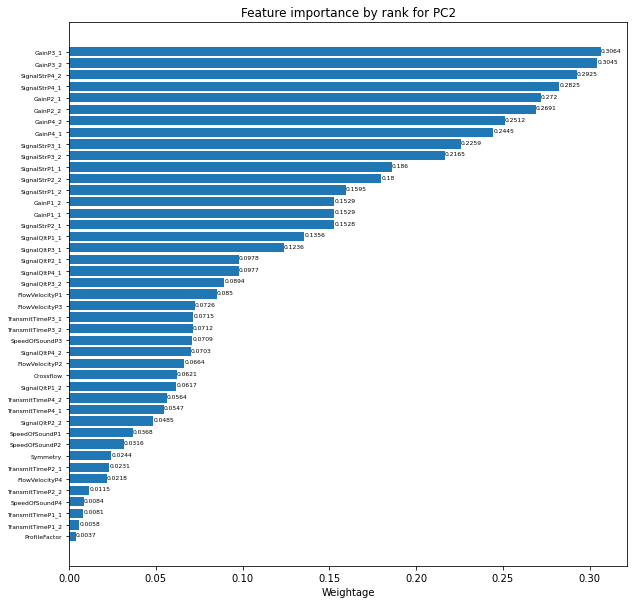

Top 5 important feature for PC2:  [['GainP3_1', 'GainP3_2', 'SignalStrP4_2', 'SignalStrP4_1', 'GainP2_1']]


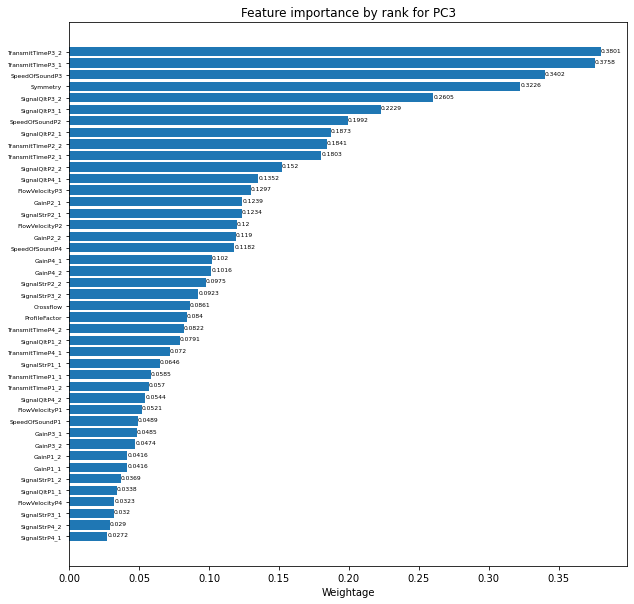

Top 5 important feature for PC3:  [['TransmitTimeP3_2', 'TransmitTimeP3_1', 'SpeedOfSoundP3', 'Symmetry', 'SignalQltP3_2']]


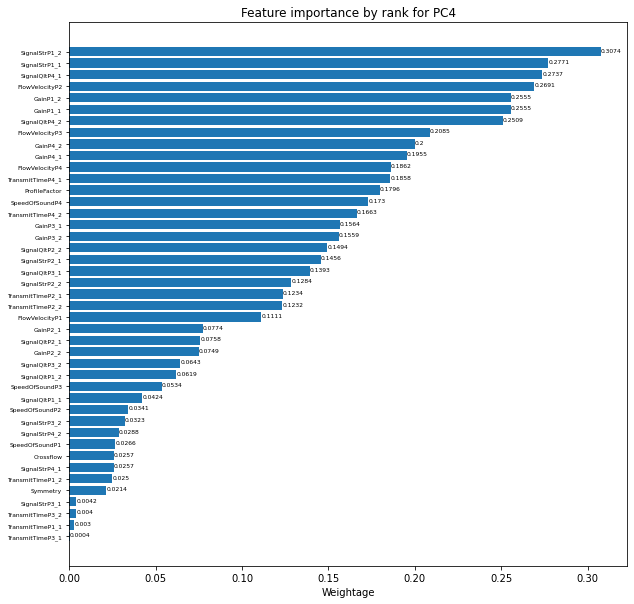

Top 5 important feature for PC4:  [['SignalStrP1_2', 'SignalStrP1_1', 'SignalQltP4_1', 'FlowVelocityP2', 'GainP1_2']]


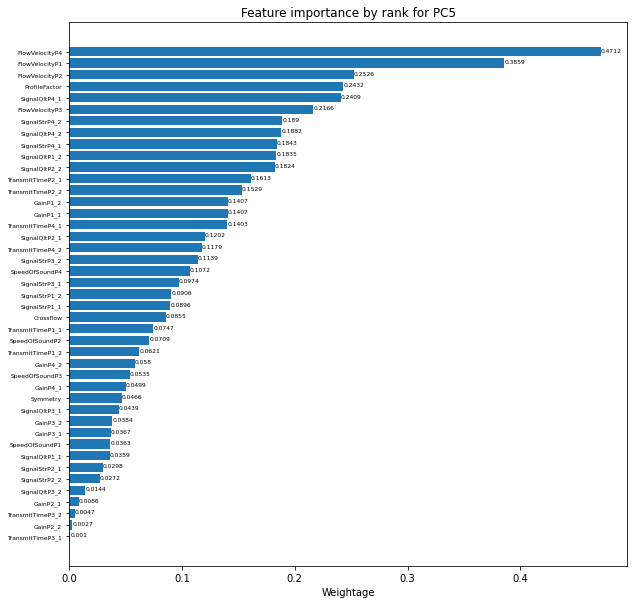

Top 5 important feature for PC5:  [['FlowVelocityP4', 'FlowVelocityP1', 'FlowVelocityP2', 'ProfileFactor', 'SignalQltP4_1']]


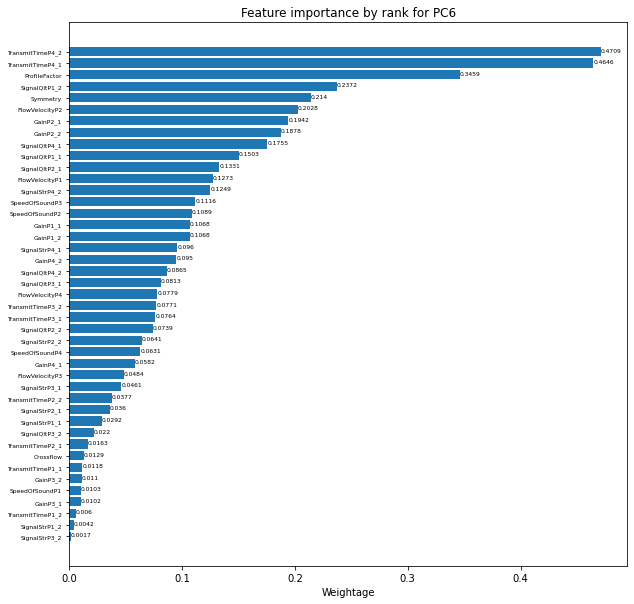

Top 5 important feature for PC6:  [['TransmitTimeP4_2', 'TransmitTimeP4_1', 'ProfileFactor', 'SignalQltP1_2', 'Symmetry']]


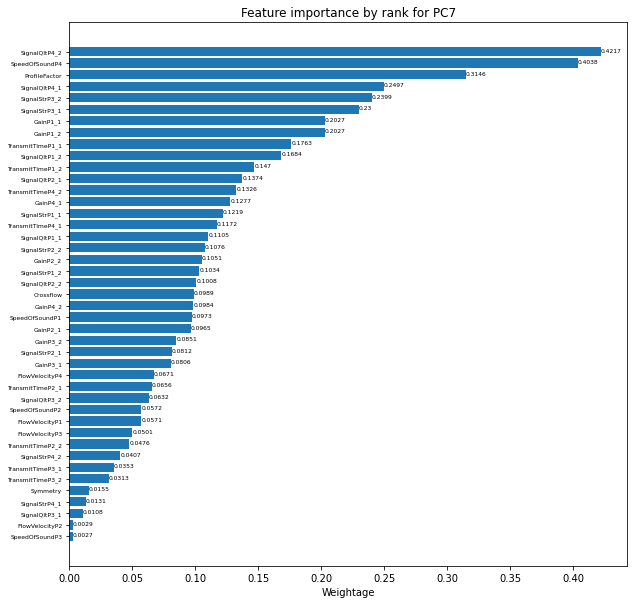

Top 5 important feature for PC7:  [['SignalQltP4_2', 'SpeedOfSoundP4', 'ProfileFactor', 'SignalQltP4_1', 'SignalStrP3_2']]


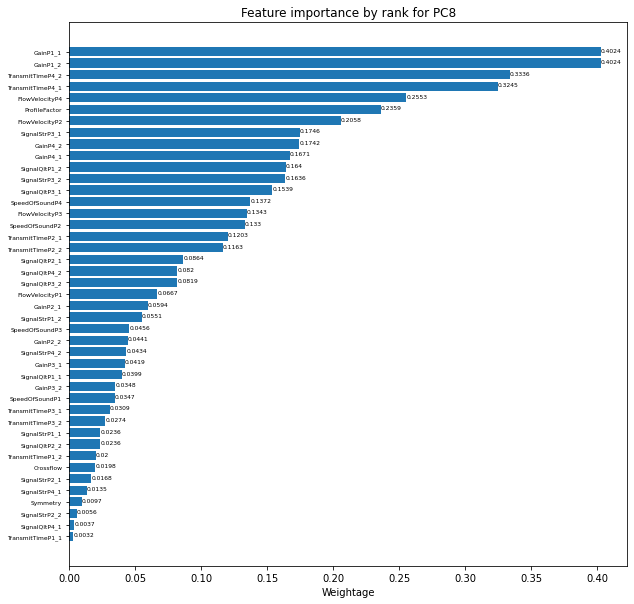

Top 5 important feature for PC8:  [['GainP1_1', 'GainP1_2', 'TransmitTimeP4_2', 'TransmitTimeP4_1', 'FlowVelocityP4']]


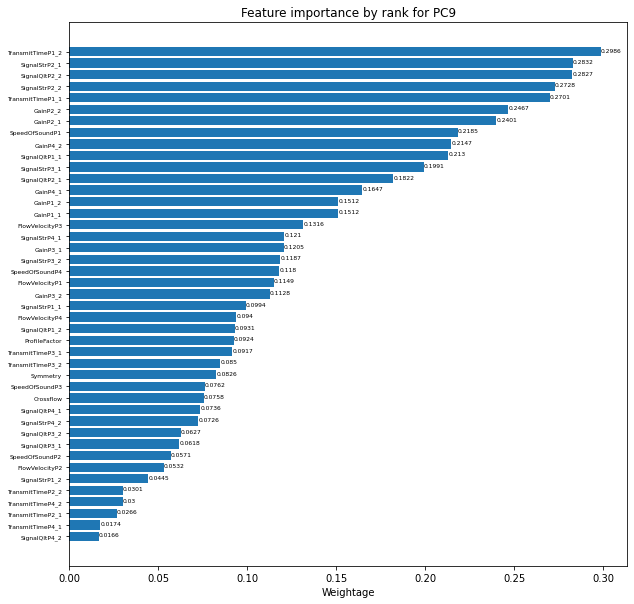

Top 5 important feature for PC9:  [['TransmitTimeP1_2', 'SignalStrP2_1', 'SignalQltP2_2', 'SignalStrP2_2', 'TransmitTimeP1_1']]


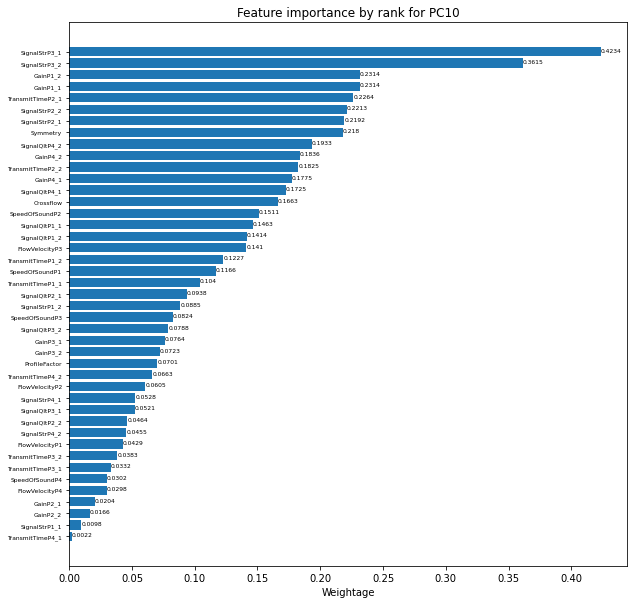

Top 5 important feature for PC10:  [['SignalStrP3_1', 'SignalStrP3_2', 'GainP1_2', 'GainP1_1', 'TransmitTimeP2_1']]


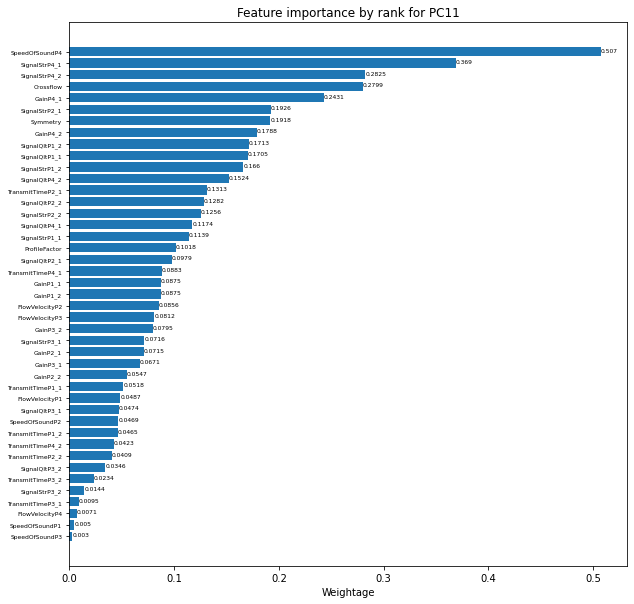

Top 5 important feature for PC11:  [['SpeedOfSoundP4', 'SignalStrP4_1', 'SignalStrP4_2', 'Crossflow', 'GainP4_1']]


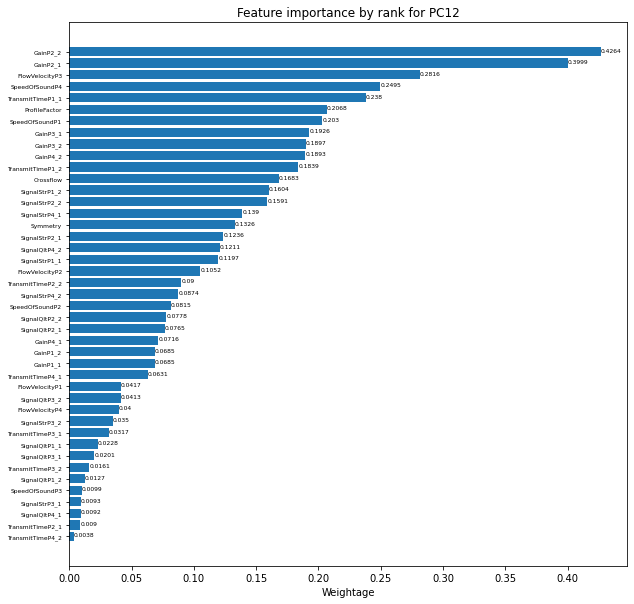

Top 5 important feature for PC12:  [['GainP2_2', 'GainP2_1', 'FlowVelocityP3', 'SpeedOfSoundP4', 'TransmitTimeP1_1']]


In [41]:
X_C_pca_12, C_pca_12 = scale_pca(X_C, 12)
for i in range(1,13):
    plotFeatureImportance(X_C, C_pca_12, i)

### __3.D__

#### __3.D.1. Visualization of Explained Variance and Principal Component__

var_exp:  [5.13889868e-01 1.80024968e-01 7.15438981e-02 5.44703595e-02
 4.47590730e-02 3.98206960e-02 1.78573835e-02 1.69645642e-02
 1.40564091e-02 9.81892215e-03 7.27788242e-03 6.08024836e-03
 5.26181812e-03 4.41340350e-03 3.42508707e-03 1.99116646e-03
 1.89346186e-03 1.42560128e-03 1.00763671e-03 8.27204406e-04
 7.29364803e-04 6.64656963e-04 4.56469993e-04 3.78053406e-04
 2.62431460e-04 1.91639178e-04 1.52113043e-04 1.14953866e-04
 6.31734612e-05 5.30661365e-05 3.46652952e-05 2.80939312e-05
 2.31735746e-05 1.40289491e-05 7.64746157e-06 6.11792050e-06
 4.80615910e-06 3.61450936e-06 2.24041345e-06 2.27156091e-08
 1.37269316e-08 8.75111583e-10 2.78130407e-33]
cum_var_exp(%):  [ 51.3889868   69.39148364  76.54587345  81.9929094   86.4688167
  90.4508863   92.23662465  93.93308107  95.33872198  96.3206142
  97.04840244  97.65642727  98.18260909  98.62394944  98.96645814
  99.16557479  99.35492098  99.4974811   99.59824478  99.68096522
  99.7539017   99.82036739  99.86601439  99.90381973  

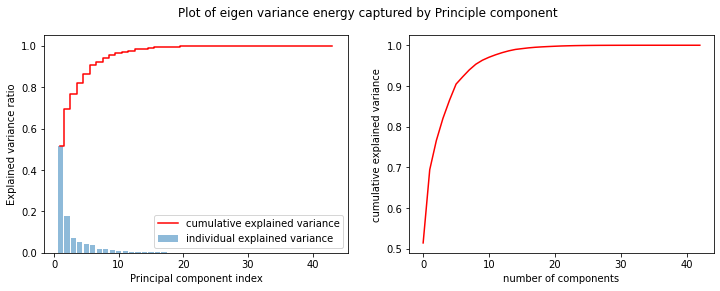

In [42]:
plotPCA(X_D)

Observation:
9 PC Components is suffice to represent about 95% variance of the data.

#### __3.D.2. Compute and apply PCA with Principal Component=2__

In [43]:
X_D_pca_2, _ = scale_pca(X_D, 2)
# X_clean_scale_pca_2 = scale_pca(df_D_clean_X, 2)

#### __3.D.3. Visualizing Data in 2 Dimension Scatter Plot__

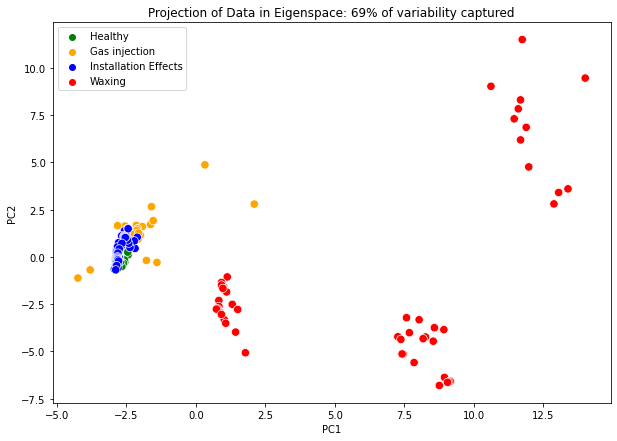

In [44]:
plotPCA2(X_D_pca_2, Y_D_map, "69")

#### __3.D.4. Compute and apply PCA with Principal Component=3__

In [45]:
X_D_pca_3, _ = scale_pca(X_D, 3)

#### __3.D.5. Visualizing Data in 3 Dimension Scatter Plot__

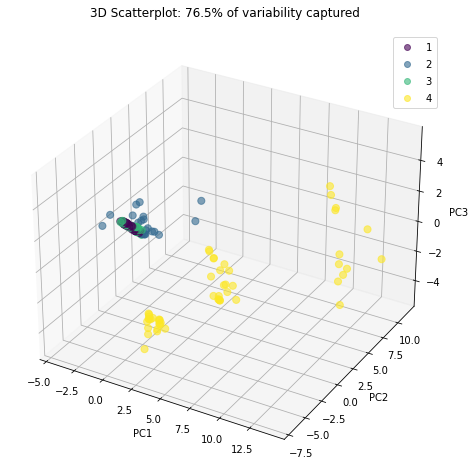

In [46]:
plotPCA3(X_D_pca_3, Y_D, "76.5")

In [47]:
plotPCA3I(X_D_pca_3, Y_D_map, "Meter D")

#### __3.D.6 Feature Importance__

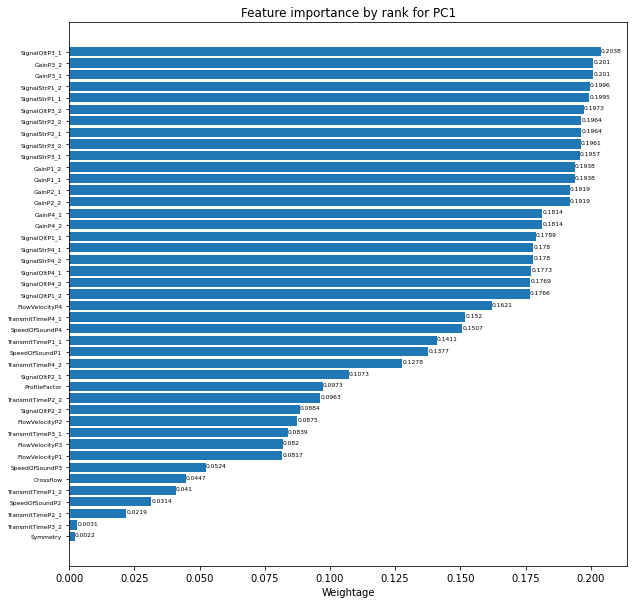

Top 5 important feature for PC1:  [['SignalQltP3_1', 'GainP3_2', 'GainP3_1', 'SignalStrP1_2', 'SignalStrP1_1']]


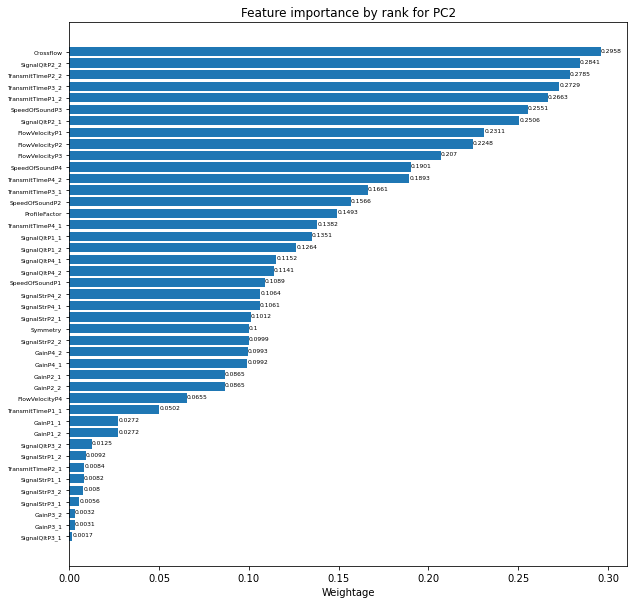

Top 5 important feature for PC2:  [['Crossflow', 'SignalQltP2_2', 'TransmitTimeP2_2', 'TransmitTimeP3_2', 'TransmitTimeP1_2']]


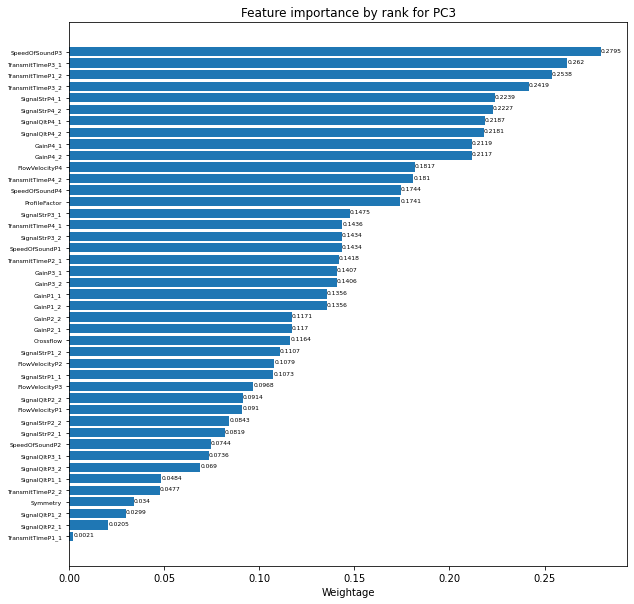

Top 5 important feature for PC3:  [['SpeedOfSoundP3', 'TransmitTimeP3_1', 'TransmitTimeP1_2', 'TransmitTimeP3_2', 'SignalStrP4_1']]


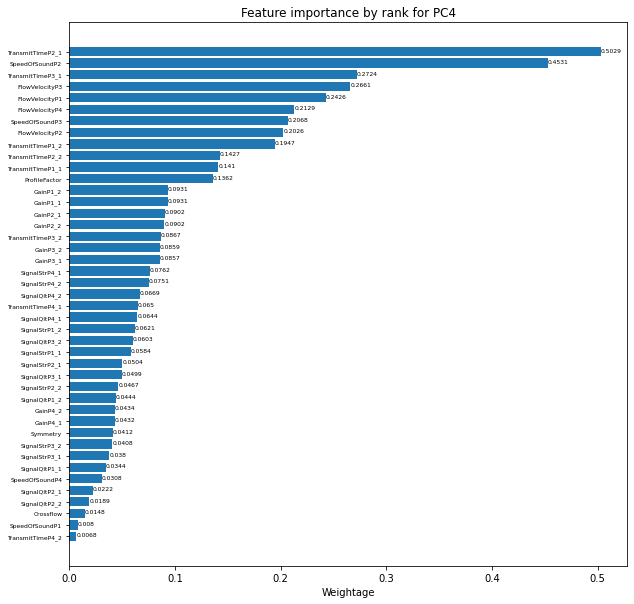

Top 5 important feature for PC4:  [['TransmitTimeP2_1', 'SpeedOfSoundP2', 'TransmitTimeP3_1', 'FlowVelocityP3', 'FlowVelocityP1']]


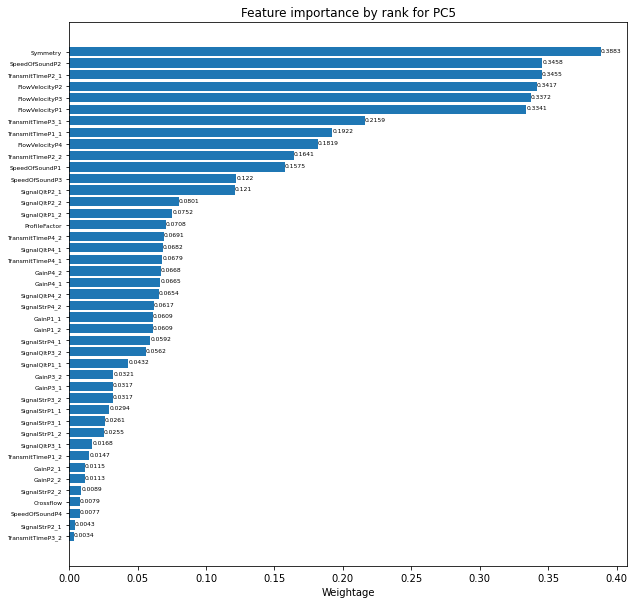

Top 5 important feature for PC5:  [['Symmetry', 'SpeedOfSoundP2', 'TransmitTimeP2_1', 'FlowVelocityP2', 'FlowVelocityP3']]


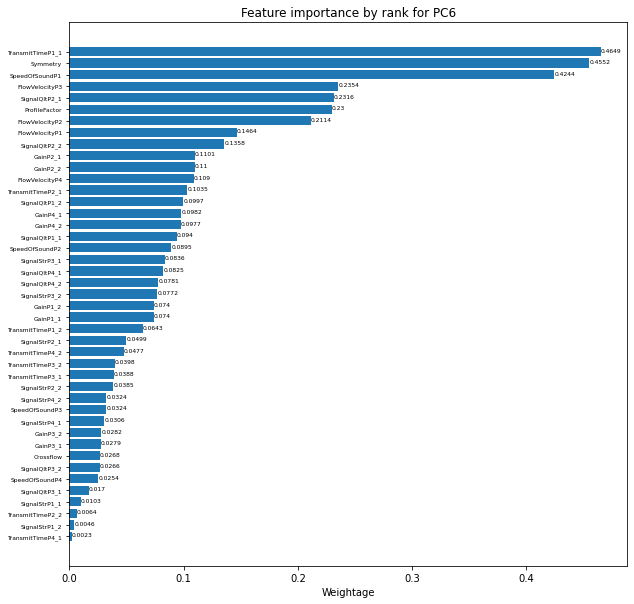

Top 5 important feature for PC6:  [['TransmitTimeP1_1', 'Symmetry', 'SpeedOfSoundP1', 'FlowVelocityP3', 'SignalQltP2_1']]


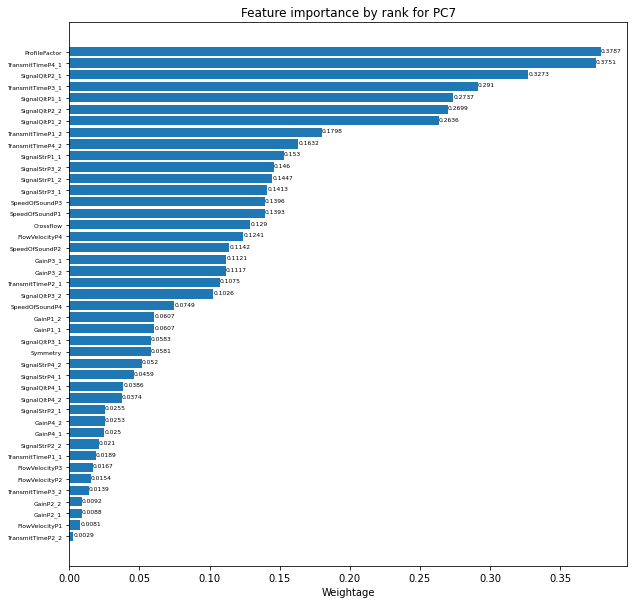

Top 5 important feature for PC7:  [['ProfileFactor', 'TransmitTimeP4_1', 'SignalQltP2_1', 'TransmitTimeP3_1', 'SignalQltP1_1']]


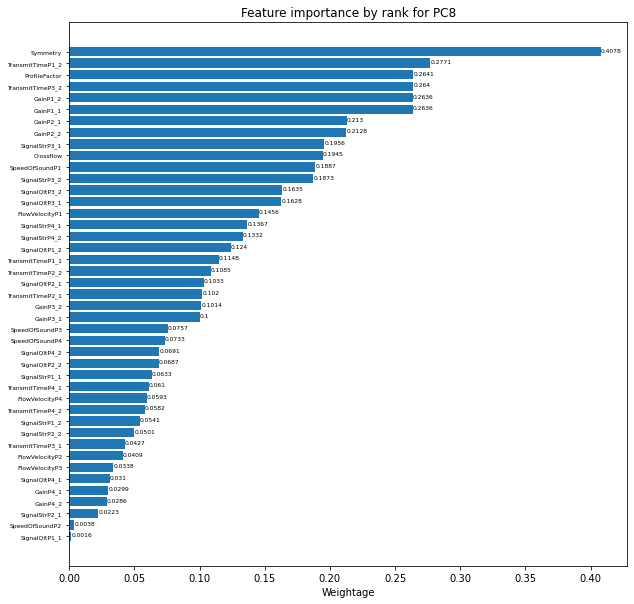

Top 5 important feature for PC8:  [['Symmetry', 'TransmitTimeP1_2', 'ProfileFactor', 'TransmitTimeP3_2', 'GainP1_2']]


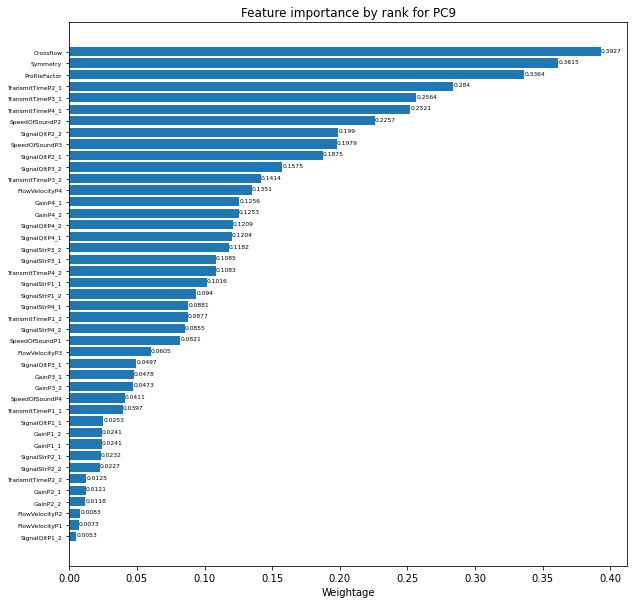

Top 5 important feature for PC9:  [['Crossflow', 'Symmetry', 'ProfileFactor', 'TransmitTimeP2_1', 'TransmitTimeP3_1']]


In [48]:
X_D_pca_9, D_pca_9 = scale_pca(X_D, 9)
for i in range(1,10):
    plotFeatureImportance(X_D, D_pca_9, i)

## __4. Prepare dataset__

In [49]:
def scale_pca_model(X_train, X_test, n_component):
    # apply standaization to both training and test daset but separately (THIS IS IMPORTANT)
    sc = StandardScaler()

    #  fit on training set only and apply transformation to both the training set and the test set
    X_scale_train = sc.fit_transform(X_train)
    X_scale_test = sc.transform(X_test)

    # apply PCA
    pca = PCA(n_components=n_component)
    X_train_pca = pca.fit_transform(X_scale_train)
    X_test_pca = pca.transform(X_scale_test)

    # change into panda dataframe
    X_train_pca = pd.DataFrame(data=X_train_pca, columns=[f"PC{i}" for i in range(1,pca.n_components+1)])
    X_test_pca = pd.DataFrame(data=X_test_pca, columns=[f"PC{i}" for i in range(1,pca.n_components+1)])

    return X_train_pca, X_test_pca

random_state = 0

### __4.B__

#### __4.B.1. Split Data into Training and Test set (80:20/70:30)__

In [50]:
# original dataset with 80:20 split
X_B_og_train, X_B_og_test, Y_B_og_train, Y_B_og_test = train_test_split(X_B, Y_B, random_state=random_state, shuffle=True, test_size=0.2)

# original dataset with 70:30 split
X_B_og_train_2, X_B_og_test_2, Y_B_og_train_2, Y_B_og_test_2 = train_test_split(X_B, Y_B, random_state=random_state, shuffle=True, test_size=0.3)


In [51]:
# original dataset with PCA with 80:20 split
X_B_train, X_B_test, Y_B_train, Y_B_test = train_test_split(X_B, Y_B, random_state=random_state, shuffle=True, test_size=0.2)
X_B_train, X_B_test = scale_pca_model(X_B_train, X_B_test, 7)

# original dataset with PCA with 70:30 split
X_B_train_2, X_B_test_2, Y_B_train_2, Y_B_test_2 = train_test_split(X_B, Y_B, random_state=random_state, shuffle=True, test_size=0.3)
X_B_train_2, X_B_test_2 = scale_pca_model(X_B_train_2, X_B_test_2, 7)

### __4.C__

#### __4.C.1. Split Data into Training and Test set (80:20/70:30)__

In [52]:
# original dataset with 80:20 split
X_C_og_train, X_C_og_test, Y_C_og_train, Y_C_og_test = train_test_split(X_C, Y_C, random_state=random_state, shuffle=True, test_size=0.2)

# original dataset with 70:30 split
X_C_og_train_2, X_C_og_test_2, Y_C_og_train_2, Y_C_og_test_2 = train_test_split(X_C, Y_C, random_state=random_state, shuffle=True, test_size=0.3)


In [53]:
# original dataset with PCA with 80:20 split
X_C_train, X_C_test, Y_C_train, Y_C_test = train_test_split(X_C, Y_C, random_state=random_state, shuffle=True, test_size=0.2)
X_C_train, X_C_test = scale_pca_model(X_C_train, X_C_test, 12)

# original dataset with PCA with 70:30 split
X_C_train_2, X_C_test_2, Y_C_train_2, Y_C_test_2 = train_test_split(X_C, Y_C, random_state=random_state, shuffle=True, test_size=0.3)
X_C_train_2, X_C_test_2 = scale_pca_model(X_C_train_2, X_C_test_2, 12)

### __4.D__

#### __4.D.1. Split Data into Training and Test set (80:20/70:30)__

In [54]:
# original dataset with 80:20 split
X_D_og_train, X_D_og_test, Y_D_og_train, Y_D_og_test = train_test_split(X_D, Y_D, random_state=random_state, shuffle=True, test_size=0.2)

# original dataset with 70:30 split
X_D_og_train_2, X_D_og_test_2, Y_D_og_train_2, Y_D_og_test_2 = train_test_split(X_D, Y_D, random_state=random_state, shuffle=True, test_size=0.3)


In [55]:
# original dataset with PCA with 80:20 split
X_D_train, X_D_test, Y_D_train, Y_D_test = train_test_split(X_D, Y_D, random_state=random_state, shuffle=True, test_size=0.2)
X_D_train, X_D_test = scale_pca_model(X_D_train, X_D_test, 9)

# original dataset with PCA with 70:30 split
X_D_train_2, X_D_test_2, Y_D_train_2, Y_D_test_2 = train_test_split(X_D, Y_D, random_state=random_state, shuffle=True, test_size=0.3)
X_D_train_2, X_D_test_2 = scale_pca_model(X_D_train_2, X_D_test_2, 9)

### __4.X. OLD__

In [56]:
# def scale_pca_model(X_train, X_test, n_component):
#     # apply standaization to both training and test daset but separately (THIS IS IMPORTANT)
#     sc = StandardScaler()

#     #  fit on training set only and apply transformation to both the training set and the test set
#     X_scale_train = sc.fit_transform(X_train)
#     X_scale_test = sc.transform(X_test)

#     # apply PCA
#     pca = PCA(n_components=n_component)
#     X_train_pca = pca.fit_transform(X_scale_train)
#     X_test_pca = pca.transform(X_scale_test)

#     # change into panda dataframe
#     X_train_pca = pd.DataFrame(data=X_train_pca, columns=[f"PC{i}" for i in range(1,pca.n_components+1)])
#     X_test_pca = pd.DataFrame(data=X_test_pca, columns=[f"PC{i}" for i in range(1,pca.n_components+1)])

#     return X_train_pca, X_test_pca

# random_state = 0

#### __4.X. Original dataset__

In [57]:
# X_og_train, X_og_test, Y_og_train, Y_og_test = train_test_split(X, Y, random_state=random_state, test_size=0.2)
# X_og_train_2, X_og_test_2, Y_og_train_2, Y_og_test_2 = train_test_split(X, Y, random_state=random_state, test_size=0.3)

# X_clean_og_train, X_clean_og_test, Y_clean_og_train, Y_clean_og_test = train_test_split(df_D_clean_X, df_D_clean_Y, random_state=random_state, test_size=0.2)
# X_clean_og_train_2, X_clean_og_test_2, Y_clean_og_train_2, Y_clean_og_test_2 = train_test_split(df_D_clean_X, df_D_clean_Y, random_state=random_state, test_size=0.3)

#### __4.X. Original dataset with PCA__

In [58]:
# # original dataset

# # split dataset 80:20 
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=random_state, test_size=0.2)

# # 80:20 dataset with PCA component=9
# X_train_pca, X_test_pca = scale_pca_model(X_train, X_test, 9)

# # dataset prepared
# # X_train_pca, X_test_pca, Y_train, Y_test

In [59]:
# # split dataset 70:30
# X_train_2, X_test_2, Y_train_2, Y_test_2 = train_test_split(X, Y, random_state=random_state, test_size=0.3)

# # 70:30 dataset with PCA component=9
# X_train_pca_2, X_test_pca_2 = scale_pca_model(X_train_2, X_test_2, 9)

# # dataset prepared
# # X_train_pca_2, X_test_pca_2, Y_train_2, Y_test_2

#### __4.X. Cleaned dataset with PCA__

In [60]:
# # cleaned dataset

# # split dataset 80:20 
# X_clean_train, X_clean_test, Y_clean_train, Y_clean_test = train_test_split(df_D_clean_X, df_D_clean_Y, random_state=random_state, test_size=0.2)

# # 80:20 dataset with PCA component=5
# X_clean_train_pca, X_clean_test_pca = scale_pca_model(X_clean_train, X_clean_test, 5)

# # dataset prepared
# # X_clean_train_pca, X_clean_test_pca, Y_clean_train, Y_clean_test

In [61]:
# # split dataset 70:30
# X_clean_train_2, X_clean_test_2, Y_clean_train_2, Y_clean_test_2 = train_test_split(df_D_clean_X, df_D_clean_Y, random_state=random_state, test_size=0.3)

# # 70:30 dataset with PCA component=5
# X_clean_train_pca_2, X_clean_test_pca_2 = scale_pca_model(X_clean_train_2, X_clean_test_2, 5)

# # dataset prepared
# # X_clean_train_pca_2, X_clean_test_pca_2, Y_clean_train_2, Y_clean_test_2

## __5. Predictive Model__

In [62]:
title_og = ["Original Dataset (80:20)",
            "Original Dataset (70:30)",]

title = ["Original Dataset with PCA (80:20)",
         "Original Dataset with PCA (70:30)"]

# dataset_og = [[X_og_train, X_og_test, Y_og_train, Y_og_test],
#            [X_og_train_2, X_og_test_2, Y_og_train_2, Y_og_test_2],
#            [X_clean_og_train, X_clean_og_test, Y_clean_og_train, Y_clean_og_test],
#            [X_clean_og_train_2, X_clean_og_test_2, Y_clean_og_train_2, Y_clean_og_test_2]
#            ]

# dataset = [[X_train_pca, X_test_pca, Y_train, Y_test],
#            [X_train_pca_2, X_test_pca_2, Y_train_2, Y_test_2],
#            [X_clean_train_pca, X_clean_test_pca, Y_clean_train, Y_clean_test],
#            [X_clean_train_pca_2, X_clean_test_pca_2, Y_clean_train_2, Y_clean_test_2]
#            ]

# title_og = ["Original Dataset (80:20)",
#             "Original Dataset (70:30)",
#             "Cleaned Dataset (80:20)",
#             "Cleaned Dataset (70:30)"]

# title = ["Original Dataset with PCA (80:20)",
#          "Original Dataset with PCA (70:30)",
#          "Cleaned Dataset with PCA (80:20)",
#          "Cleaned Dataset with PCA (70:30)"]

def plotAccuracyGraph(xValue, trainAcc, testAcc, xLabel, title, xScale=''):
    plt.plot(xValue, trainAcc, 'ro-', xValue, testAcc,'bv--')
    plt.legend(['Training Accuracy','Test Accuracy'])
    plt.xlabel(xLabel)
    plt.ylabel('Accuracy')
    if xLabel == 'C':
        plt.xscale('log')
    plt.title(title)
    
    plt.show()

def plotConfusionMatrix(Y_test, Y_pred):
    Y_test_pd = pd.DataFrame(Y_test.to_list(), columns=['Y_Actual'])
    Y_pred_pd = pd.DataFrame(Y_pred, columns=['Y_Predicted'])
    df = pd.DataFrame(pd.concat([Y_test_pd,Y_pred_pd], axis=1))
    confusion_matrix = pd.crosstab(df['Y_Actual'], df['Y_Predicted'], rownames=['Actual'], colnames=['Predicted'])
    sns.heatmap(confusion_matrix, annot=True)
    acc = f'Accuracy: {accuracy_score(Y_test, Y_pred)}'
    
    plt.title(acc, size = 15)

    plt.show()


def useKNN(X_train, X_test, Y_train, Y_test, numNeighbors=30):
    trainAcc = []
    testAcc = []

    for k in range(1,numNeighbors):
        clf = KNeighborsClassifier(n_neighbors=k, metric='minkowski', p=2)
        clf.fit(X_train, Y_train)
        
        Y_predTrain = clf.predict(X_train)
        Y_predTest = clf.predict(X_test)

        trainAcc.append(accuracy_score(Y_train, Y_predTrain))
        testAcc.append(accuracy_score(Y_test, Y_predTest))

        plotConfusionMatrix(Y_test, Y_predTest)
    
    return trainAcc, testAcc

def useGaussianNaiveBayes(X_train, X_test, Y_train, Y_test):
    clf = GaussianNB()
    clf.fit(X_train, Y_train)
    Y_predTrain = clf.predict(X_train)
    Y_predTest = clf.predict(X_test)

    trainAcc = accuracy_score(Y_train, Y_predTrain)
    testAcc = accuracy_score(Y_test, Y_predTest)

    plotConfusionMatrix(Y_test, Y_predTest)

    return trainAcc, testAcc

maxDepths = [2,3,4,5,6,7,8,9,10,15,20,25,30,35,40,45,50] 

def useDecisionTree(X_train, X_test, Y_train, Y_test):

    trainAcc = np.zeros(len(maxDepths))
    testAcc = np.zeros(len(maxDepths))
    
    index = 0
    for depth in maxDepths:
        clf = DecisionTreeClassifier(criterion='entropy', max_depth=depth)
        clf = clf.fit(X_train, Y_train)

        Y_predTrain = clf.predict(X_train)
        Y_predTest = clf.predict(X_test)
        
        trainAcc[index] = accuracy_score(Y_train, Y_predTrain)
        testAcc[index] = accuracy_score(Y_test, Y_predTest)
        index += 1
        plotConfusionMatrix(Y_test, Y_predTest)
    # tree.plot_tree(clf,feature_names=X_train.columns,class_names=Y_train,filled=True, impurity=True)

    return trainAcc, testAcc

C = [0.01, 0.1, 0.2, 0.5, 0.8, 1, 5, 10, 20, 50]

def useLogisticRegession(X_train, X_test, Y_train, Y_test):
    trainAcc = []
    testAcc = []
    
    for param in C:
        clf = linear_model.LogisticRegression(C=param, max_iter = 5000)
        clf.fit(X_train, Y_train)
        
        Y_predTrain = clf.predict(X_train)
        Y_predTest = clf.predict(X_test)
        
        trainAcc.append(accuracy_score(Y_train, Y_predTrain))
        testAcc.append(accuracy_score(Y_test, Y_predTest))

        plotConfusionMatrix(Y_test, Y_predTest)

    return trainAcc, testAcc

hidden_layer_sizes = [(10,10,10), (20,20,20), (30,30,30), (40,40,40), (50,50,50), (60,60,60), (70,70,70)]

def useNN(X_train, X_test, Y_train, Y_test):
    trainAcc = []
    testAcc = []

    for k in hidden_layer_sizes:
        clf = MLPClassifier(solver='adam',hidden_layer_sizes=k, learning_rate='adaptive',random_state=0,max_iter=1000)
        clf.fit(X_train, Y_train)
        
        Y_predTrain = clf.predict(X_train)
        Y_predTest = clf.predict(X_test)
        
        trainAcc.append(accuracy_score(Y_train, Y_predTrain))
        testAcc.append(accuracy_score(Y_test, Y_predTest))
    return trainAcc, testAcc

hidden_layer_size=[x[0] for x in hidden_layer_sizes]


### __4.B__

#### __4.B.1.KNN__

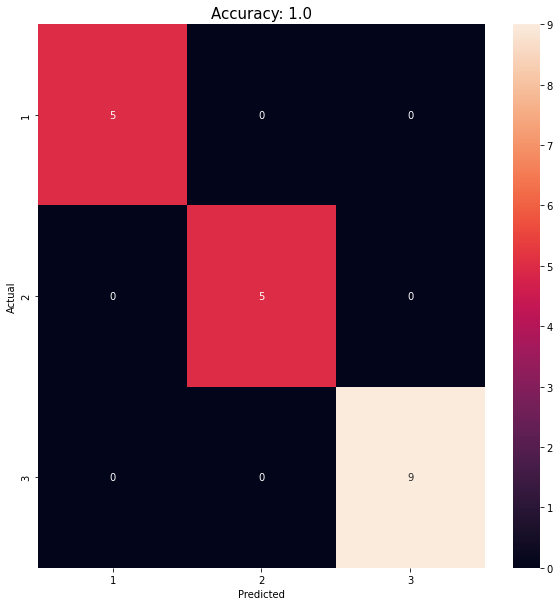

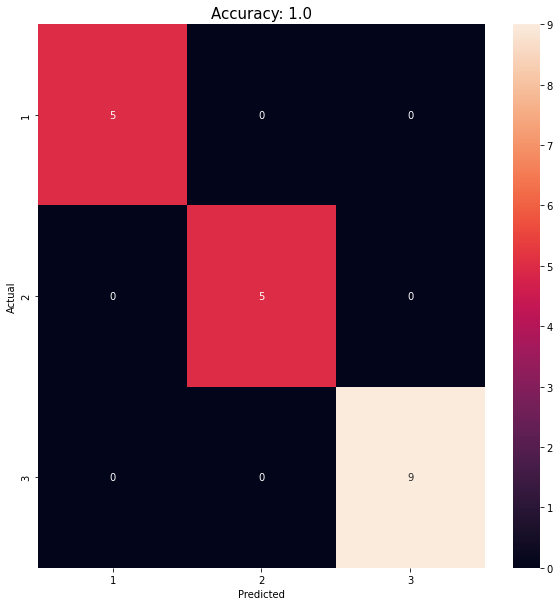

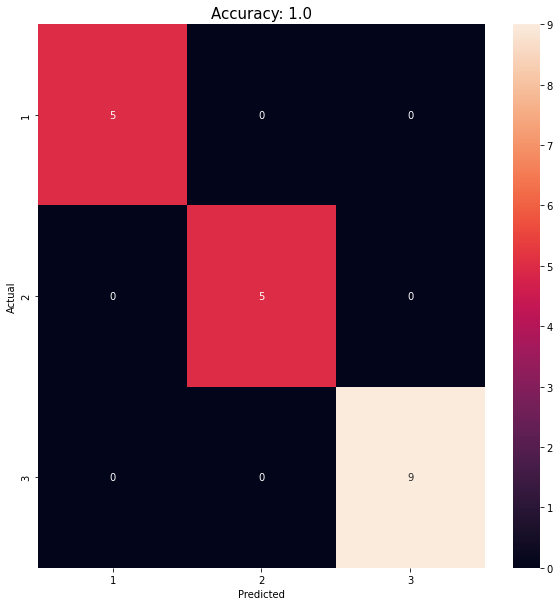

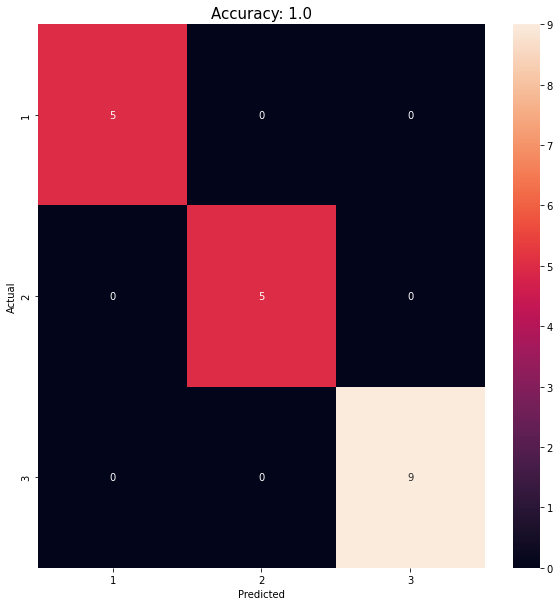

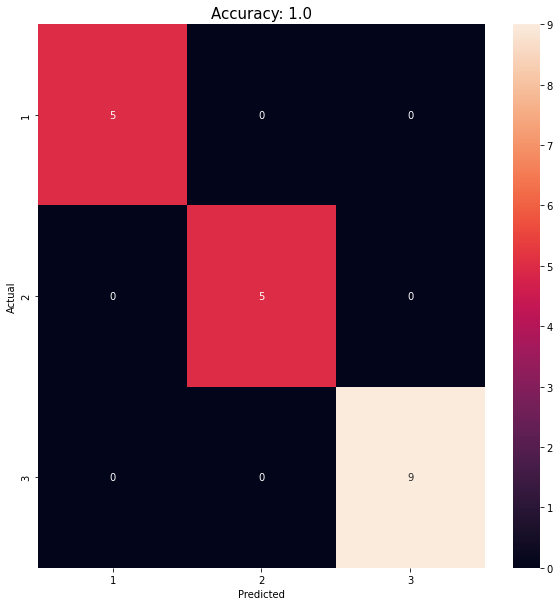

...

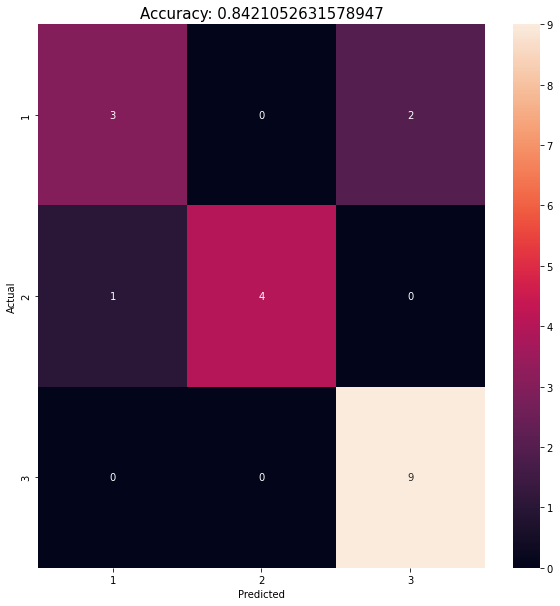

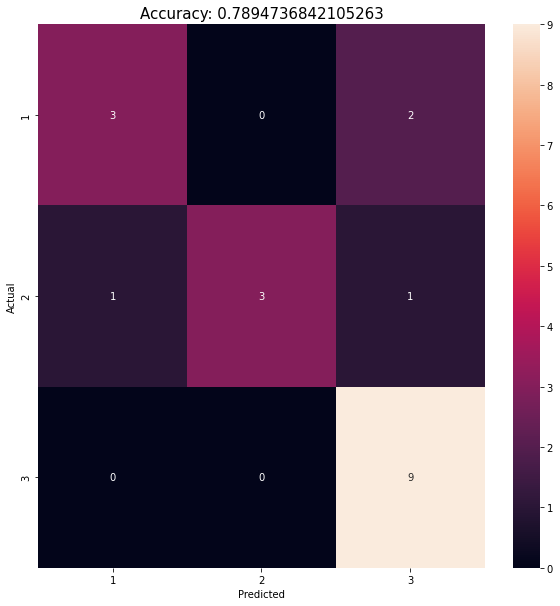

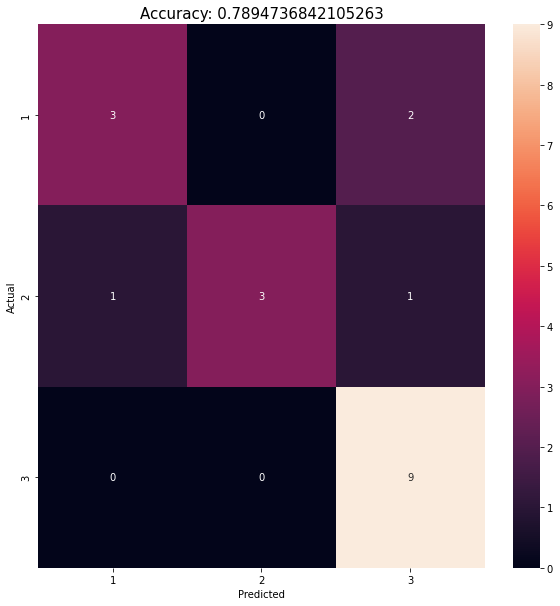

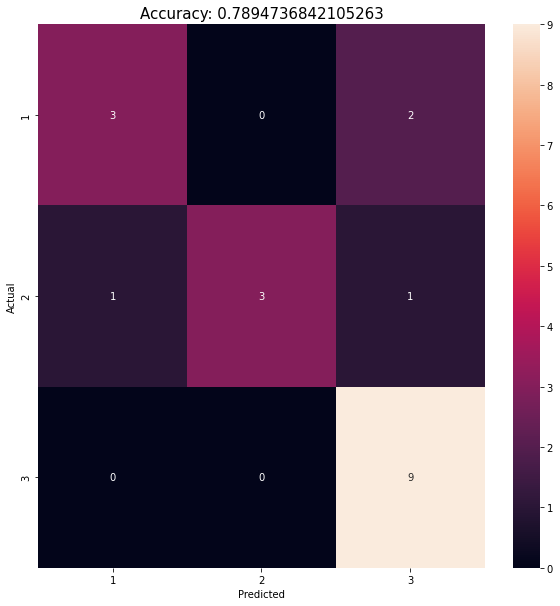

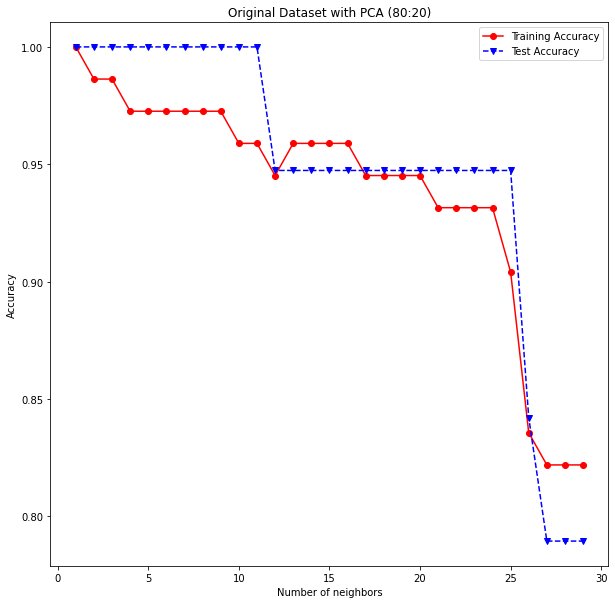

In [63]:
trainAcc, testAcc = useKNN(X_B_train, X_B_test, Y_B_train, Y_B_test)
plotAccuracyGraph(xValue=range(1,30), trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of neighbors', title=title[0])

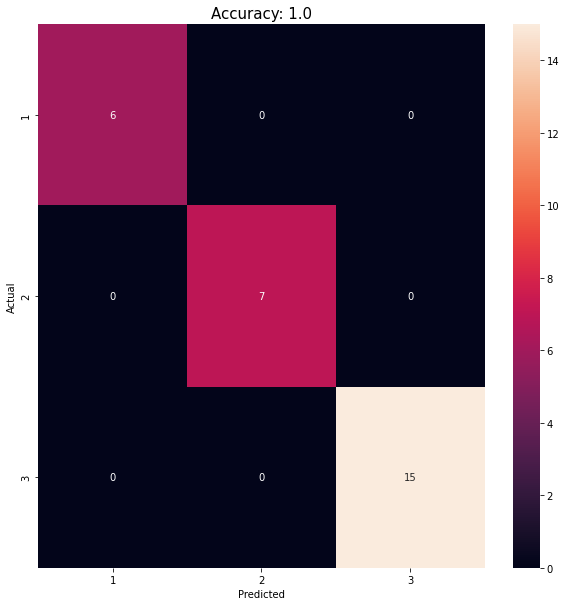

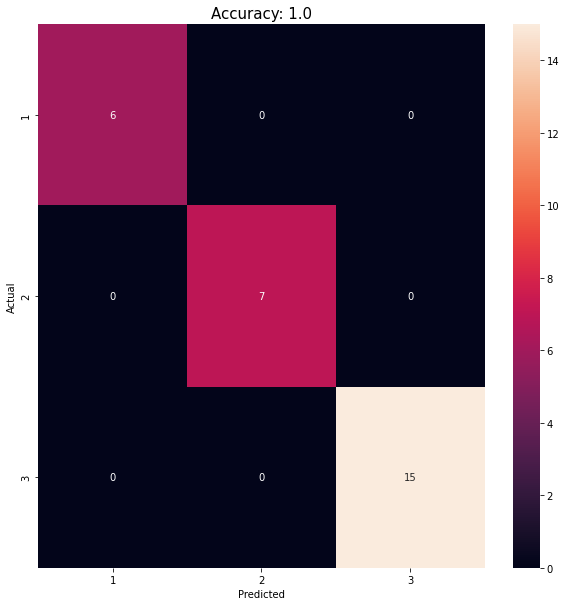

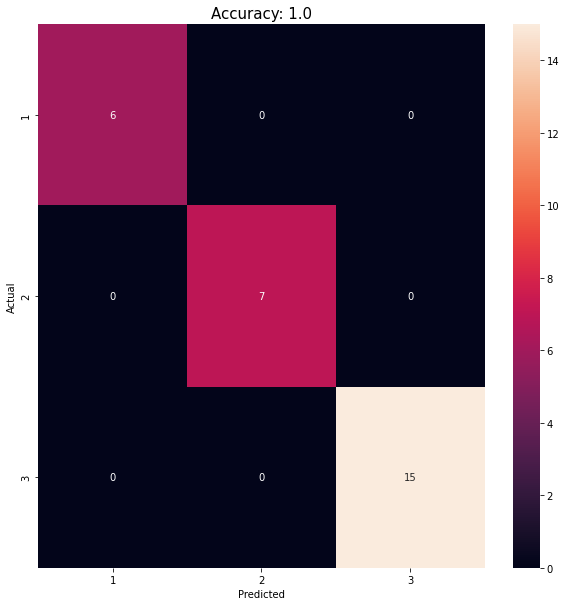

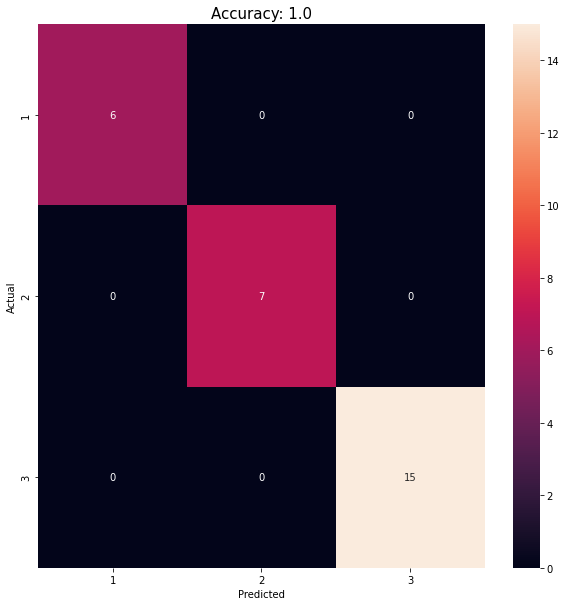

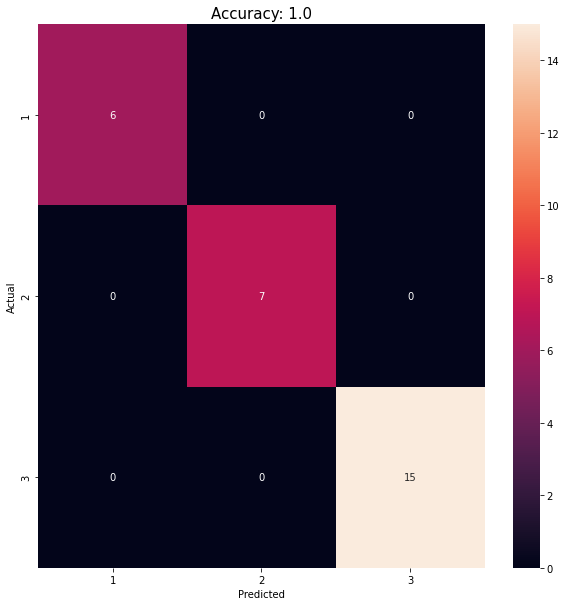

...

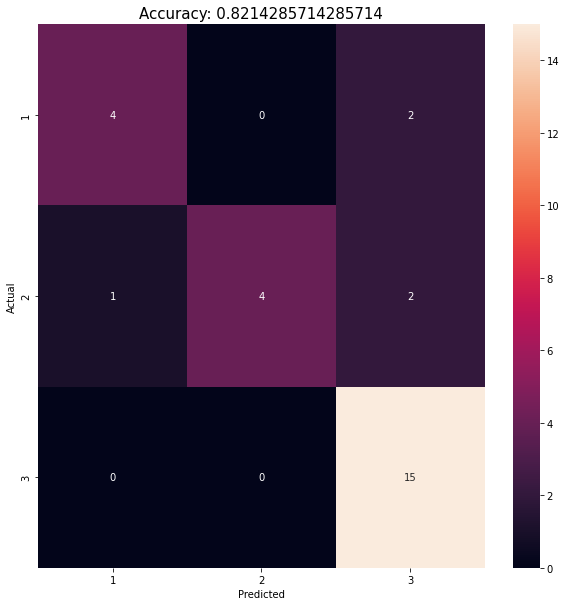

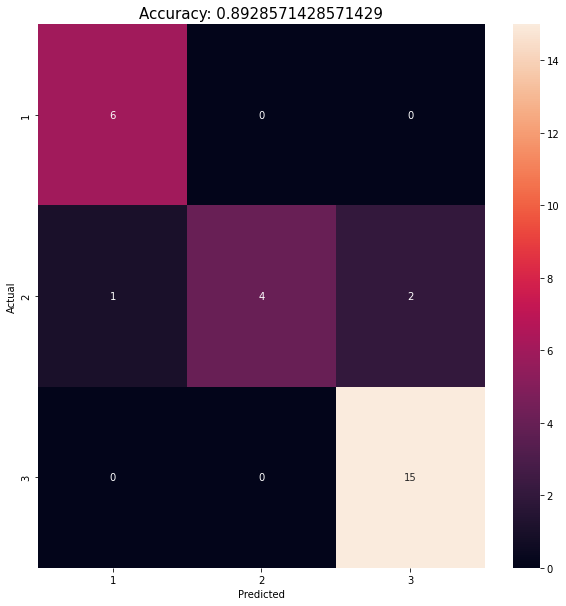

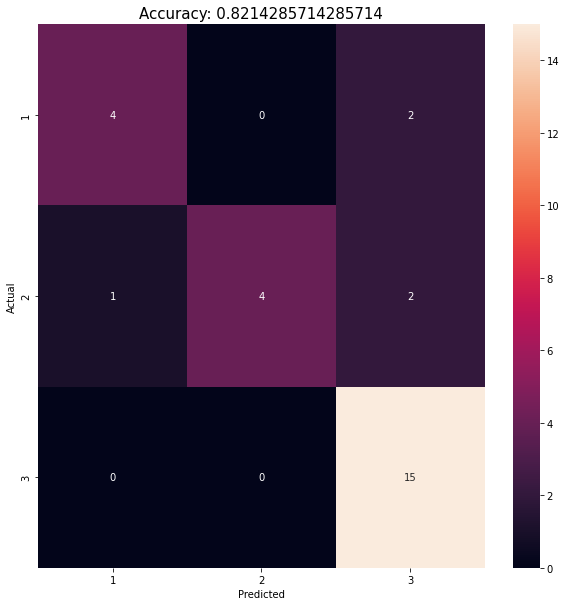

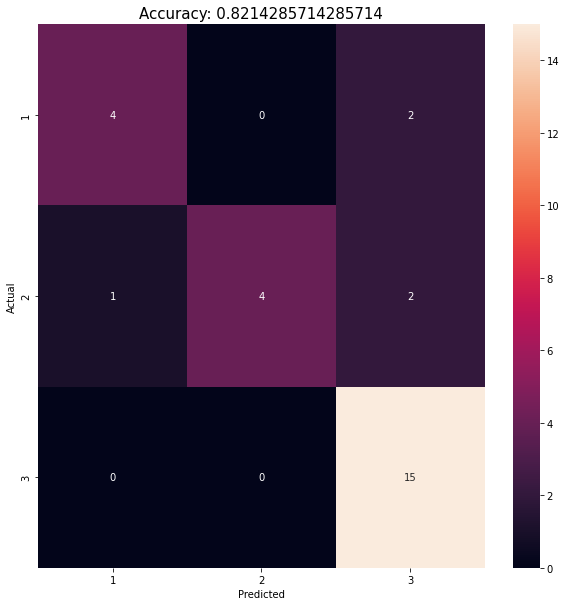

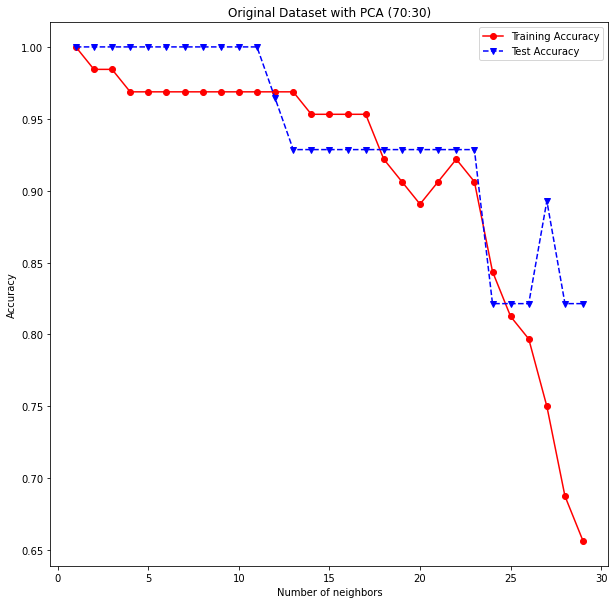

In [64]:
trainAcc, testAcc = useKNN(X_B_train_2, X_B_test_2, Y_B_train_2, Y_B_test_2)
plotAccuracyGraph(xValue=range(1,30), trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of neighbors', title=title[1])

#### __4.B.2.Naive Bayes__

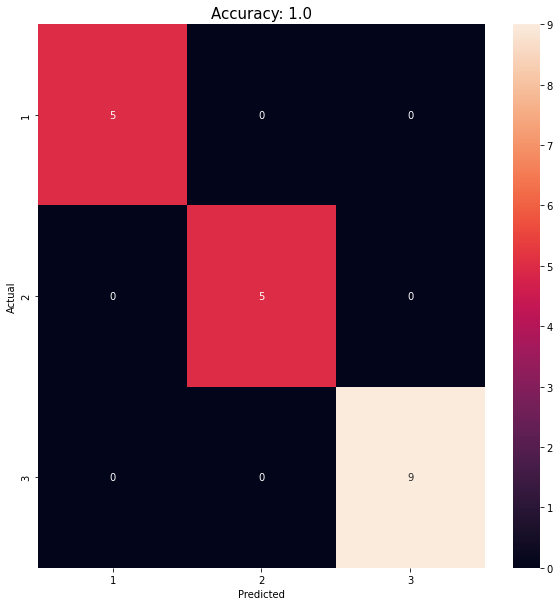

Original Dataset (80:20): Train accuracy: 1.0, Test accuracy: 1.0


In [65]:
trainAcc, testAcc = useGaussianNaiveBayes(X_B_og_train, X_B_og_test, Y_B_og_train, Y_B_og_test)
print(f"{title_og[0]}: Train accuracy: {trainAcc}, Test accuracy: {testAcc}")

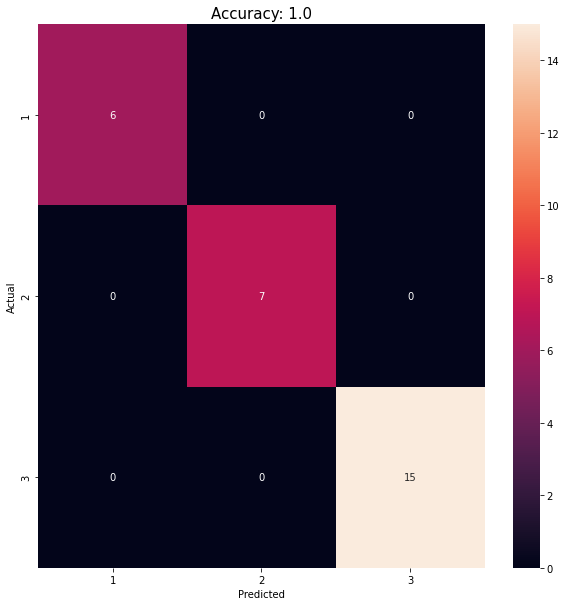

Original Dataset (70:30): Train accuracy: 1.0, Test accuracy: 1.0


In [66]:
trainAcc, testAcc = useGaussianNaiveBayes(X_B_og_train_2, X_B_og_test_2, Y_B_og_train_2, Y_B_og_test_2)
print(f"{title_og[1]}: Train accuracy: {trainAcc}, Test accuracy: {testAcc}")

#### __4.B.3.Decision Tree__

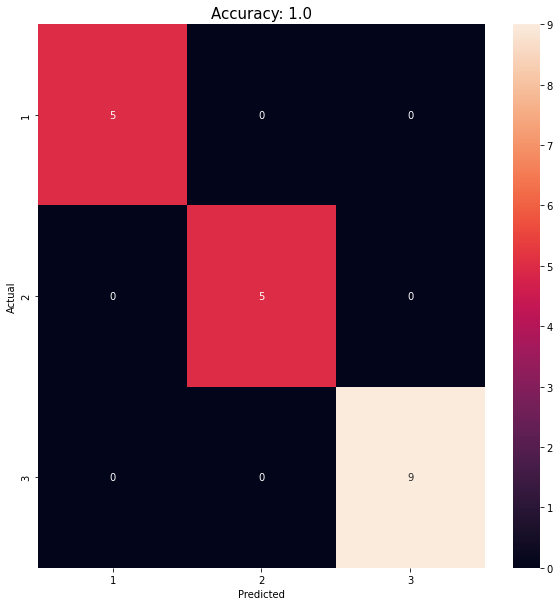

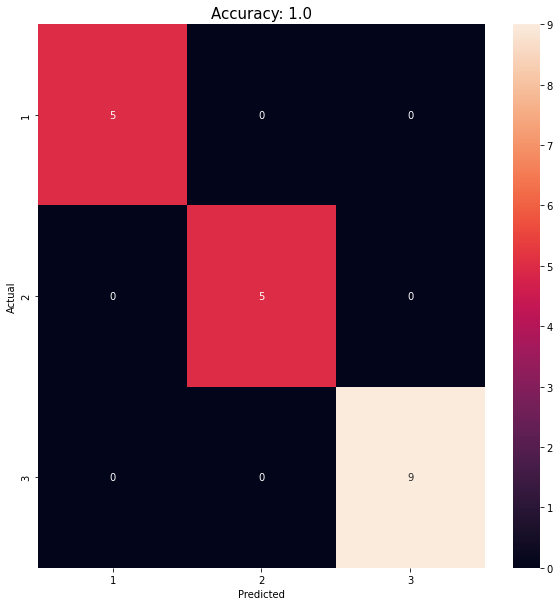

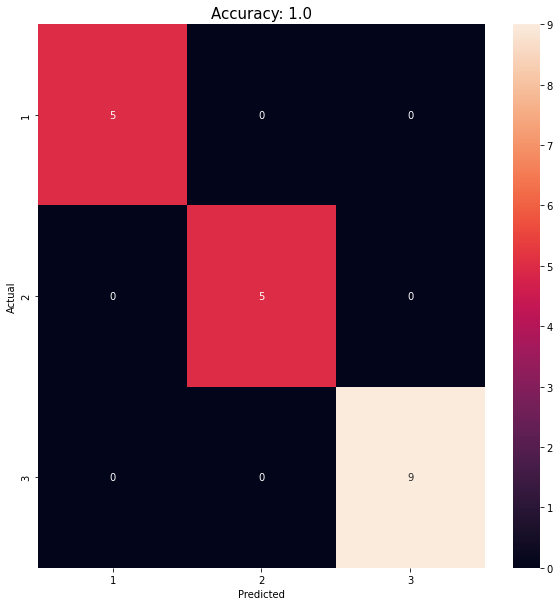

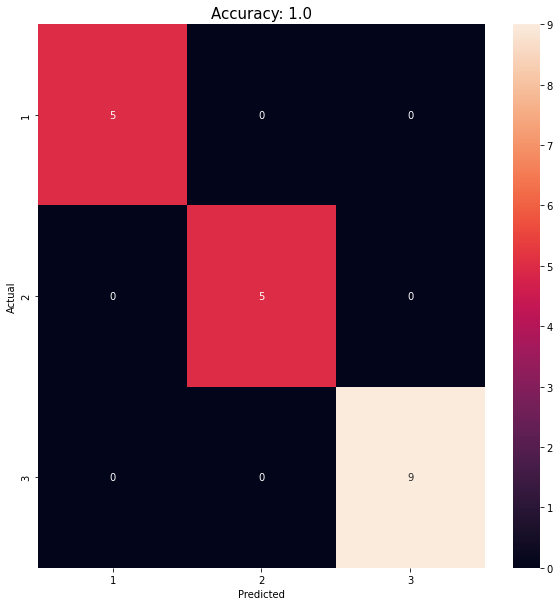

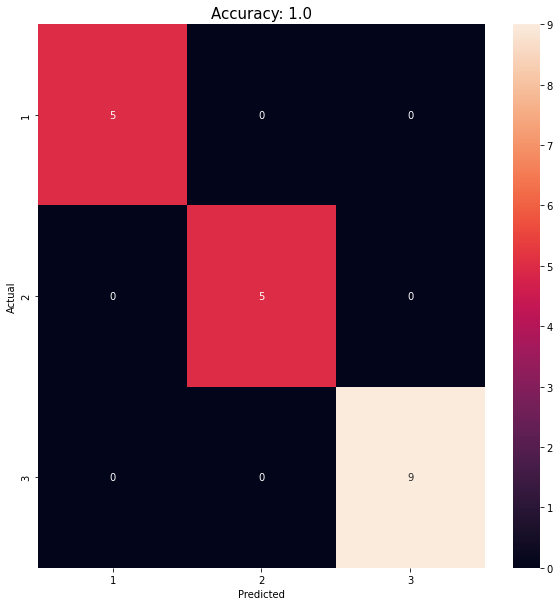

...

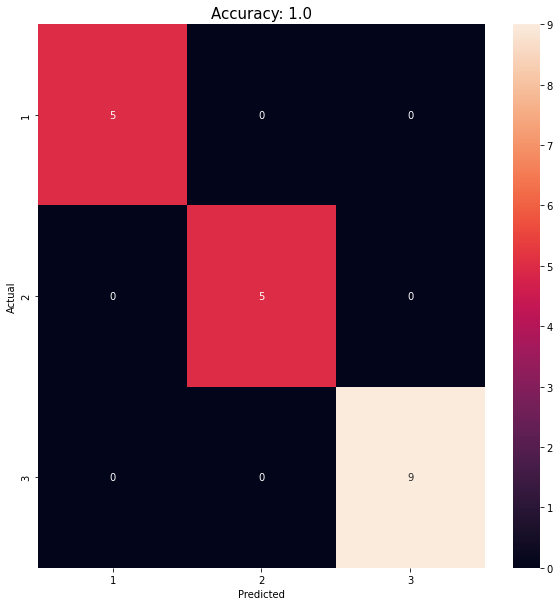

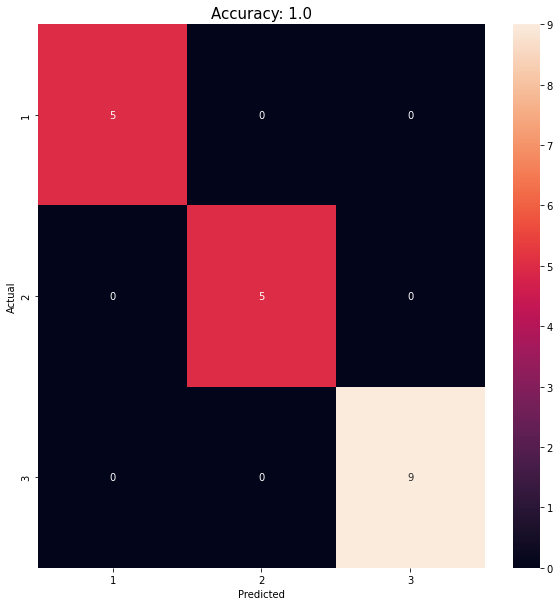

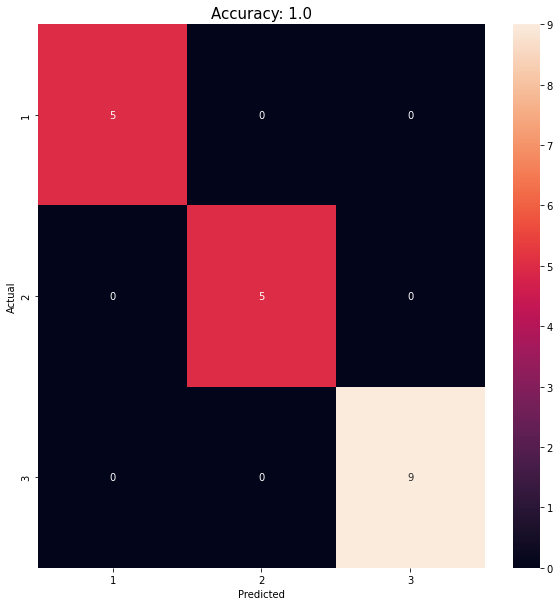

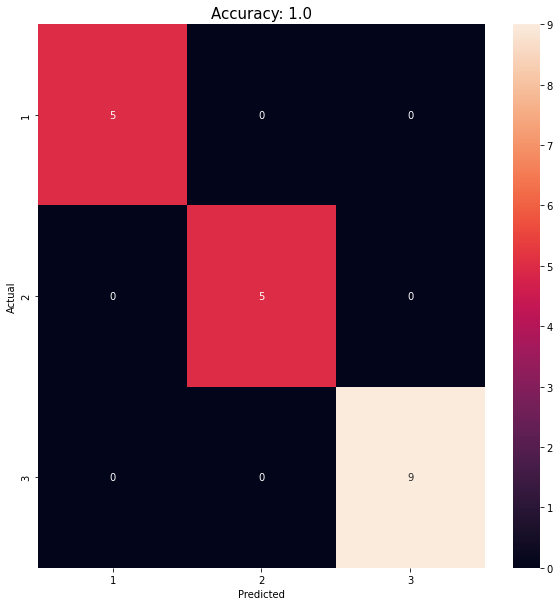

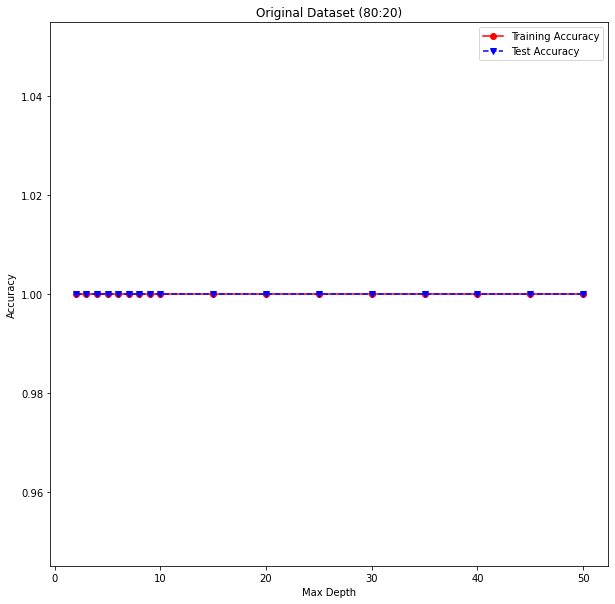

In [67]:
trainAcc, testAcc = useDecisionTree(X_B_og_train, X_B_og_test, Y_B_og_train, Y_B_og_test)
plotAccuracyGraph(xValue=maxDepths, trainAcc=trainAcc, testAcc=testAcc, xLabel='Max Depth', title=title_og[0])

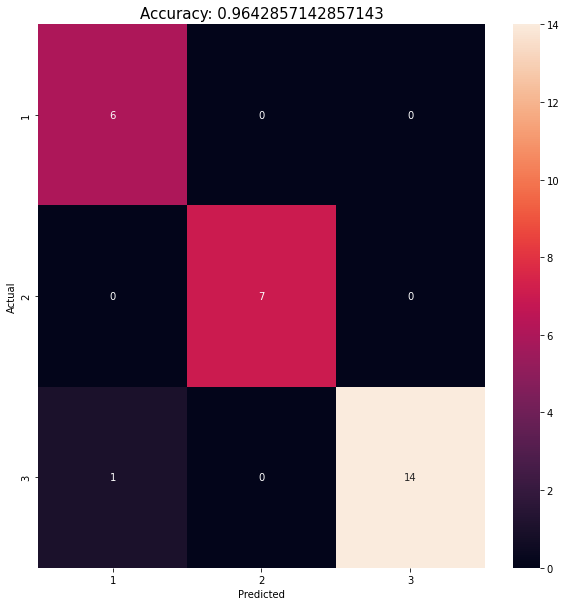

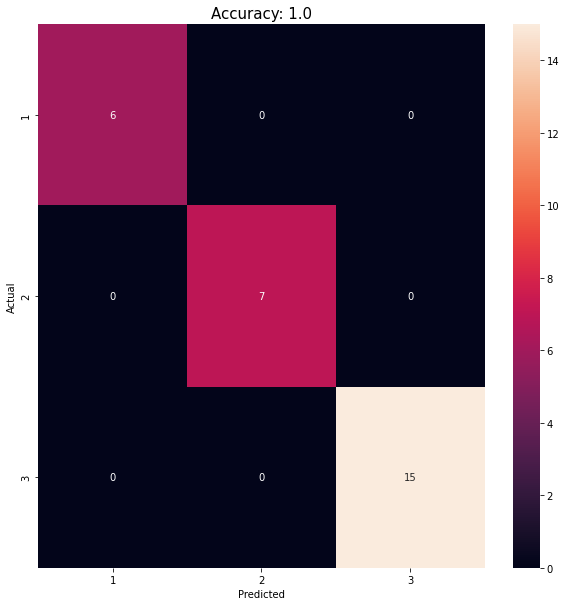

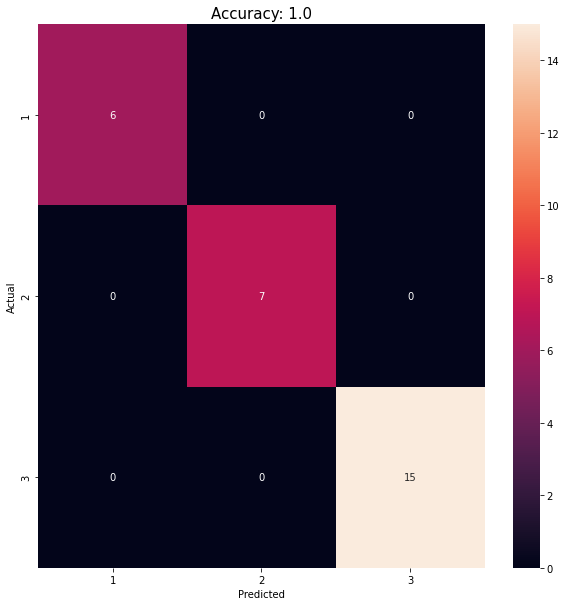

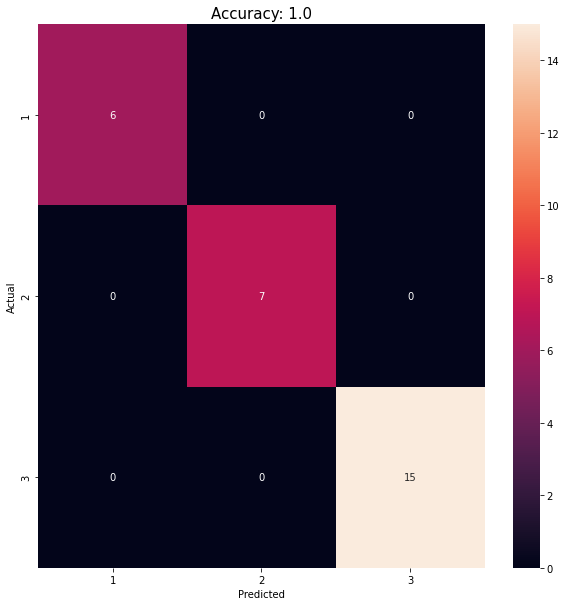

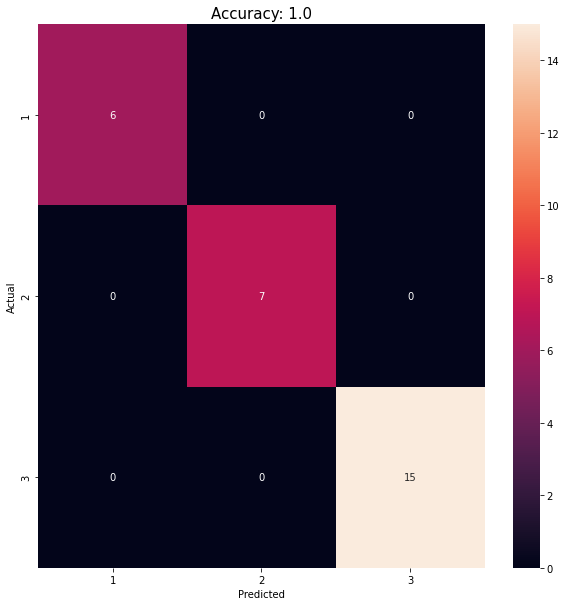

...

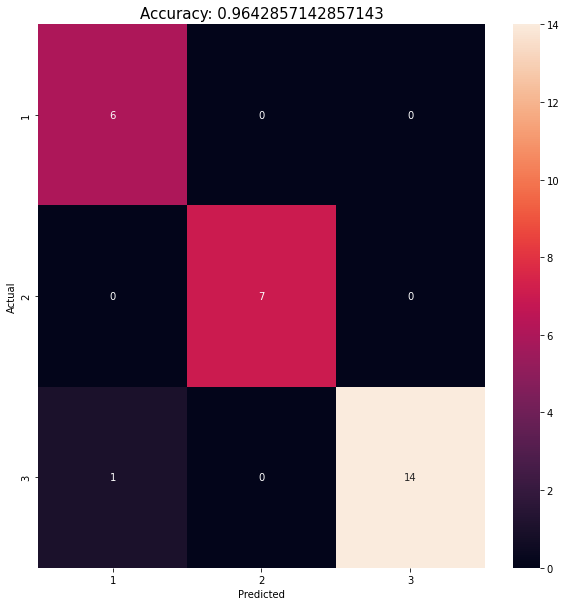

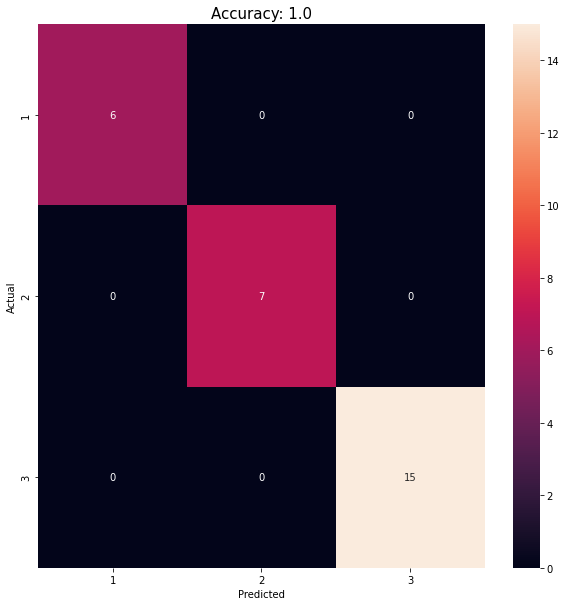

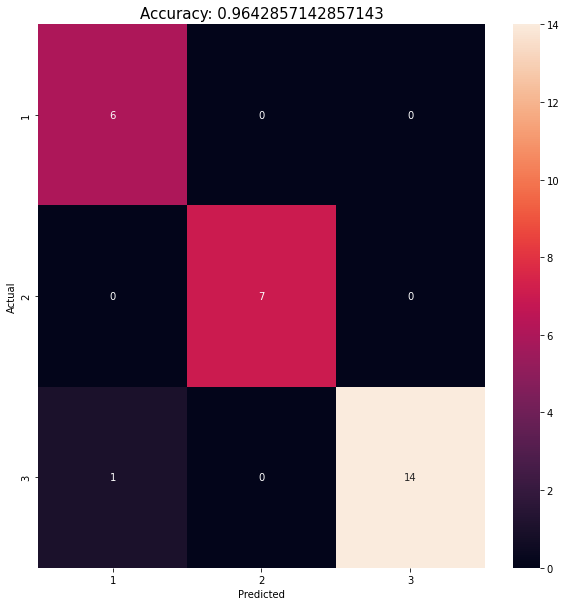

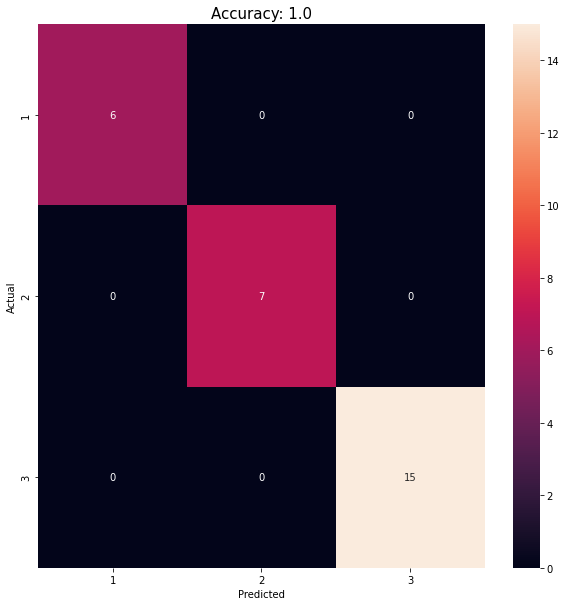

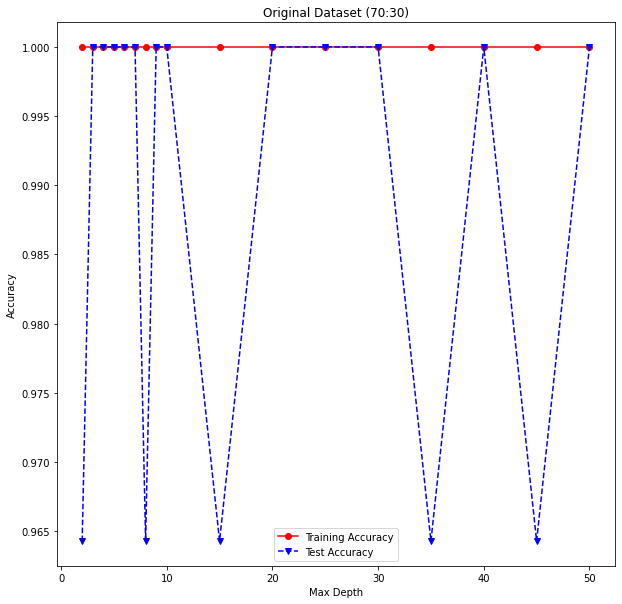

In [68]:
trainAcc, testAcc = useDecisionTree(X_B_og_train_2, X_B_og_test_2, Y_B_og_train_2, Y_B_og_test_2)
plotAccuracyGraph(xValue=maxDepths, trainAcc=trainAcc, testAcc=testAcc, xLabel='Max Depth', title=title_og[1])

#### __4.B.4. Logistic Regression__

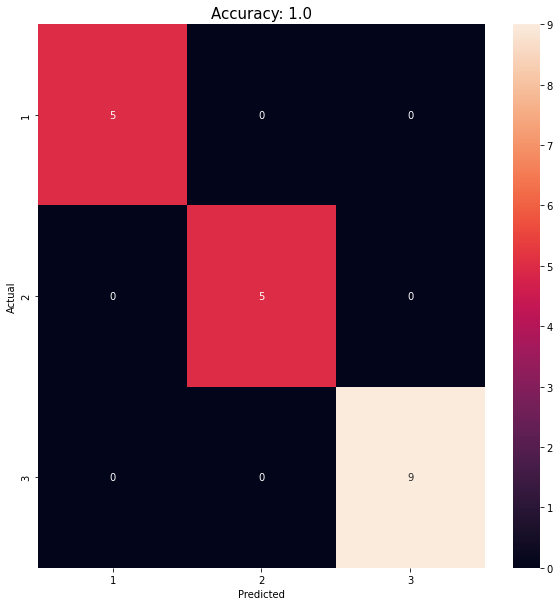

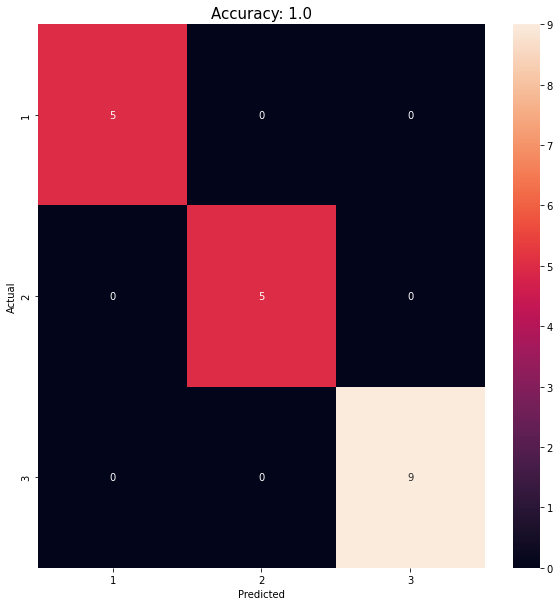

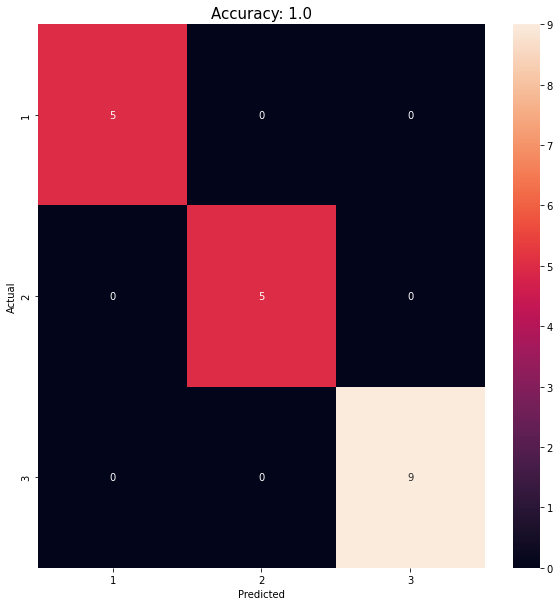

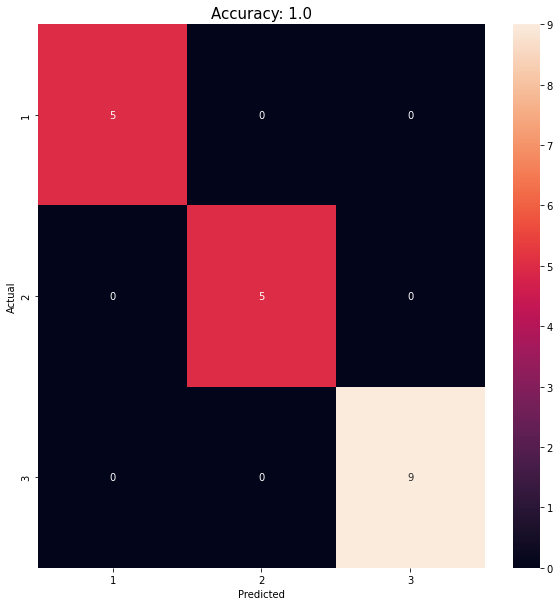

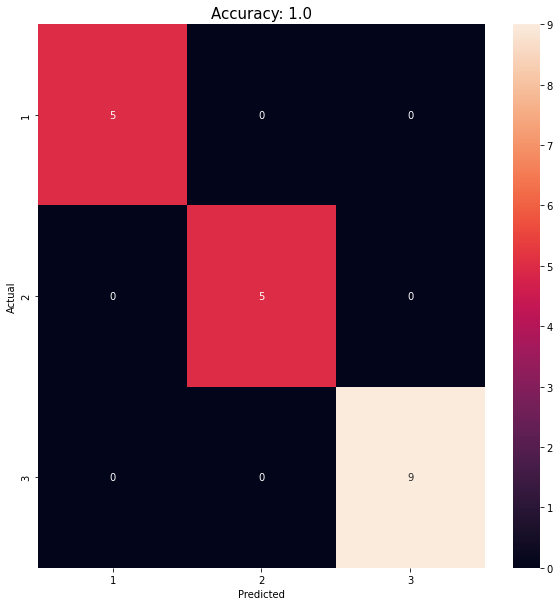

...

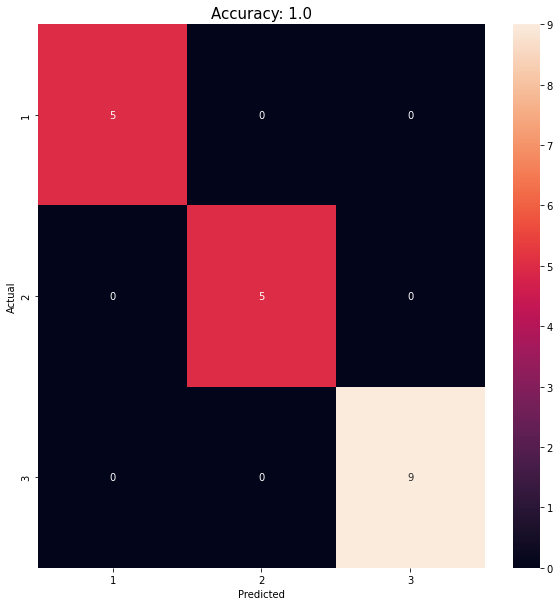

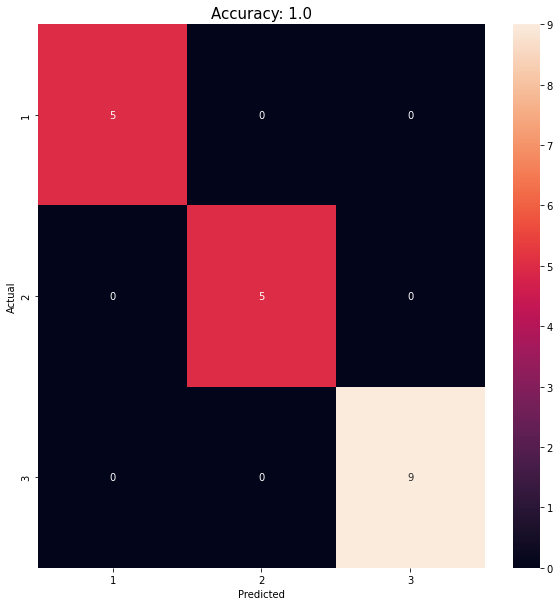

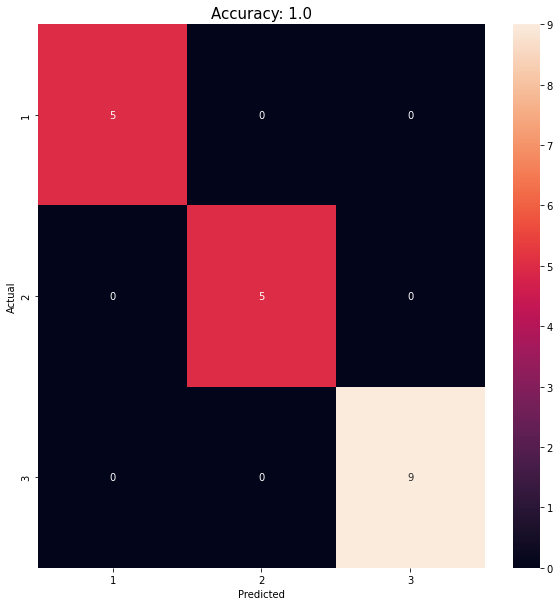

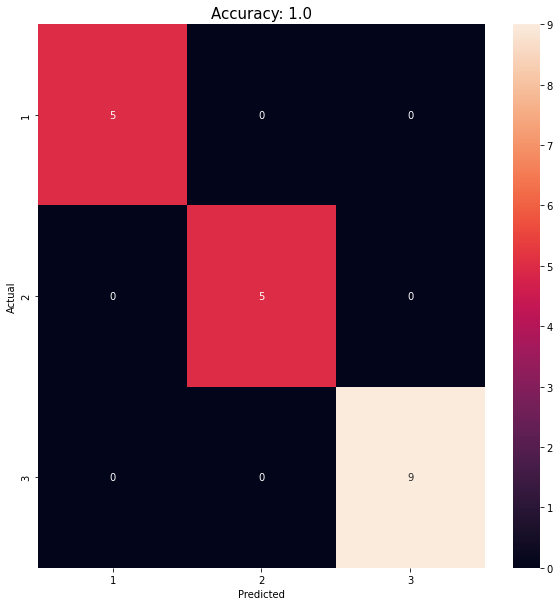

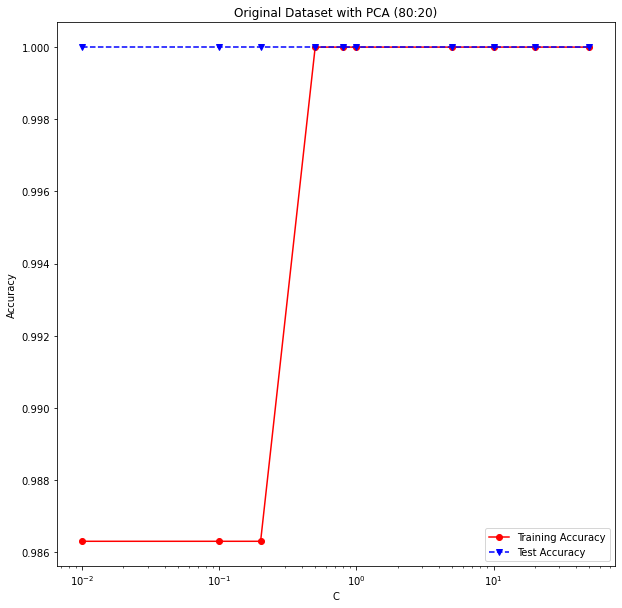

In [69]:
trainAcc, testAcc = useLogisticRegession(X_B_train, X_B_test, Y_B_train, Y_B_test)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[0])

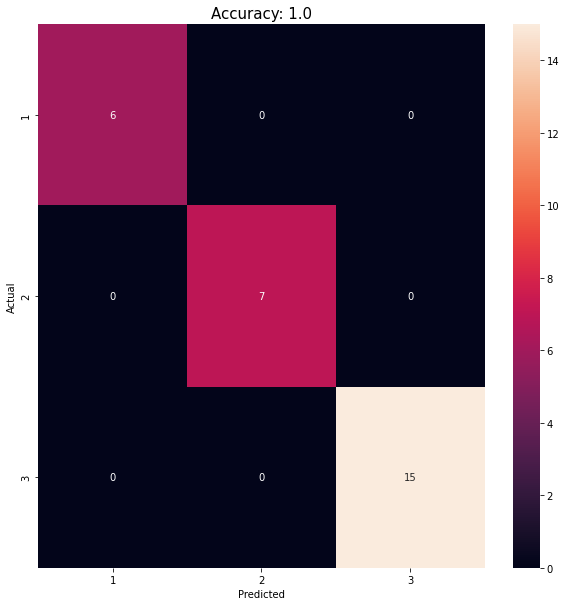

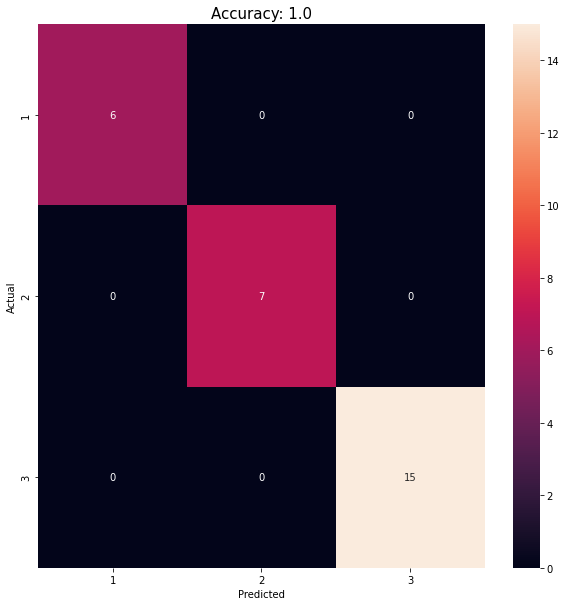

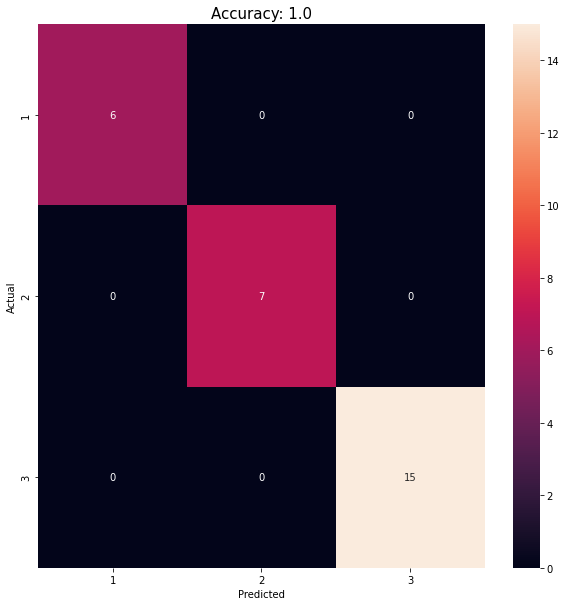

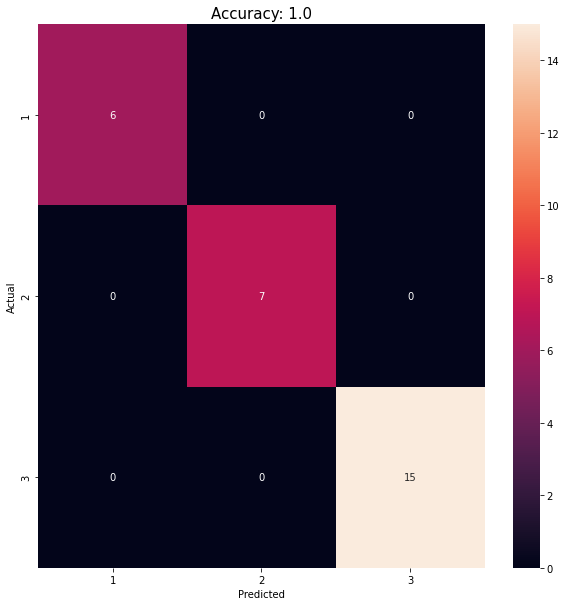

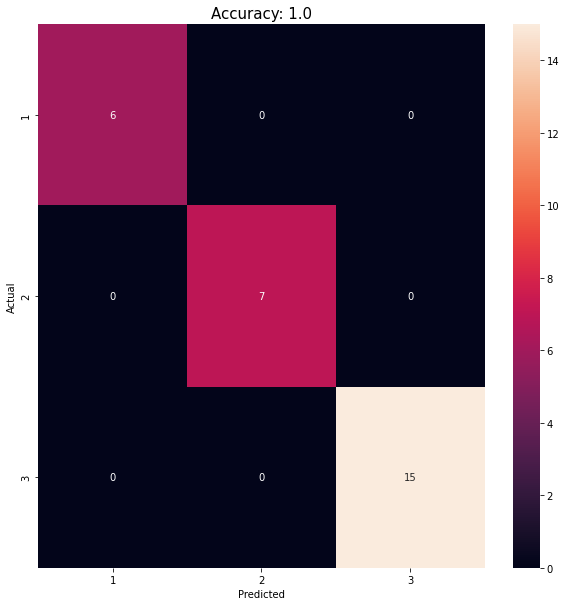

...

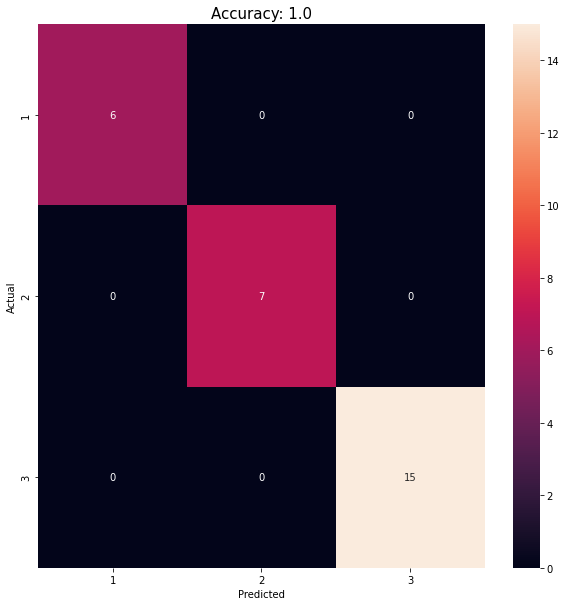

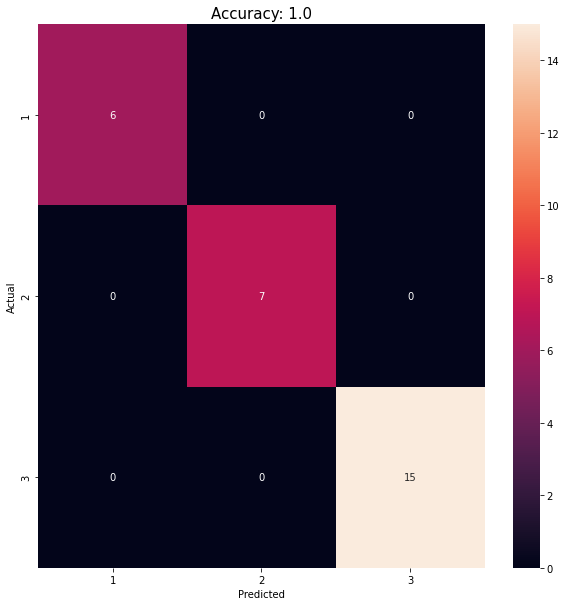

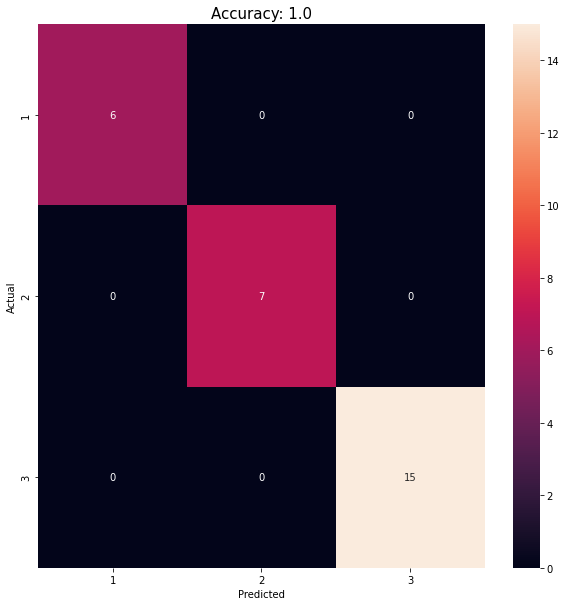

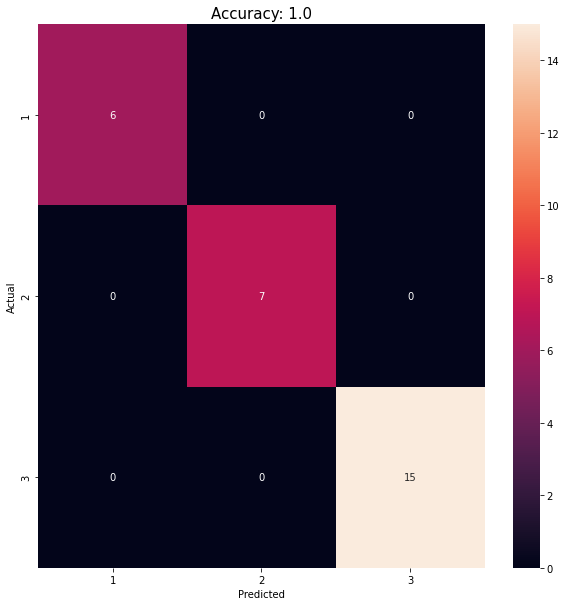

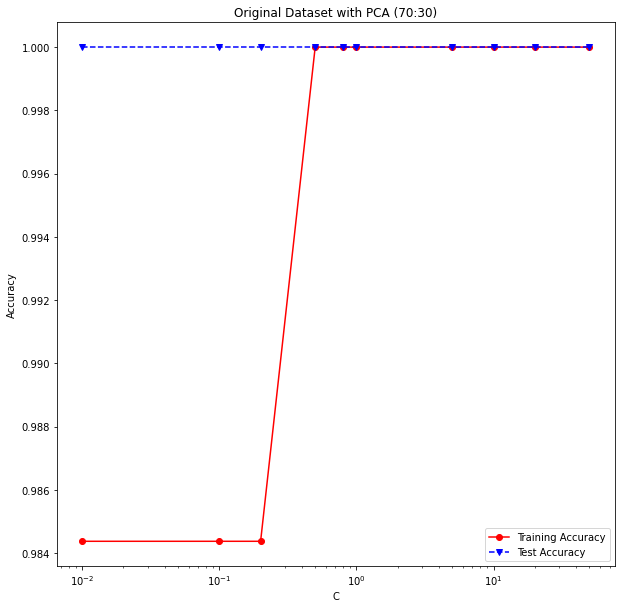

In [70]:
trainAcc, testAcc = useLogisticRegession(X_B_train_2, X_B_test_2, Y_B_train_2, Y_B_test_2)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[1])

#### __4.B.X. Neural Network__

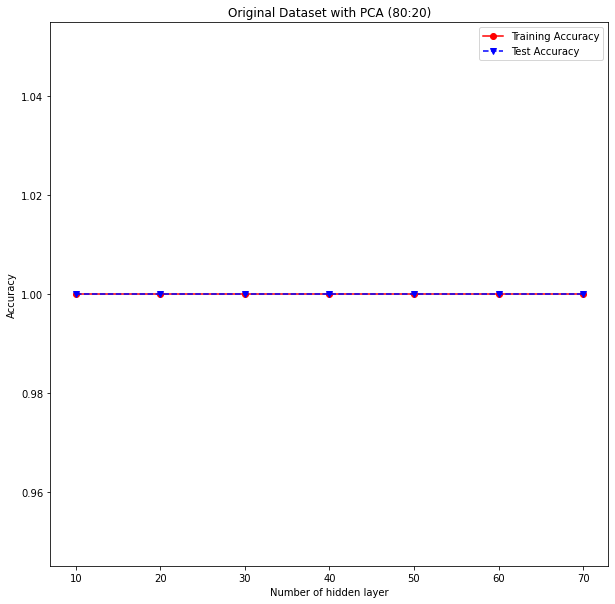

In [71]:
trainAcc, testAcc = useNN(X_B_train, X_B_test, Y_B_train, Y_B_test)
plotAccuracyGraph(xValue=hidden_layer_size, trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of hidden layer', title=title[0])

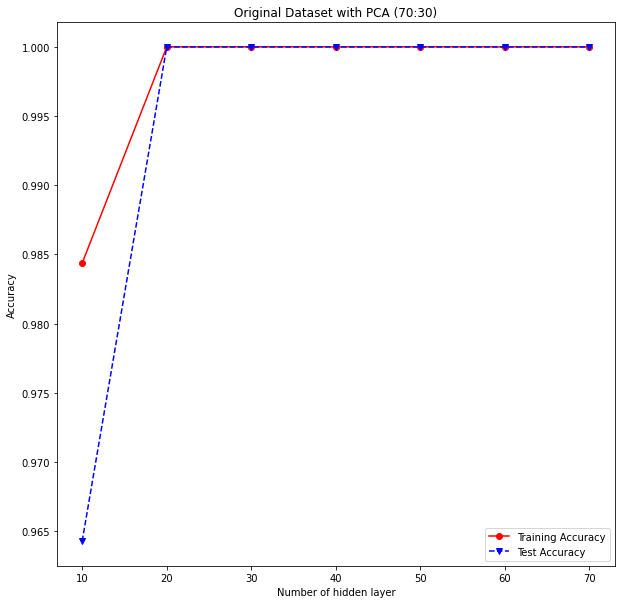

In [72]:
trainAcc, testAcc = useNN(X_B_train_2, X_B_test_2, Y_B_train_2, Y_B_test_2)
plotAccuracyGraph(xValue=hidden_layer_size, trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of hidden layer', title=title[1])

### __4.C__

#### __4.C.1.KNN__

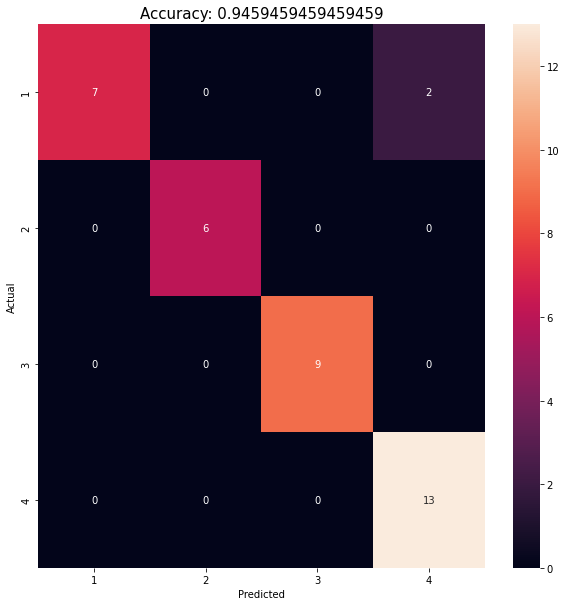

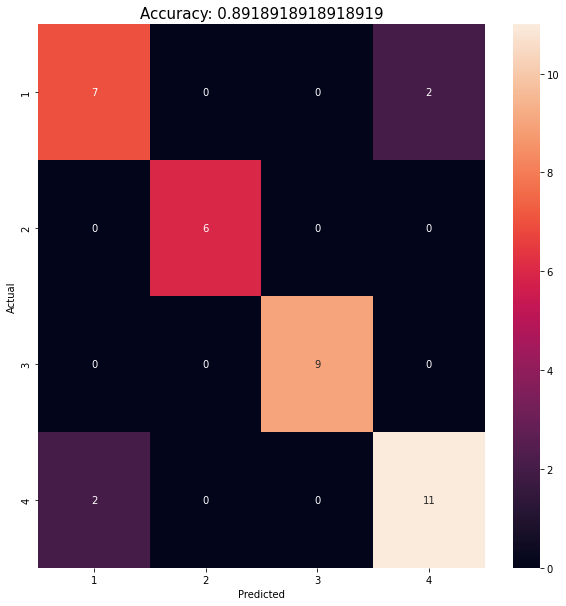

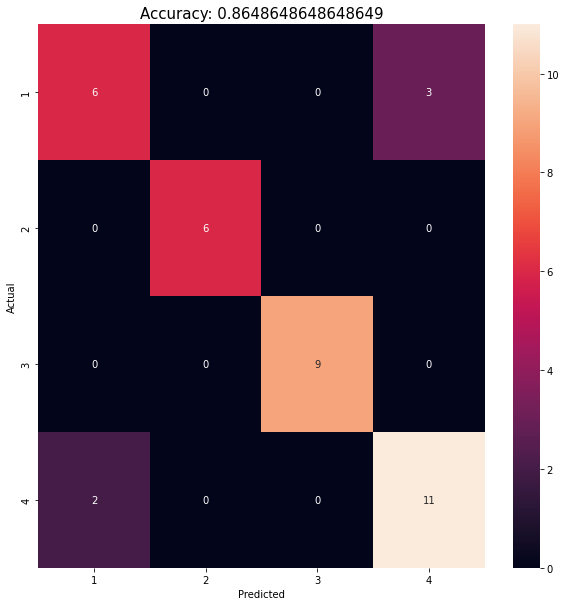

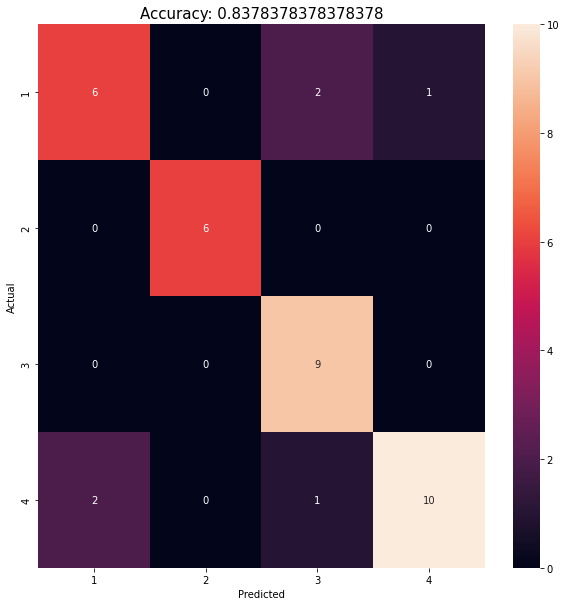

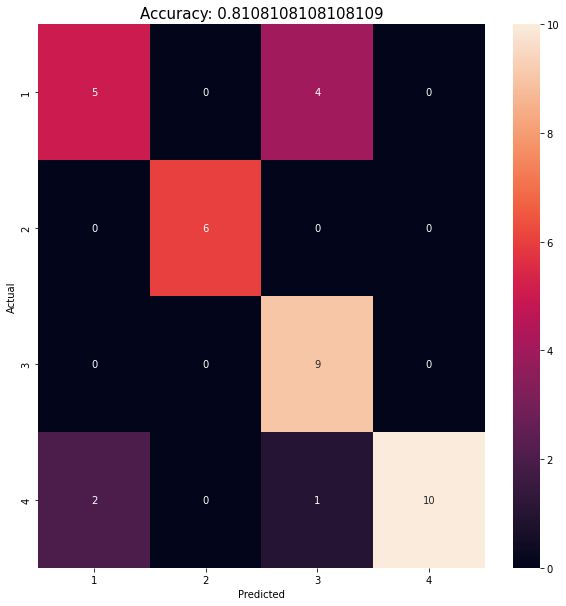

...

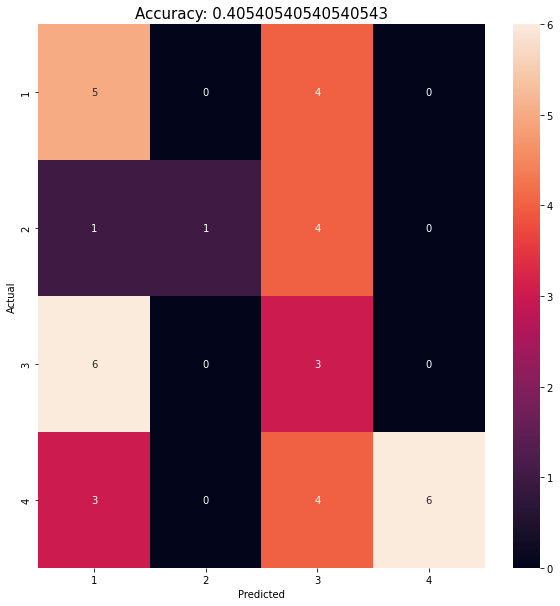

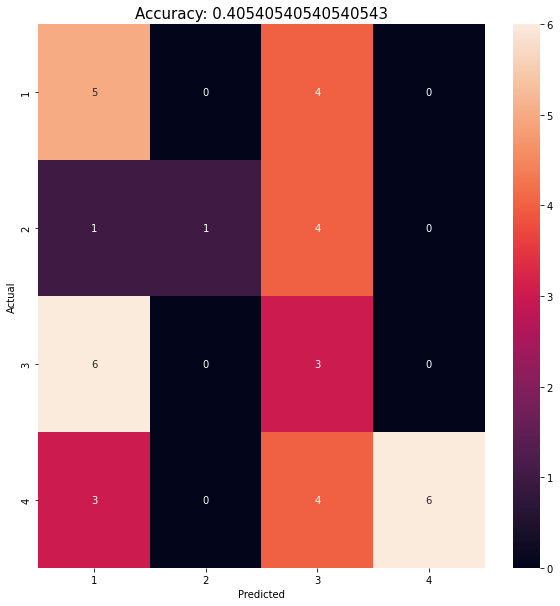

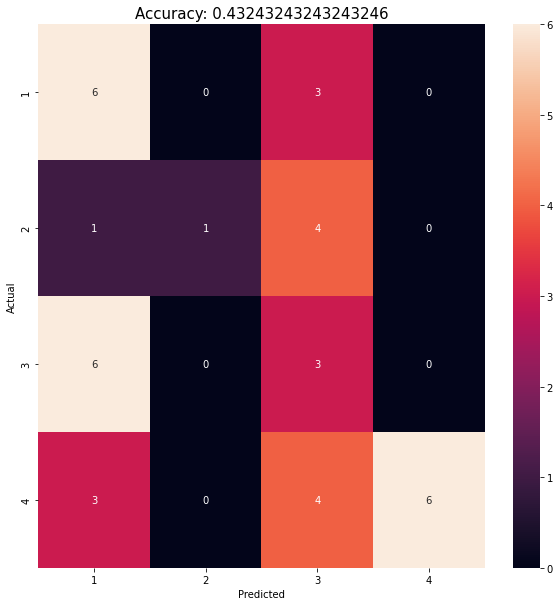

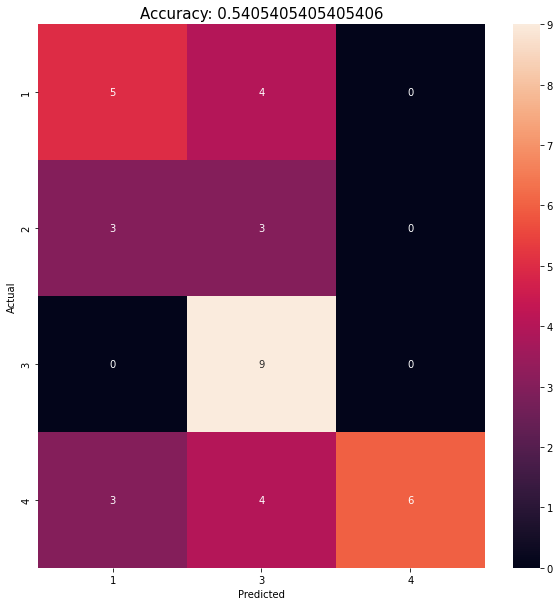

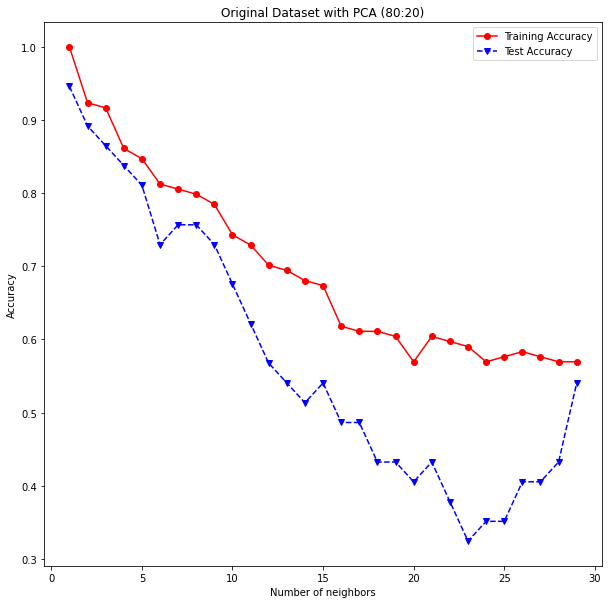

In [73]:
trainAcc, testAcc = useKNN(X_C_train, X_C_test, Y_C_train, Y_C_test)
plotAccuracyGraph(xValue=range(1,30), trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of neighbors', title=title[0])

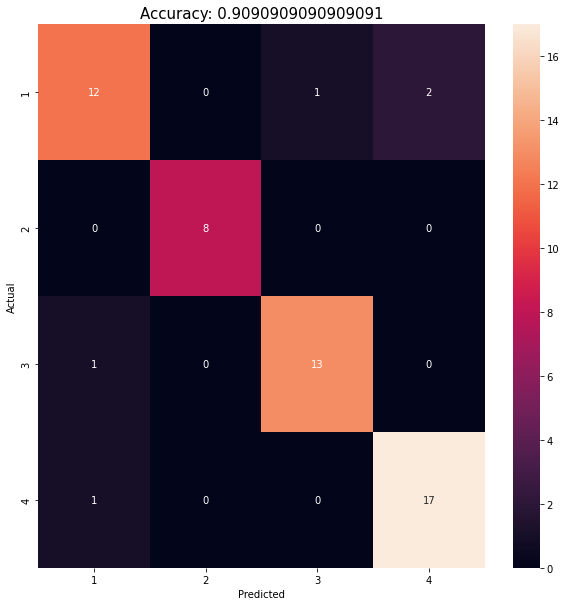

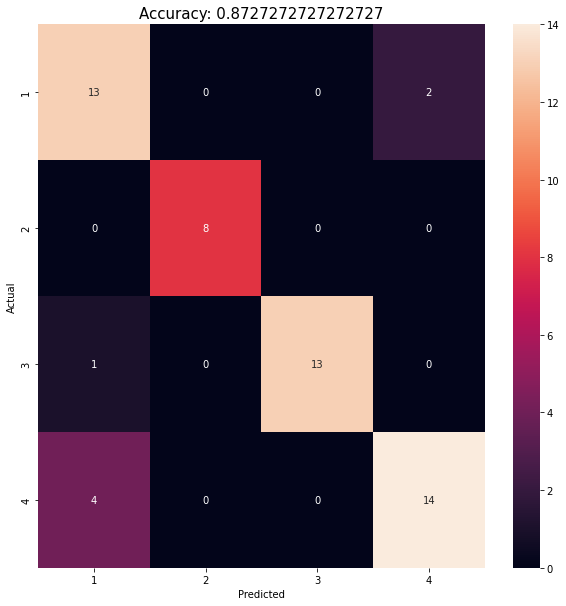

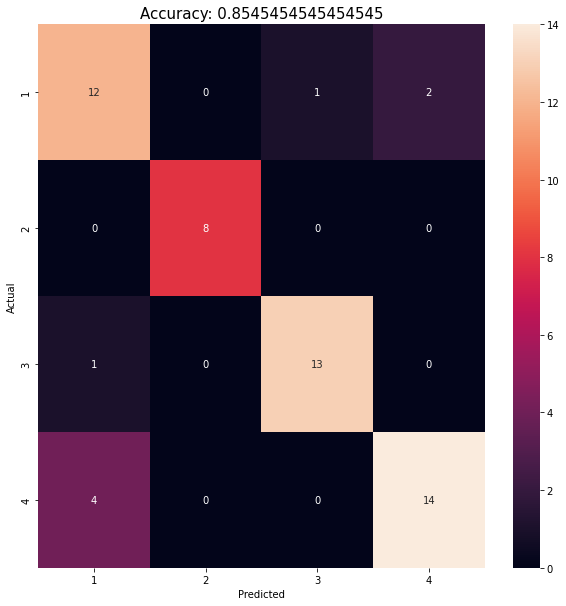

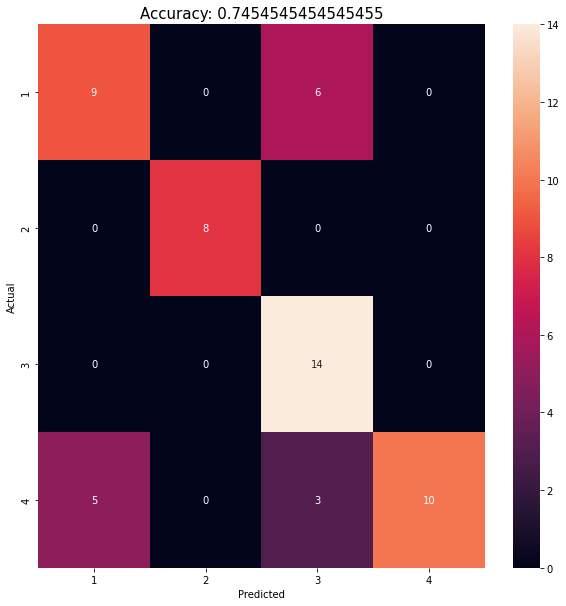

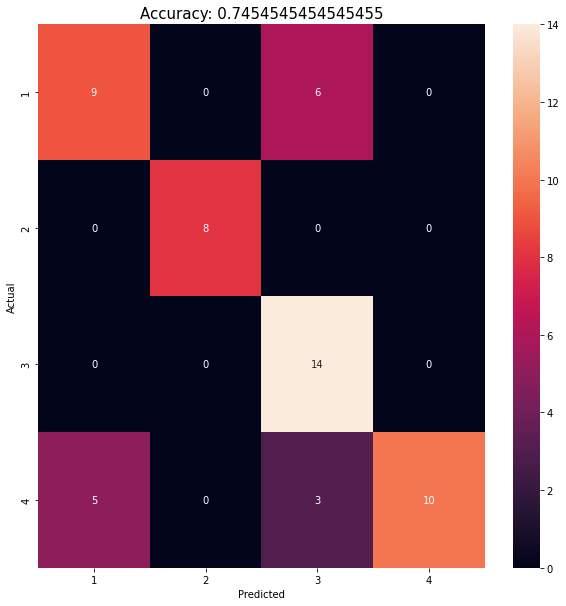

...

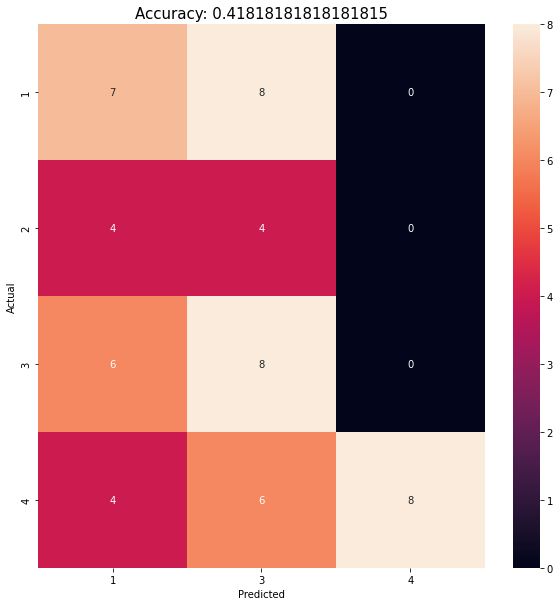

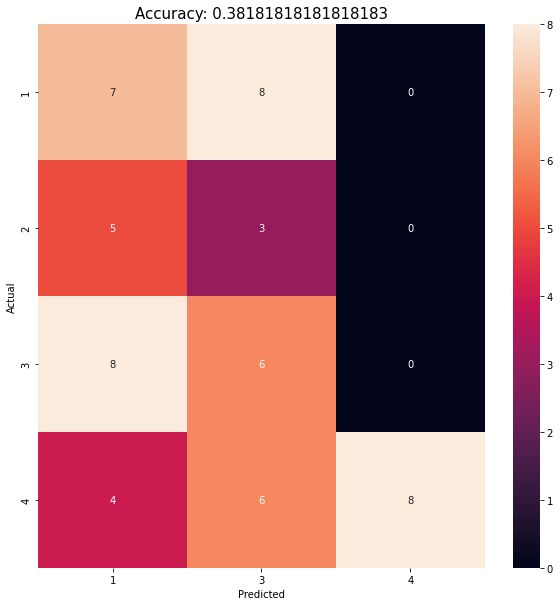

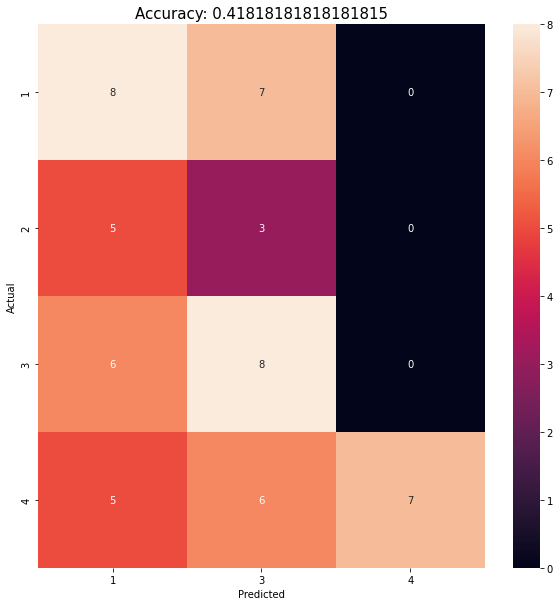

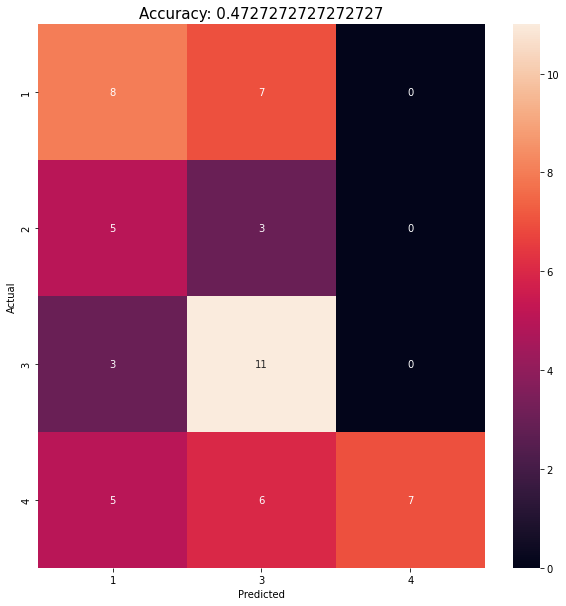

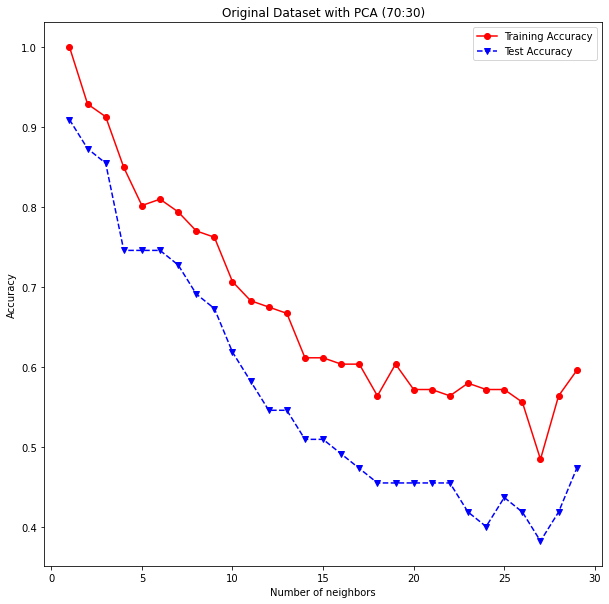

In [74]:
trainAcc, testAcc = useKNN(X_C_train_2, X_C_test_2, Y_C_train_2, Y_C_test_2)
plotAccuracyGraph(xValue=range(1,30), trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of neighbors', title=title[1])

#### __4.C.2.Naive Bayes__

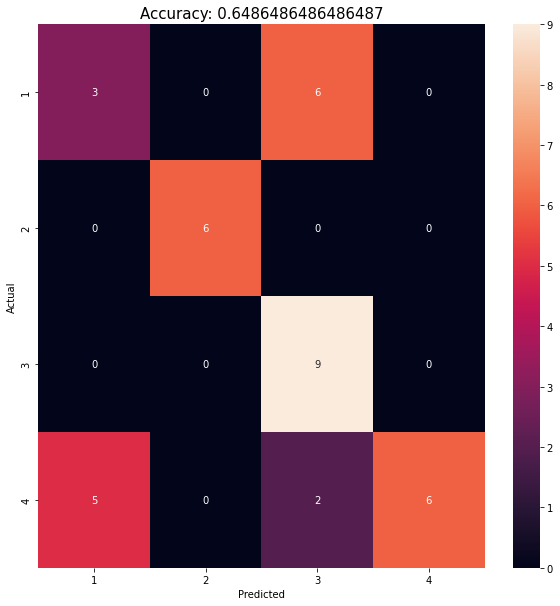

Original Dataset (80:20): Train accuracy: 0.6597222222222222, Test accuracy: 0.6486486486486487


In [75]:
trainAcc, testAcc = useGaussianNaiveBayes(X_C_og_train, X_C_og_test, Y_C_og_train, Y_C_og_test)
print(f"{title_og[0]}: Train accuracy: {trainAcc}, Test accuracy: {testAcc}")

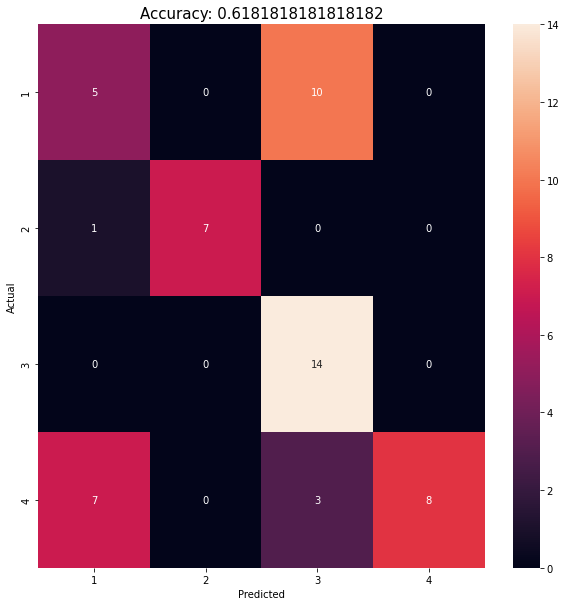

Original Dataset (70:30): Train accuracy: 0.6746031746031746, Test accuracy: 0.6181818181818182


In [76]:
trainAcc, testAcc = useGaussianNaiveBayes(X_C_og_train_2, X_C_og_test_2, Y_C_og_train_2, Y_C_og_test_2)
print(f"{title_og[1]}: Train accuracy: {trainAcc}, Test accuracy: {testAcc}")

#### __4.C.3.Decision Tree__

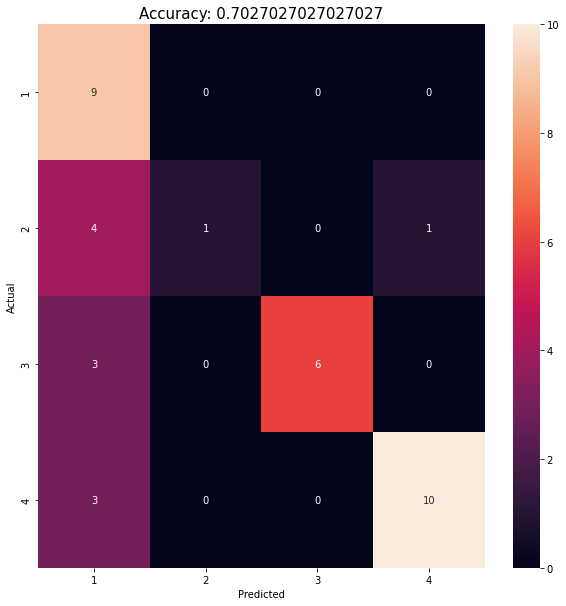

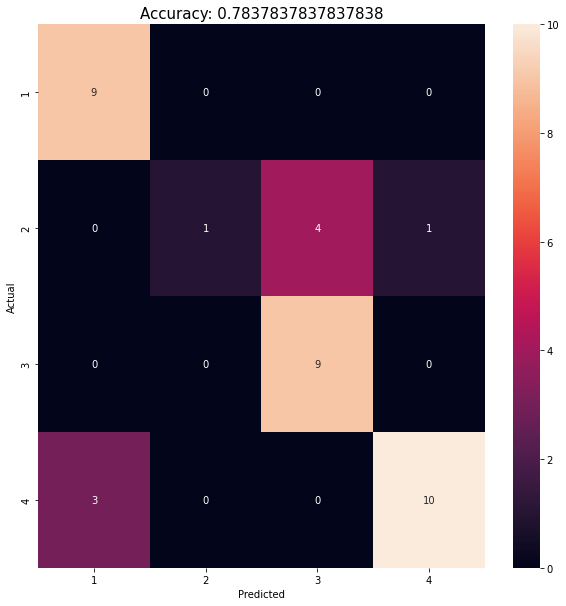

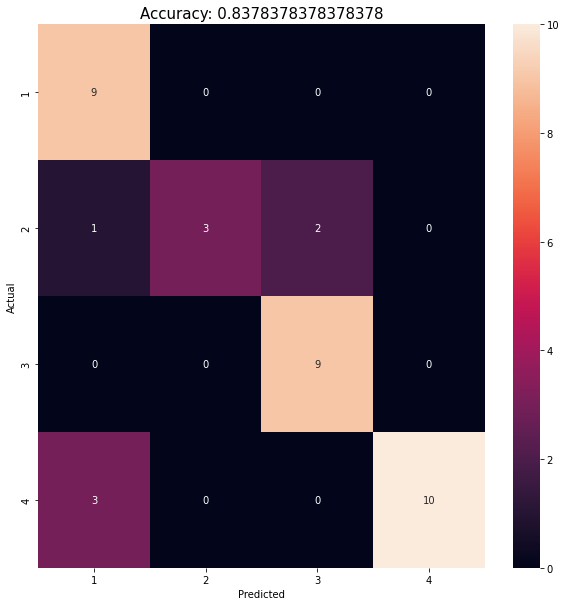

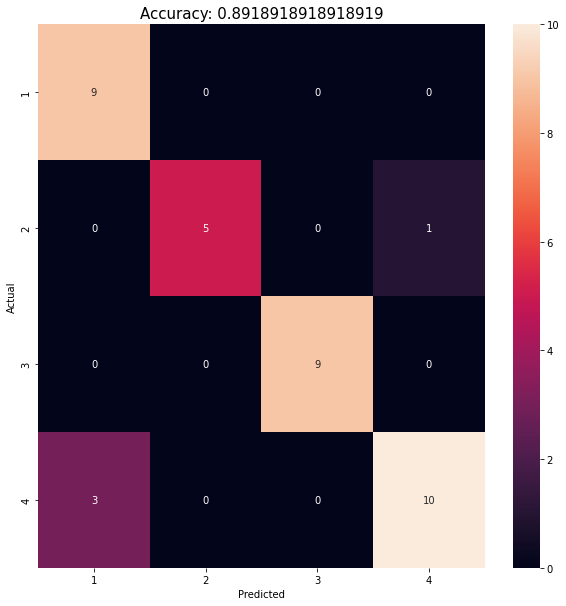

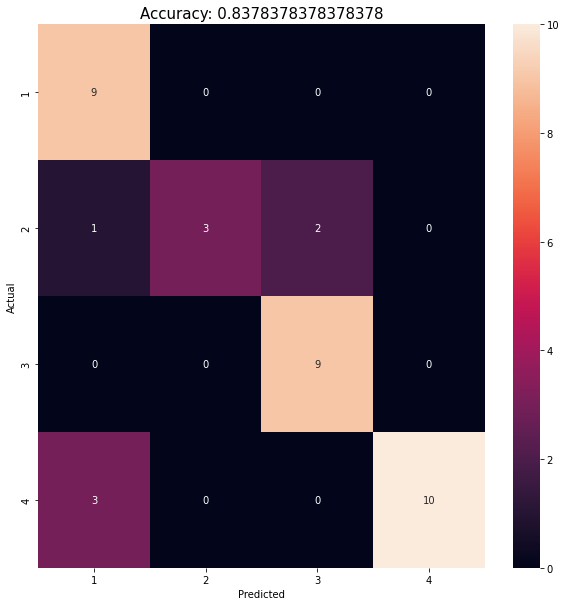

...

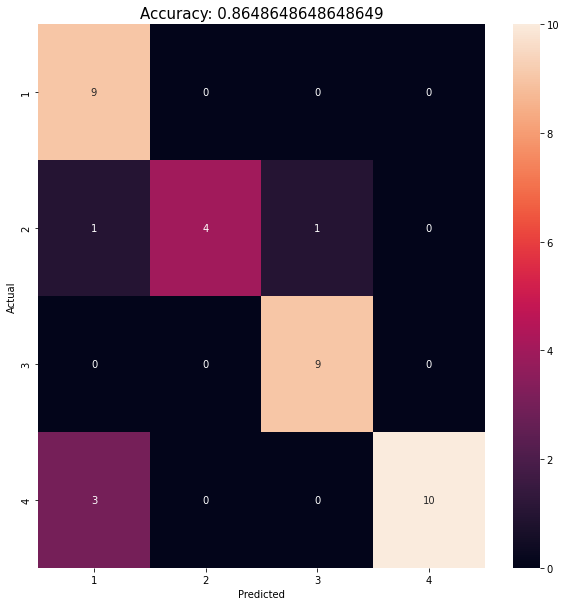

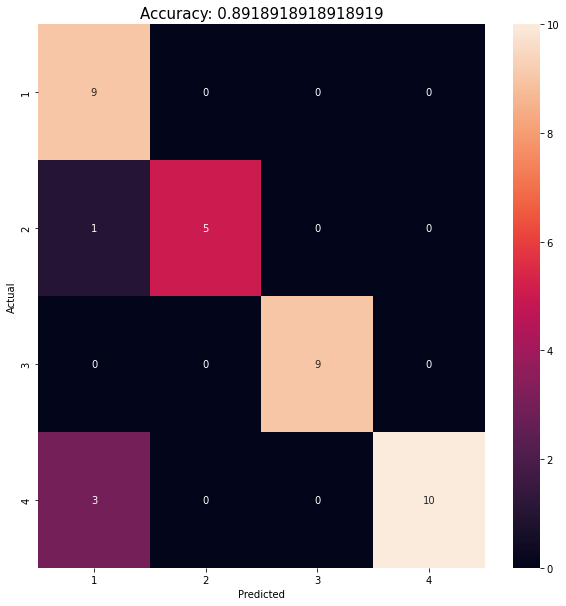

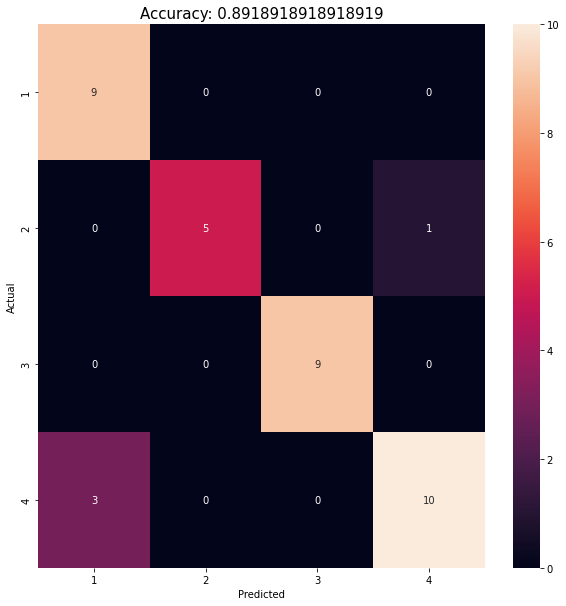

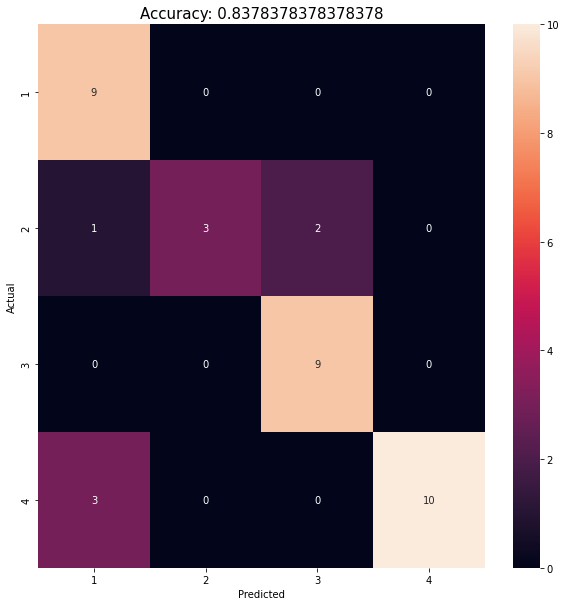

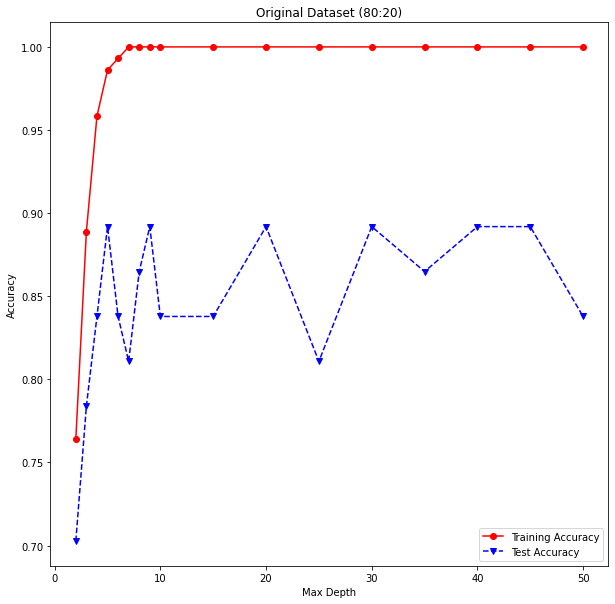

In [77]:
trainAcc, testAcc = useDecisionTree(X_C_og_train, X_C_og_test, Y_C_og_train, Y_C_og_test)
plotAccuracyGraph(xValue=maxDepths, trainAcc=trainAcc, testAcc=testAcc, xLabel='Max Depth', title=title_og[0])

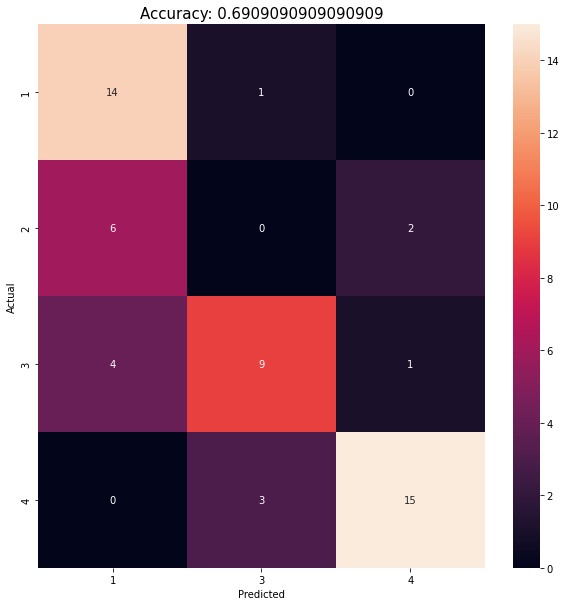

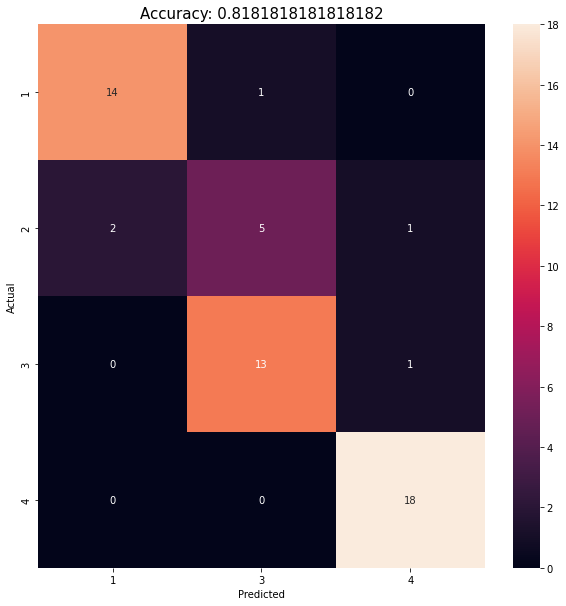

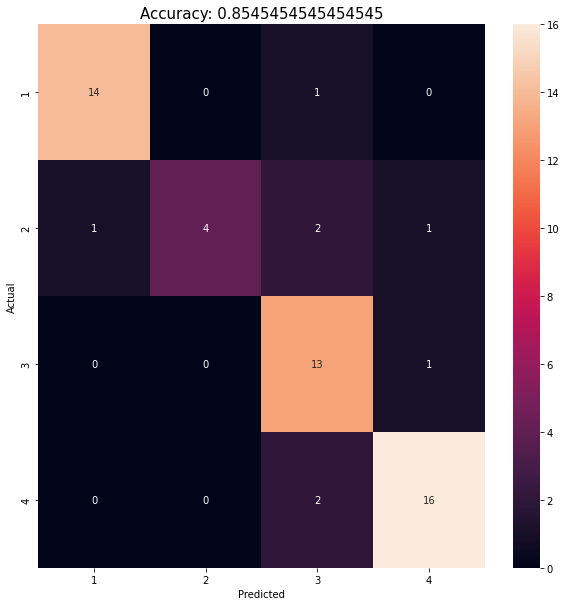

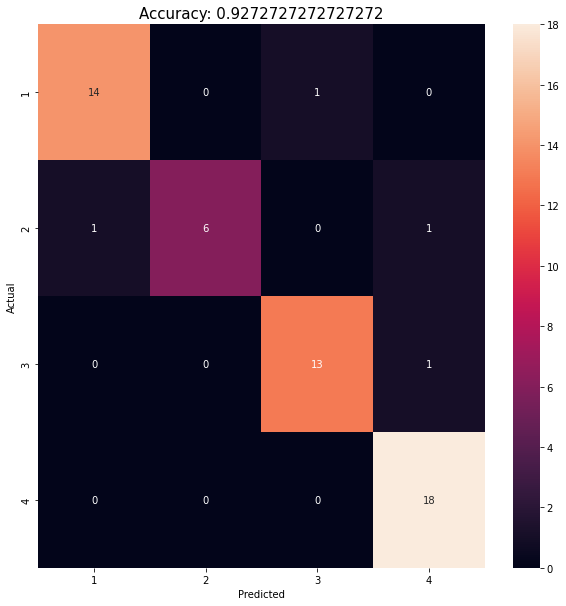

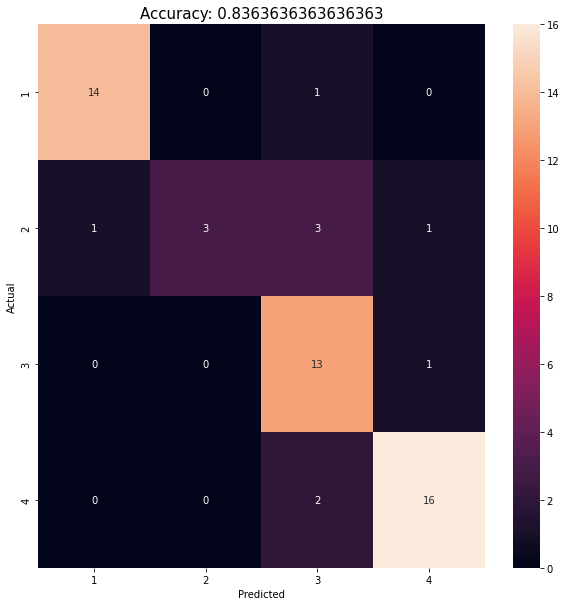

...

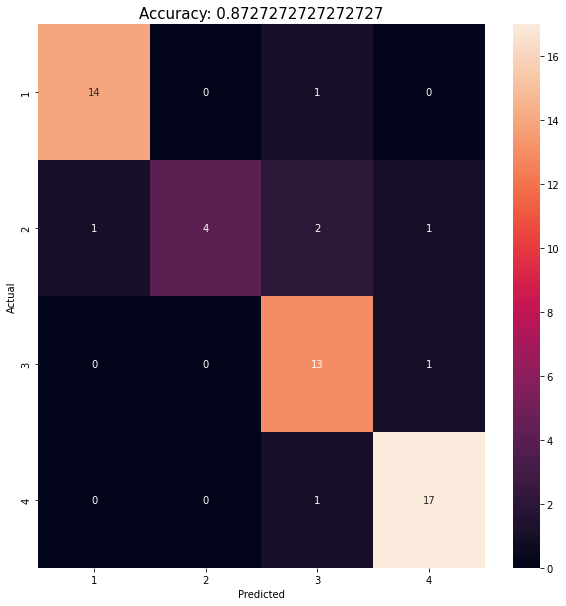

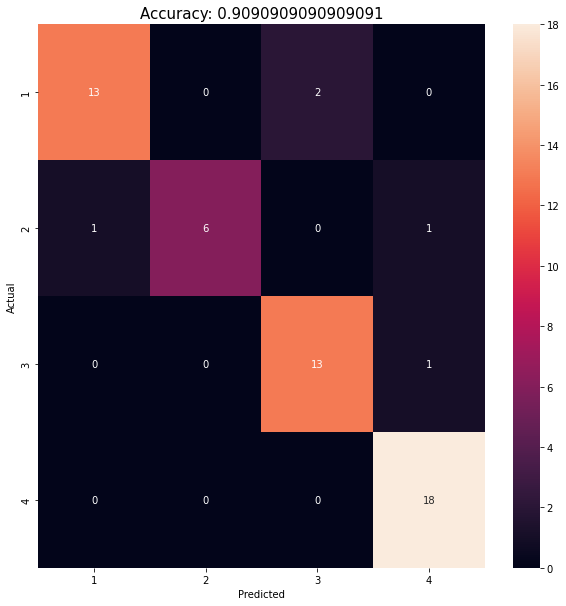

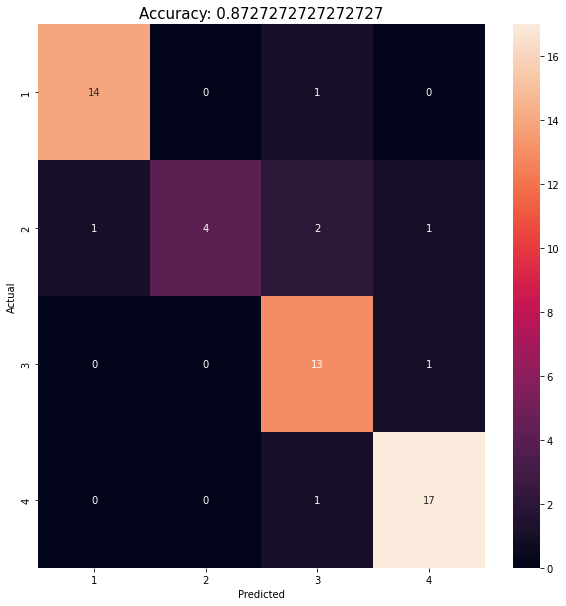

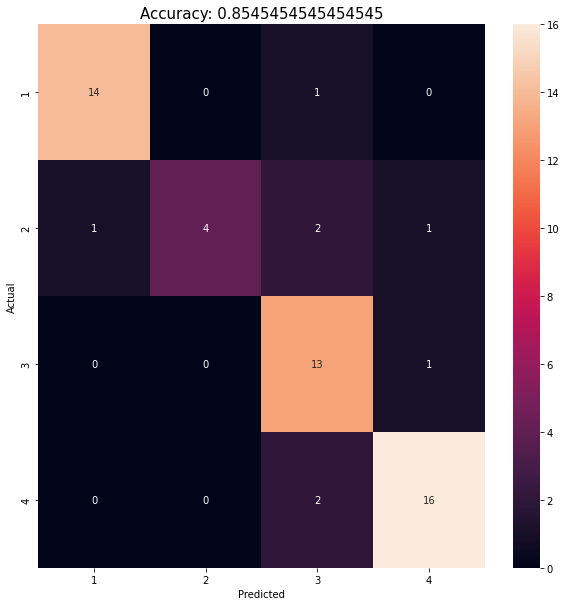

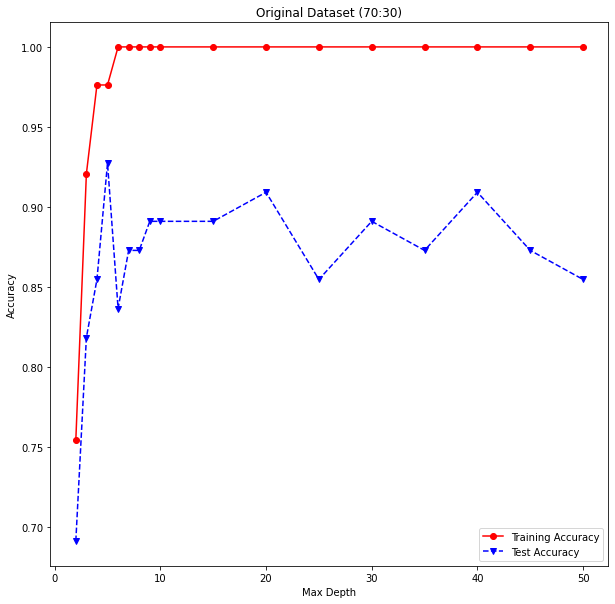

In [78]:
trainAcc, testAcc = useDecisionTree(X_C_og_train_2, X_C_og_test_2, Y_C_og_train_2, Y_C_og_test_2)
plotAccuracyGraph(xValue=maxDepths, trainAcc=trainAcc, testAcc=testAcc, xLabel='Max Depth', title=title_og[1])

#### __4.C.4. Logistic Regression__

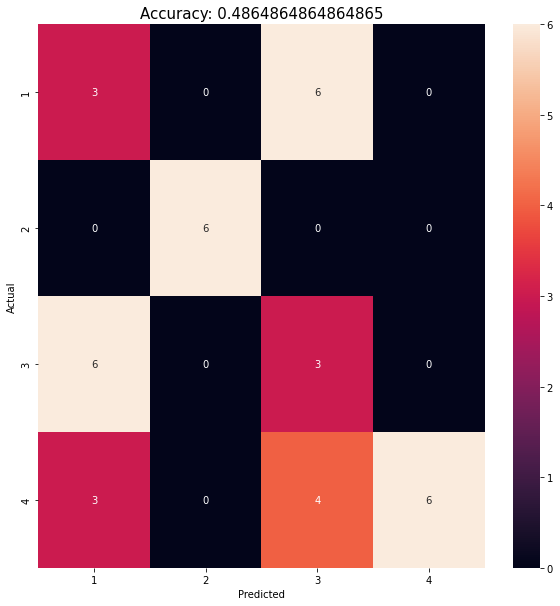

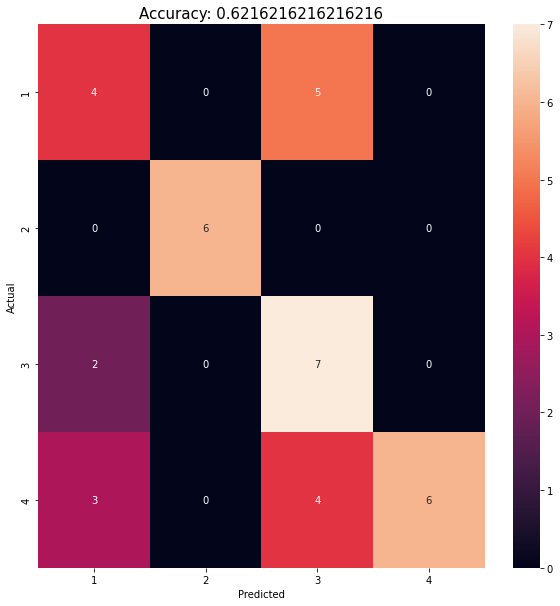

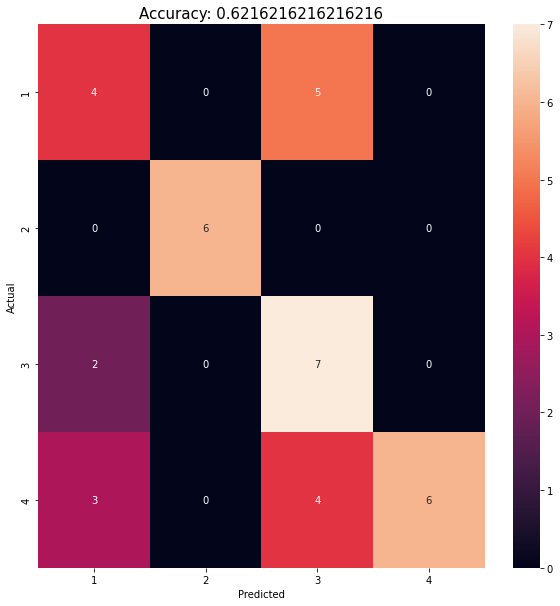

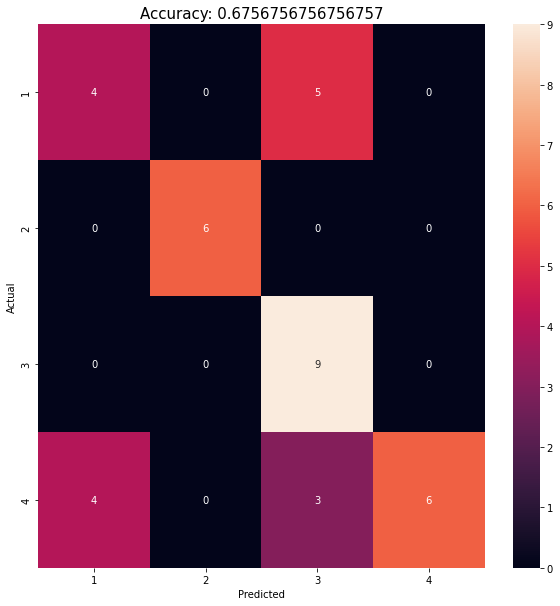

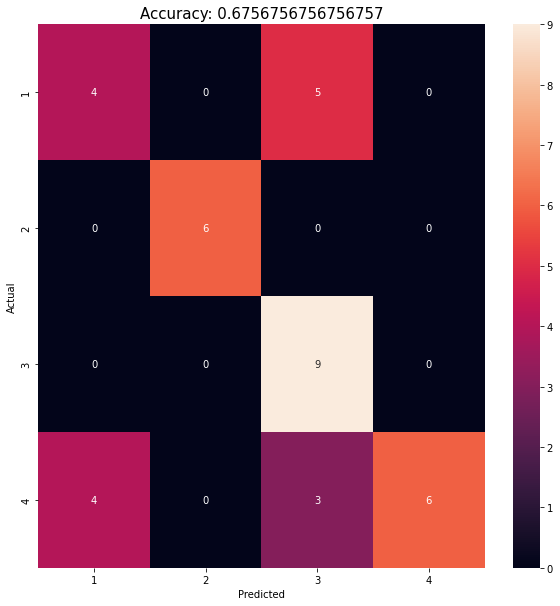

...

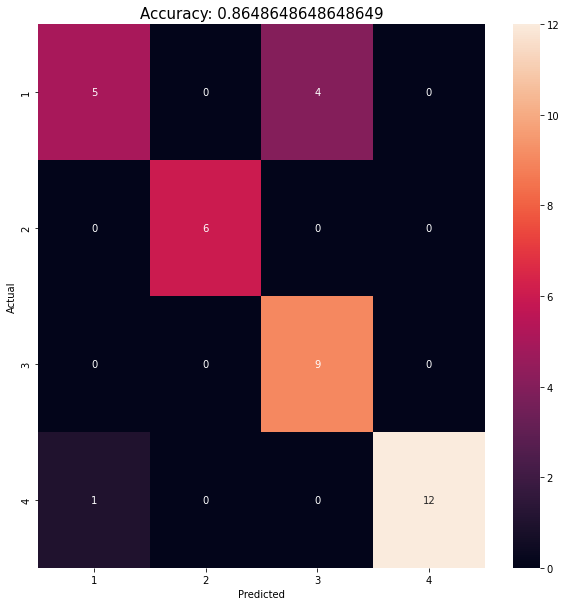

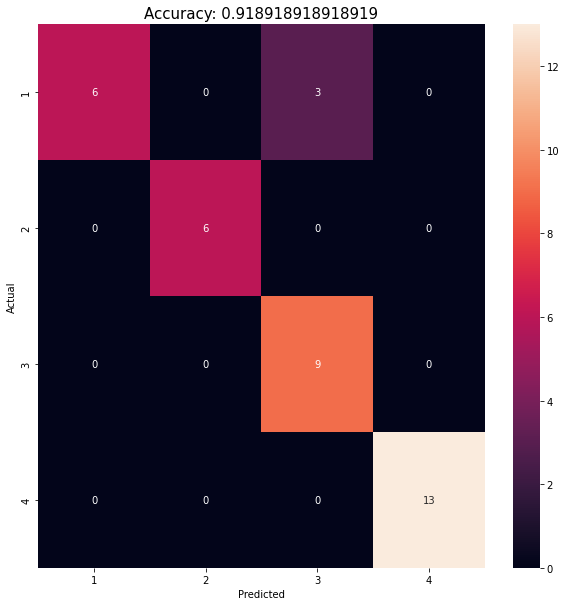

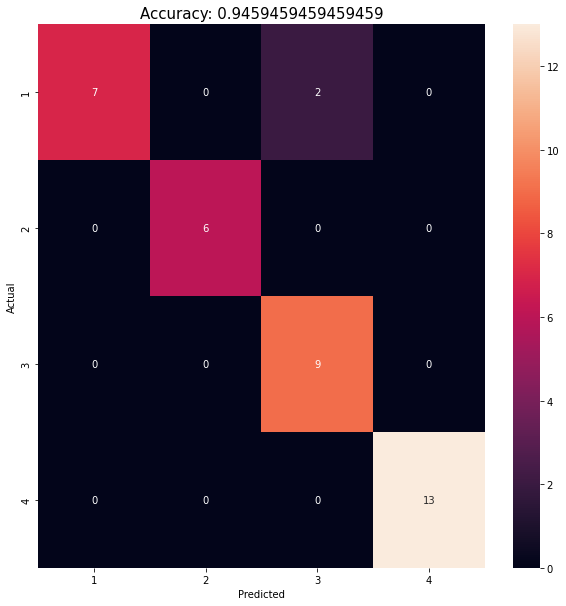

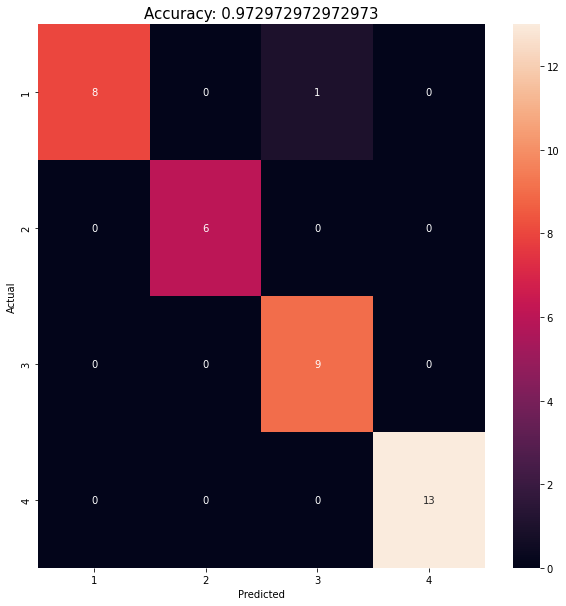

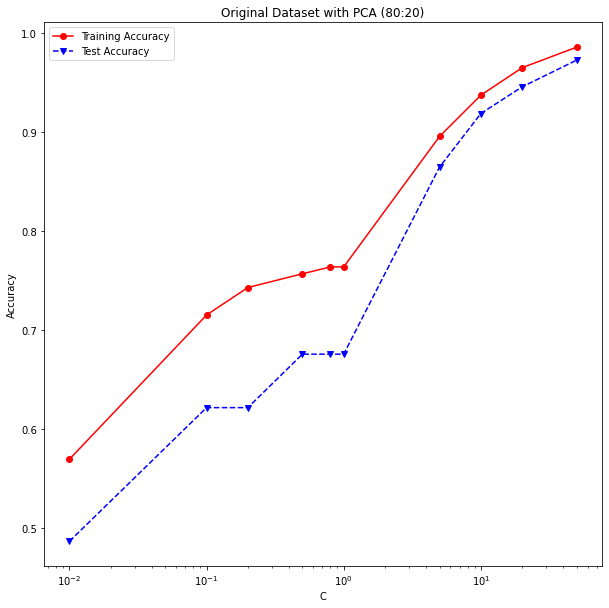

In [79]:
trainAcc, testAcc = useLogisticRegession(X_C_train, X_C_test, Y_C_train, Y_C_test)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[0])

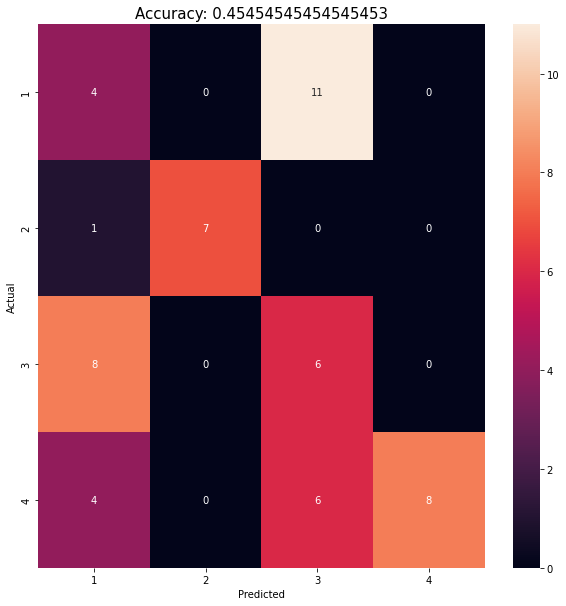

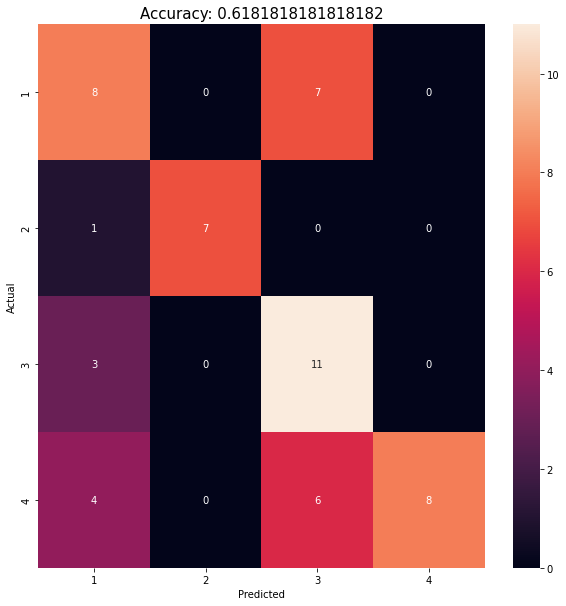

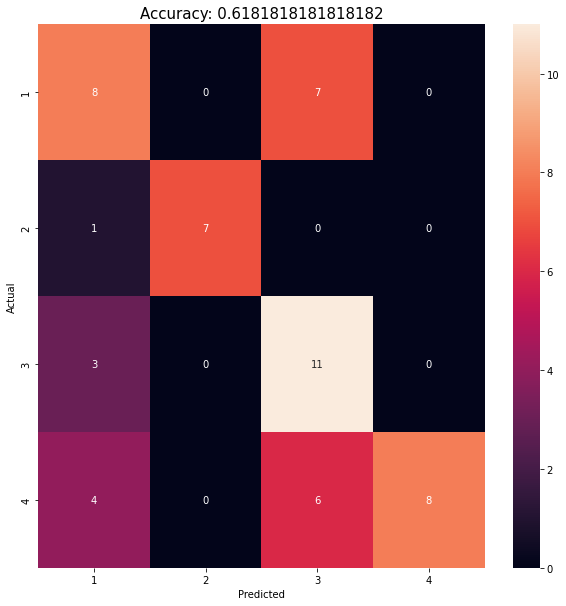

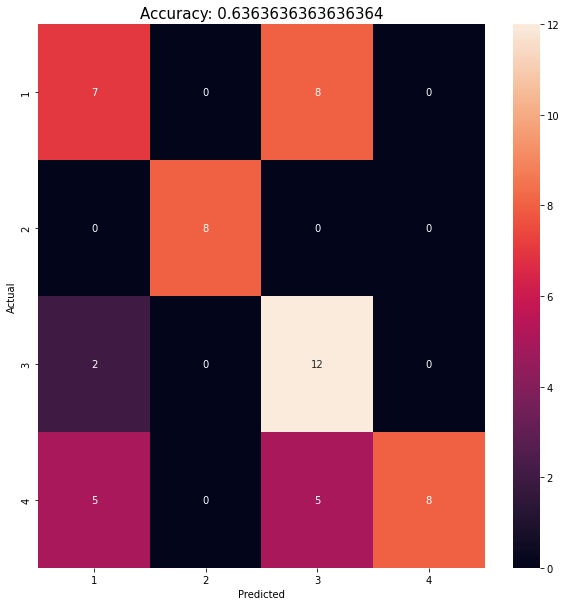

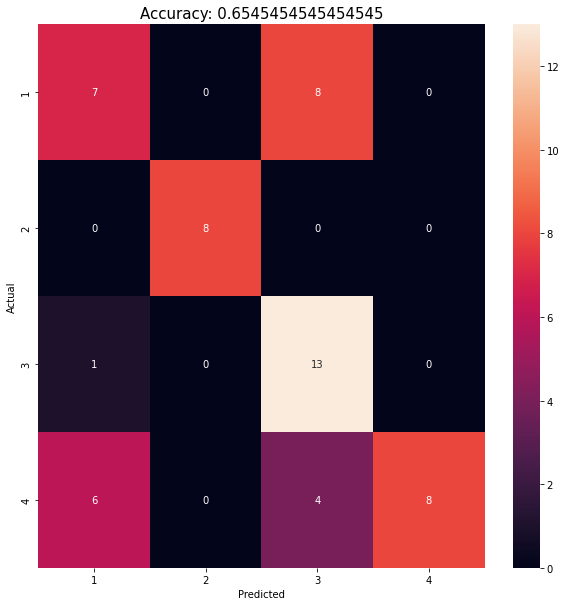

...

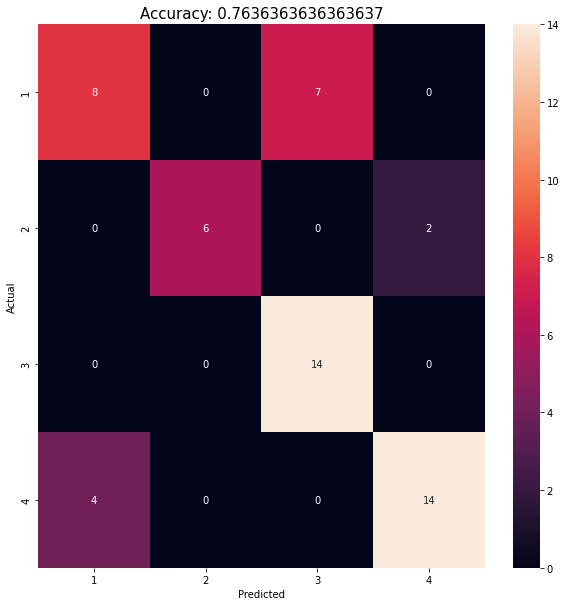

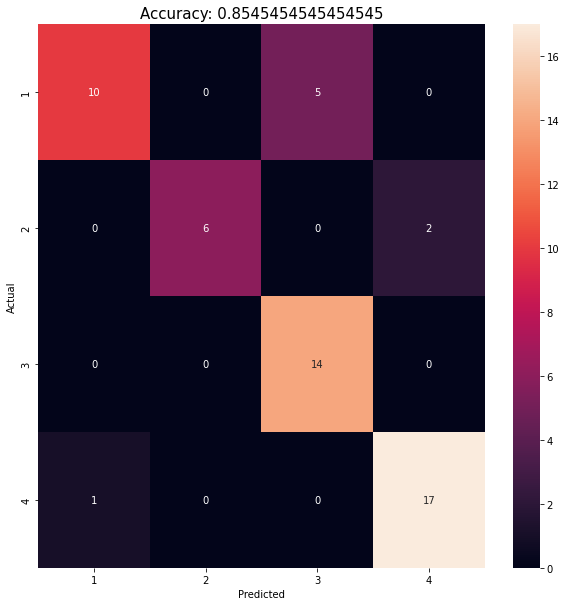

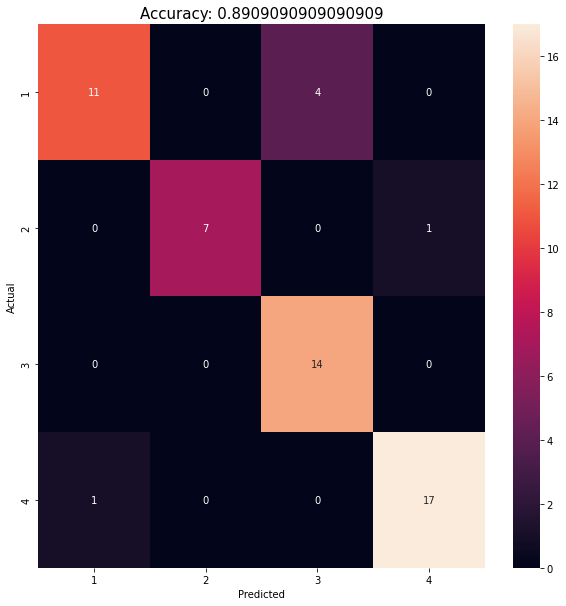

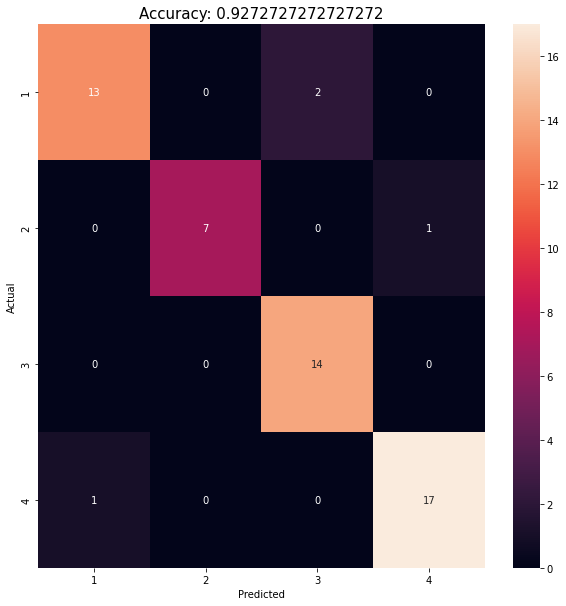

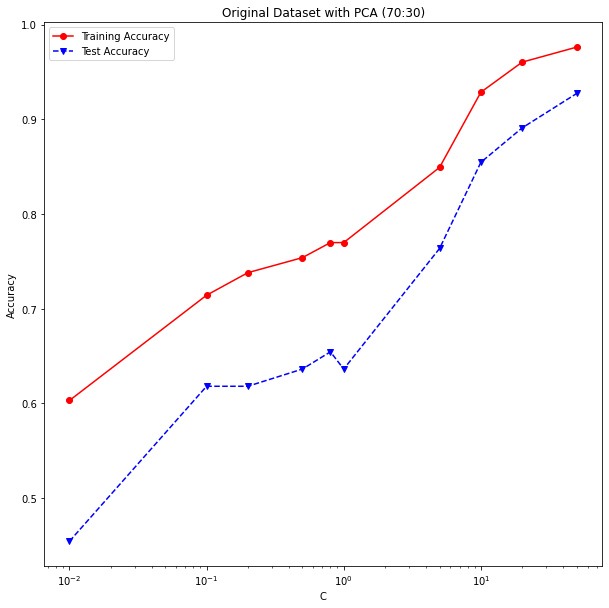

In [80]:
trainAcc, testAcc = useLogisticRegession(X_C_train_2, X_C_test_2, Y_C_train_2, Y_C_test_2)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[1])

#### __4.C.X. Neural Network__

d:\Kendrick\SIT\Modules\Year 2\Sem 3\CSC3005 Data Analytics\Project\Code\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



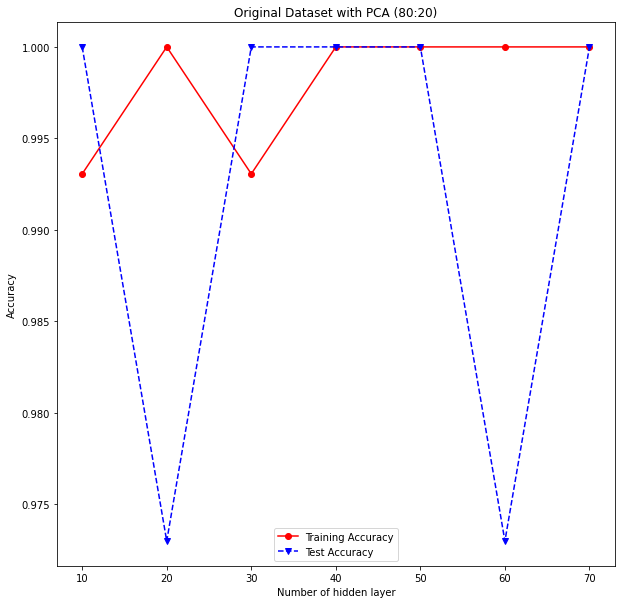

In [81]:
trainAcc, testAcc = useNN(X_C_train, X_C_test, Y_C_train, Y_C_test)
plotAccuracyGraph(xValue=hidden_layer_size, trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of hidden layer', title=title[0])

d:\Kendrick\SIT\Modules\Year 2\Sem 3\CSC3005 Data Analytics\Project\Code\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



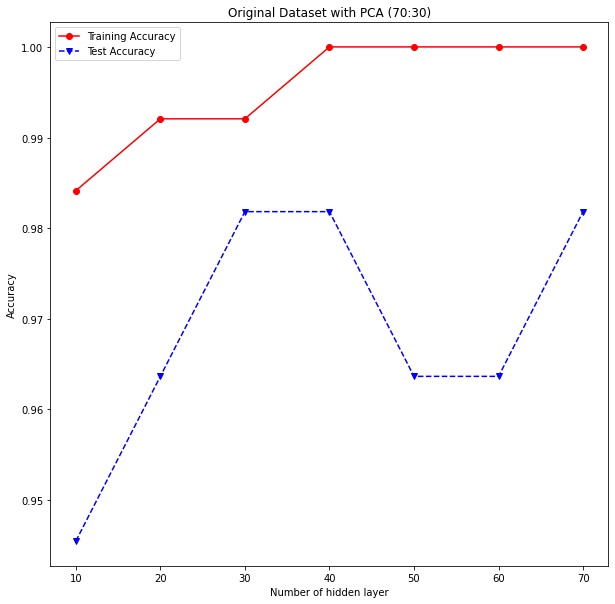

In [82]:
trainAcc, testAcc = useNN(X_C_train_2, X_C_test_2, Y_C_train_2, Y_C_test_2)
plotAccuracyGraph(xValue=hidden_layer_size, trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of hidden layer', title=title[1])

### __4.D__

#### __4.D.1.KNN__

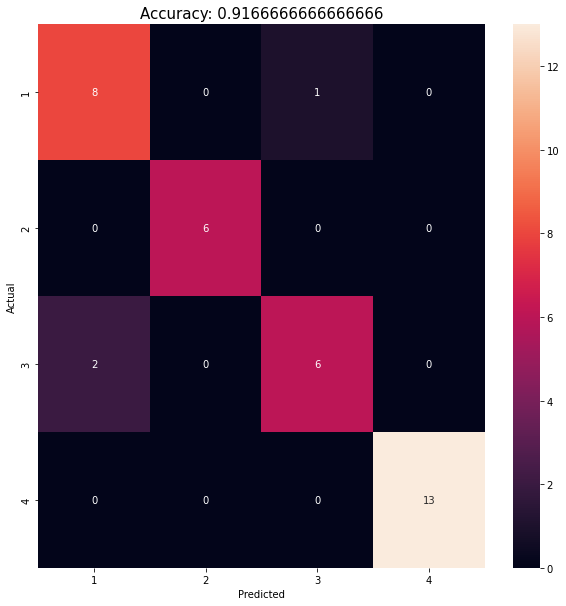

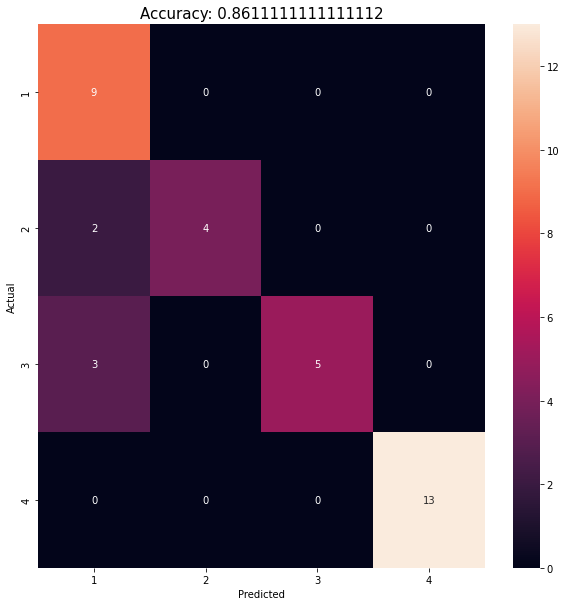

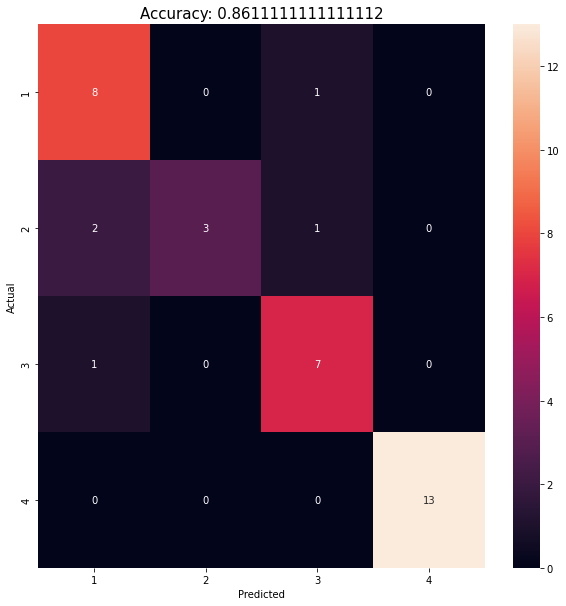

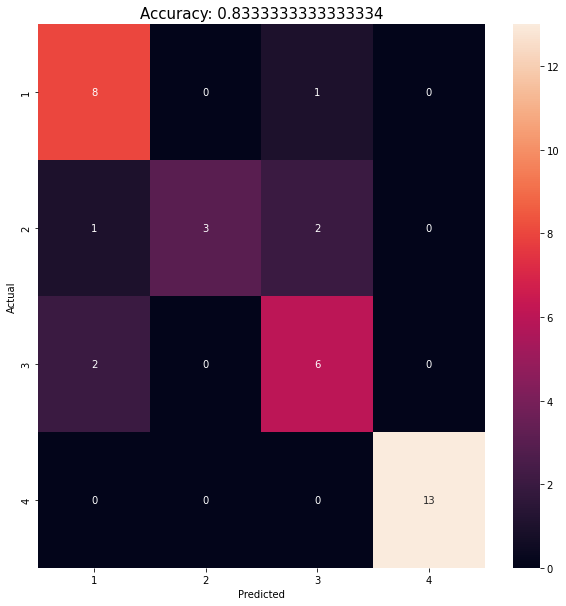

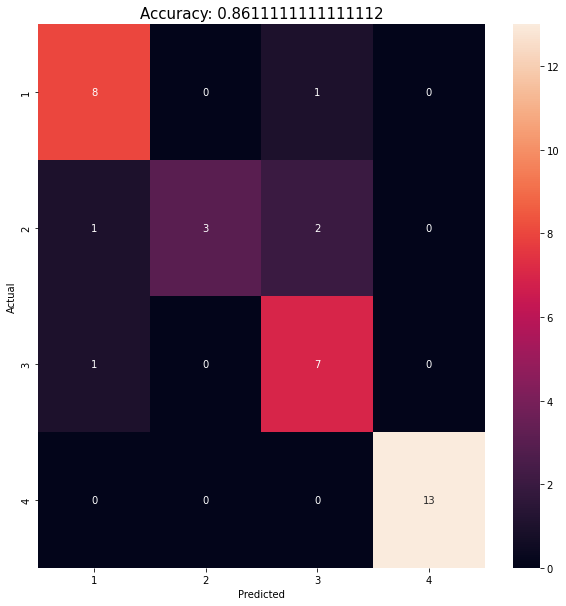

...

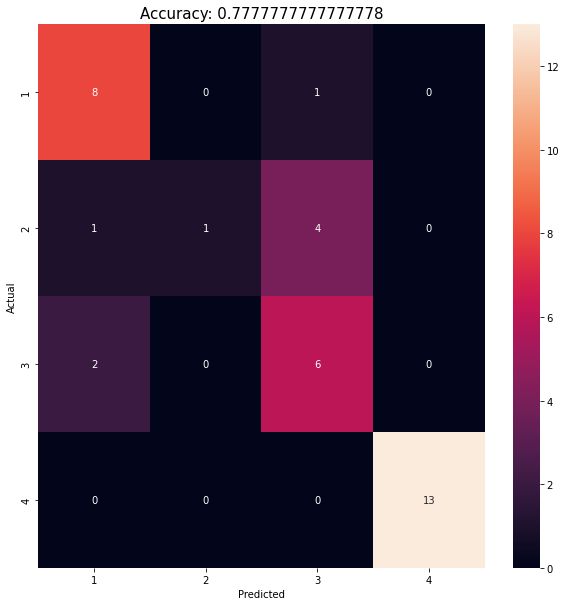

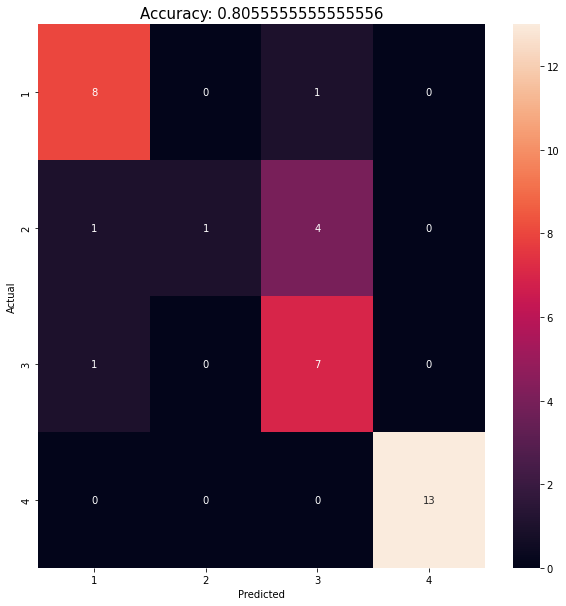

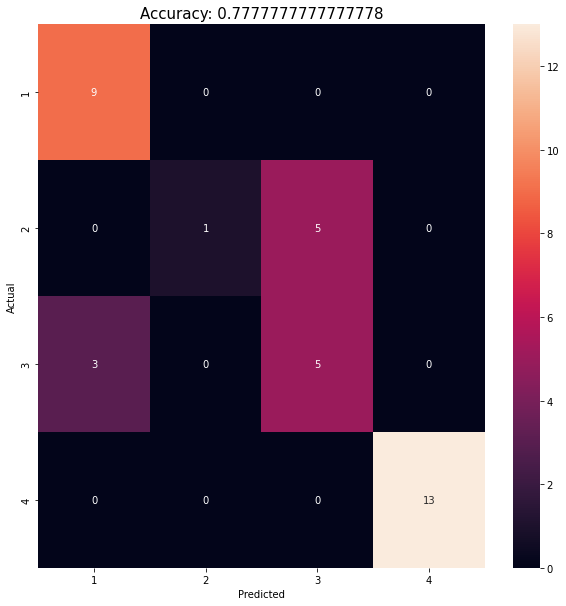

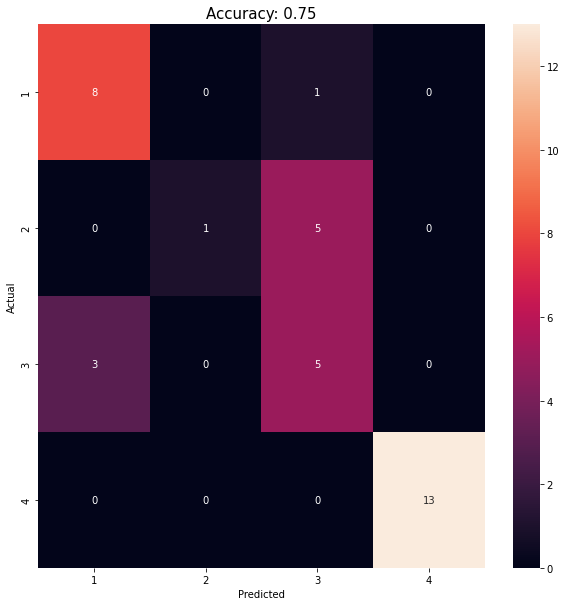

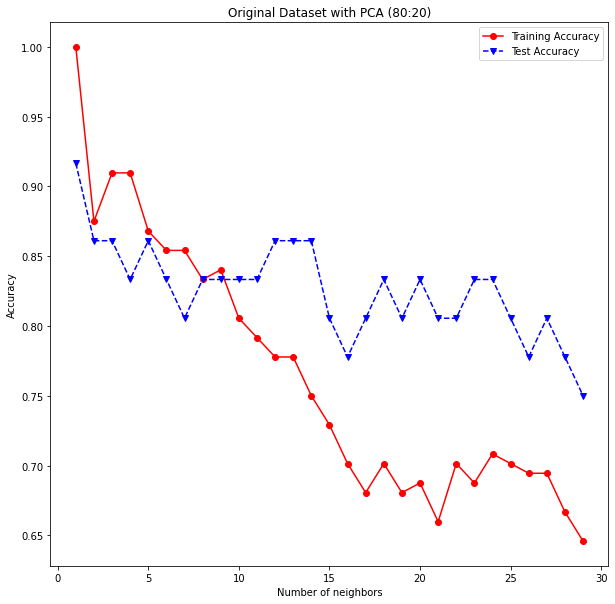

In [83]:
trainAcc, testAcc = useKNN(X_D_train, X_D_test, Y_D_train, Y_D_test)
plotAccuracyGraph(xValue=range(1,30), trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of neighbors', title=title[0])

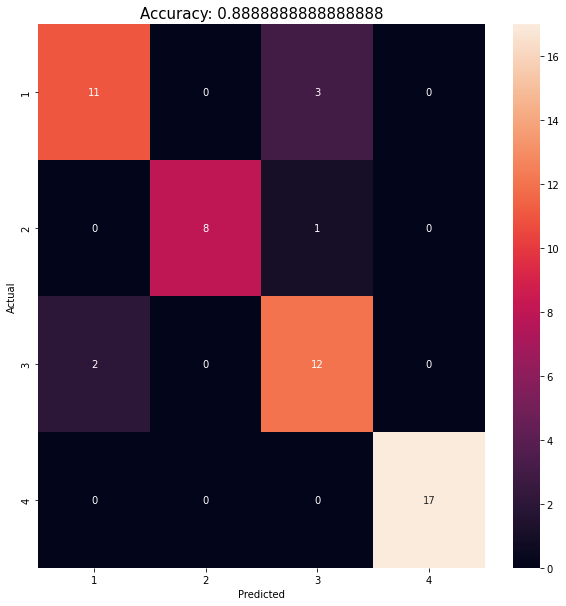

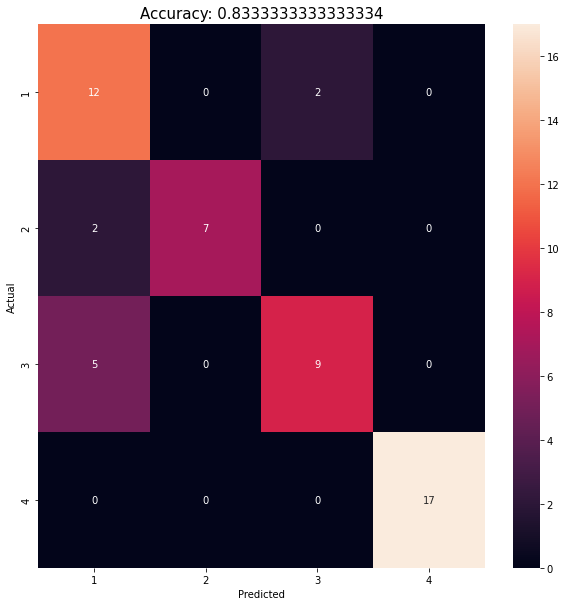

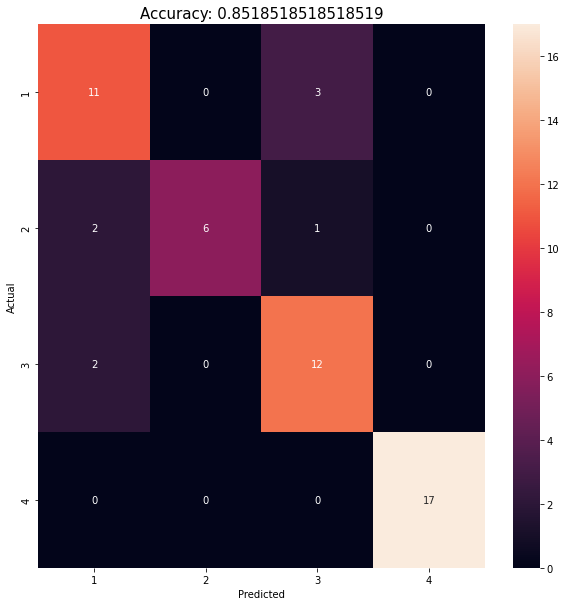

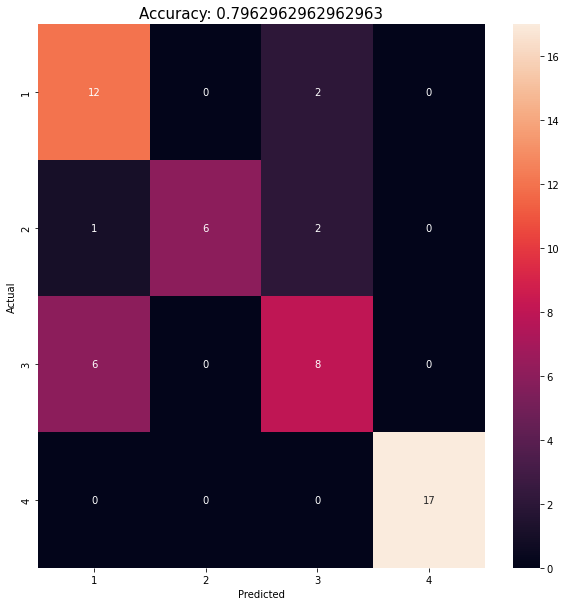

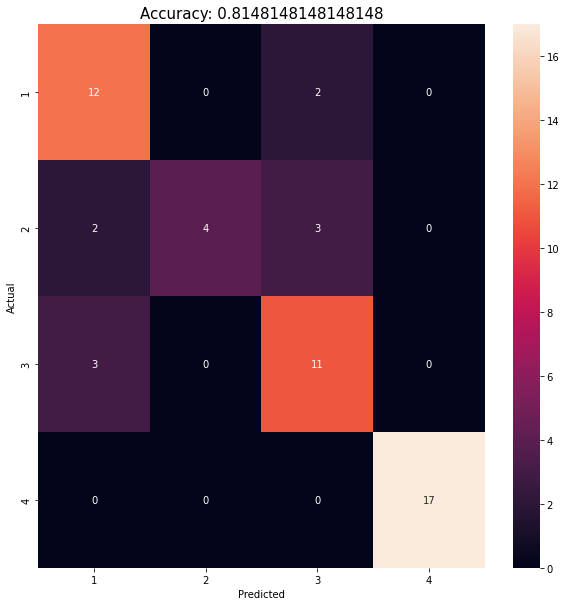

...

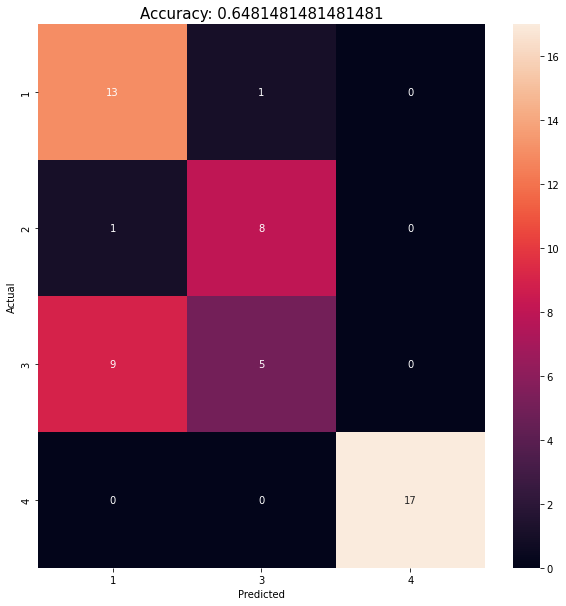

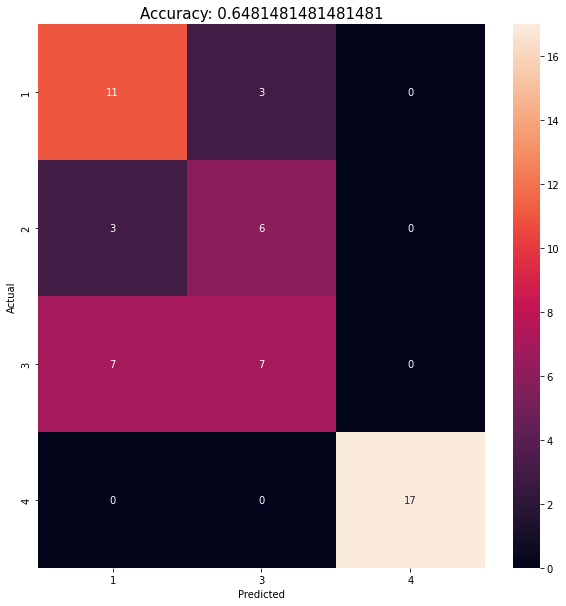

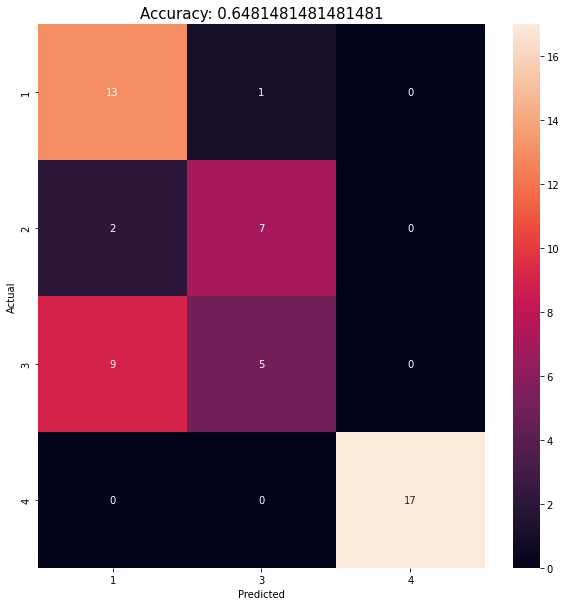

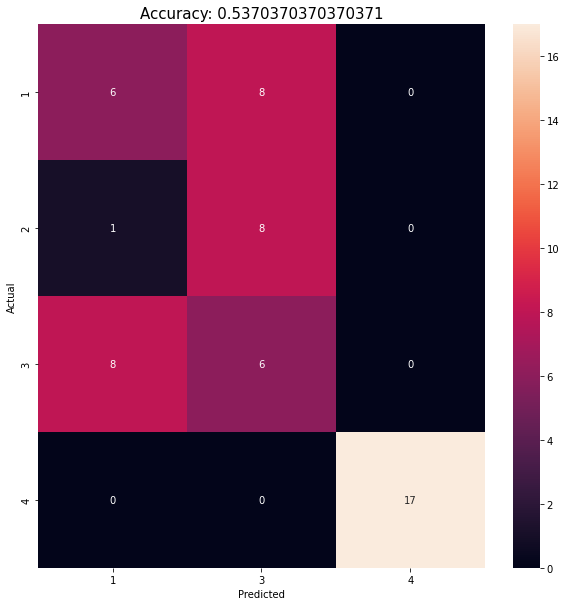

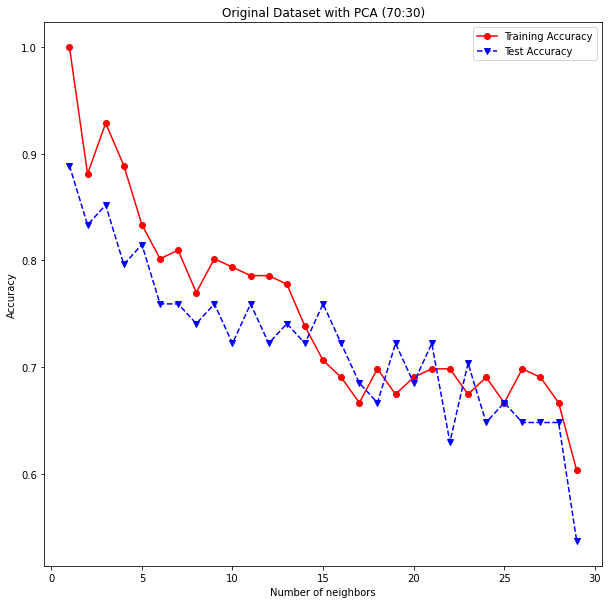

In [84]:
trainAcc, testAcc = useKNN(X_D_train_2, X_D_test_2, Y_D_train_2, Y_D_test_2)
plotAccuracyGraph(xValue=range(1,30), trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of neighbors', title=title[1])

#### __4.D.2. Naive Bayes__

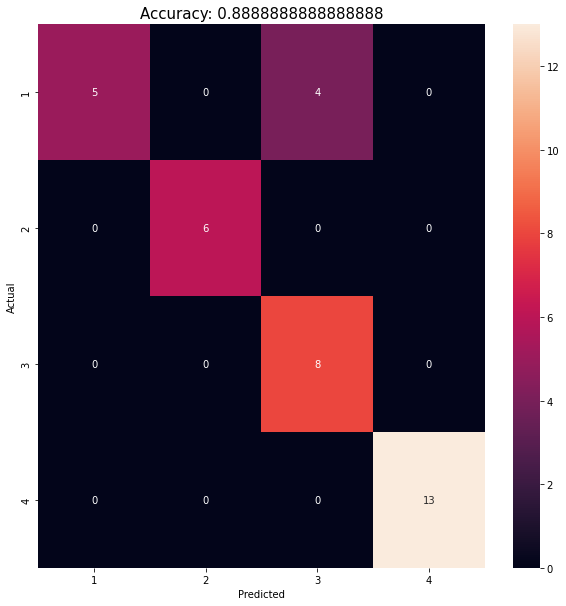

Original Dataset (80:20): Train accuracy: 0.8611111111111112, Test accuracy: 0.8888888888888888


In [85]:
trainAcc, testAcc = useGaussianNaiveBayes(X_D_og_train, X_D_og_test, Y_D_og_train, Y_D_og_test)
print(f"{title_og[0]}: Train accuracy: {trainAcc}, Test accuracy: {testAcc}")

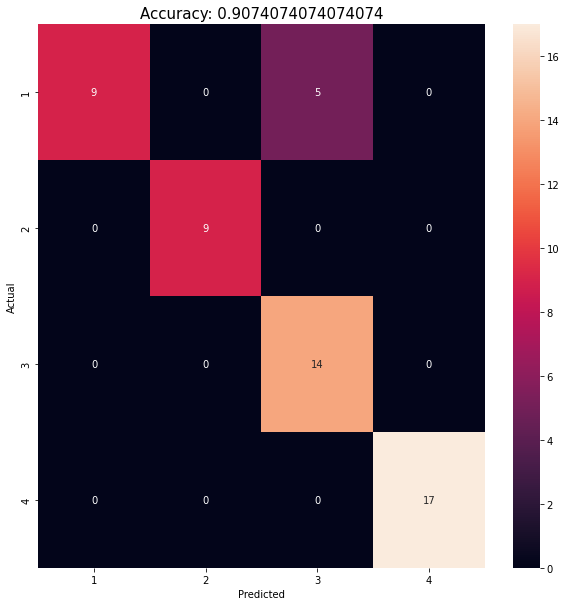

Original Dataset (70:30): Train accuracy: 0.8492063492063492, Test accuracy: 0.9074074074074074


In [86]:
trainAcc, testAcc = useGaussianNaiveBayes(X_D_og_train_2, X_D_og_test_2, Y_D_og_train_2, Y_D_og_test_2)
print(f"{title_og[1]}: Train accuracy: {trainAcc}, Test accuracy: {testAcc}")

#### __4.D.3.Decision Tree__

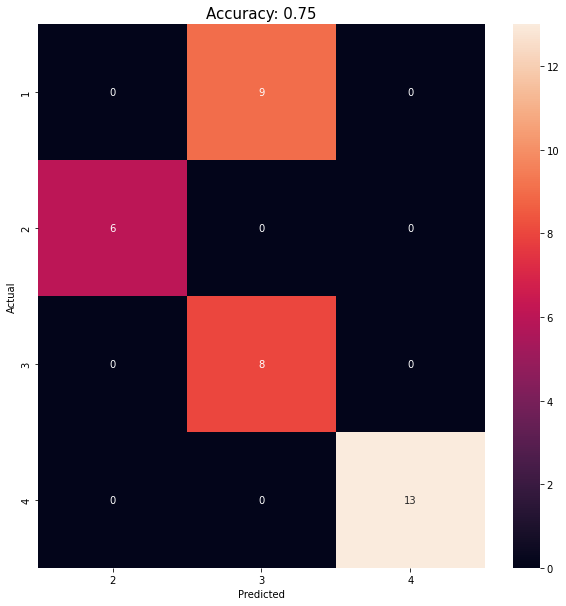

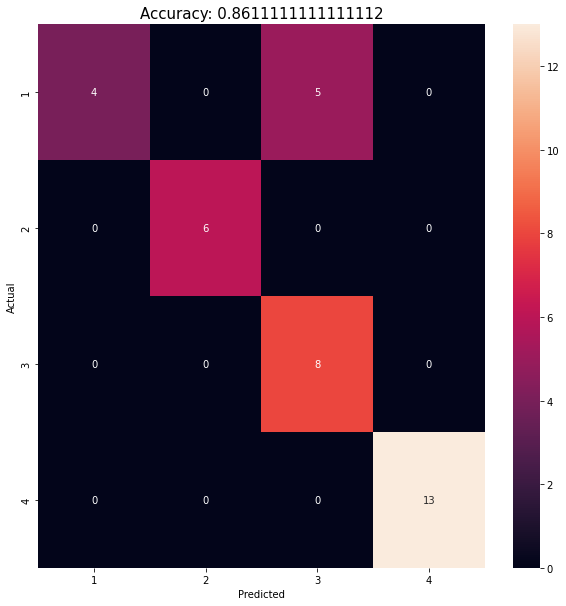

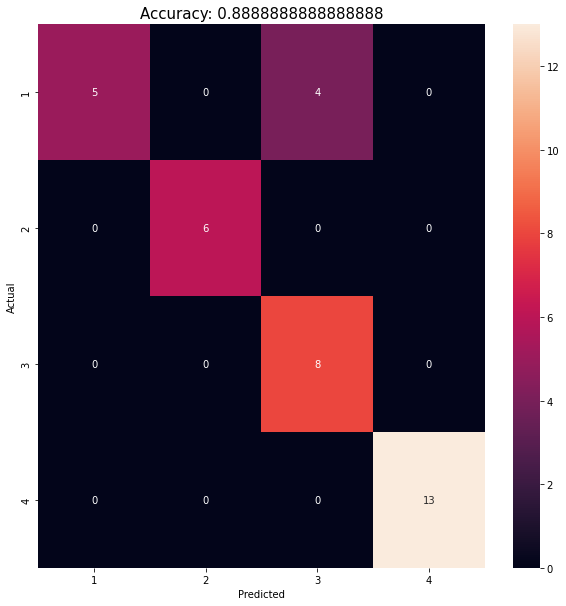

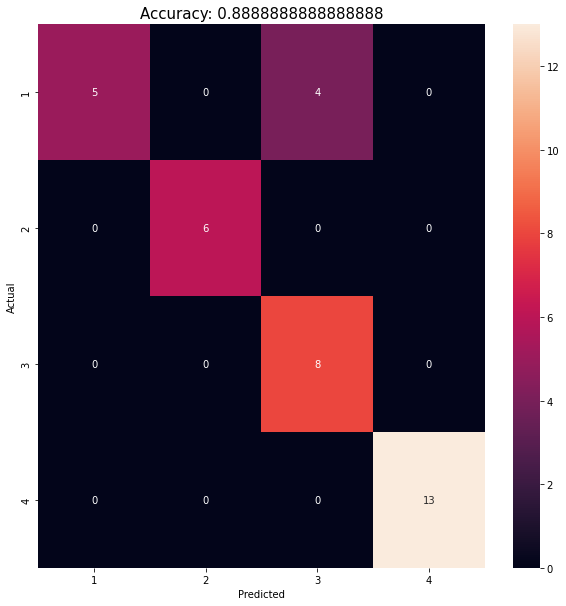

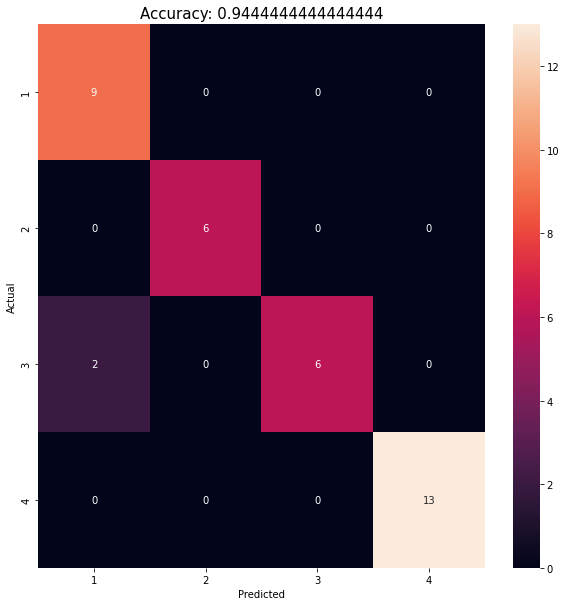

...

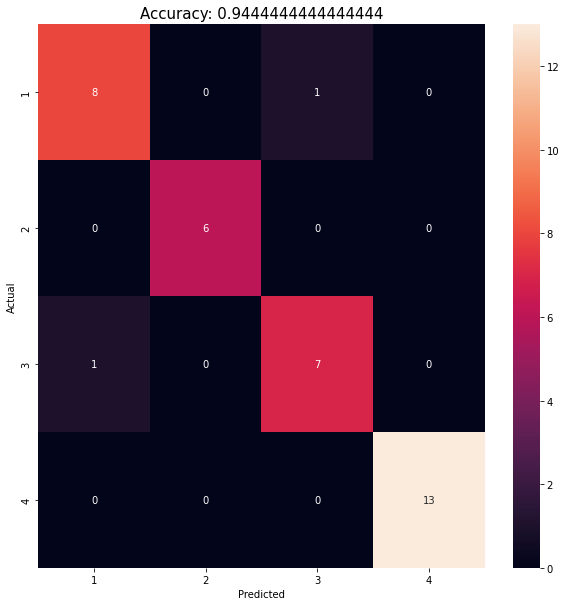

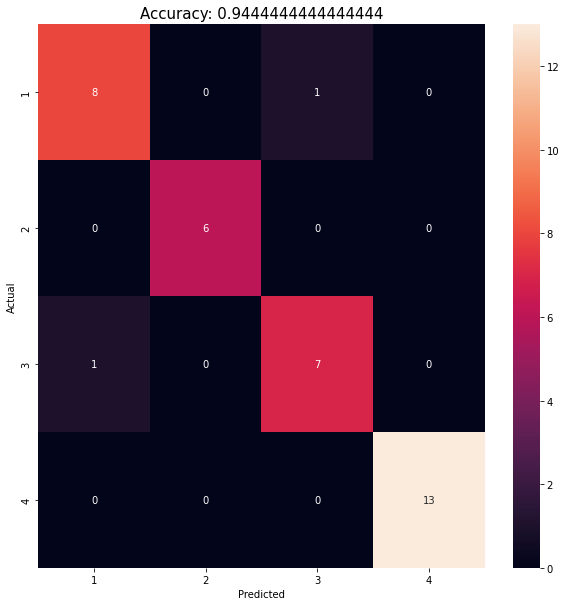

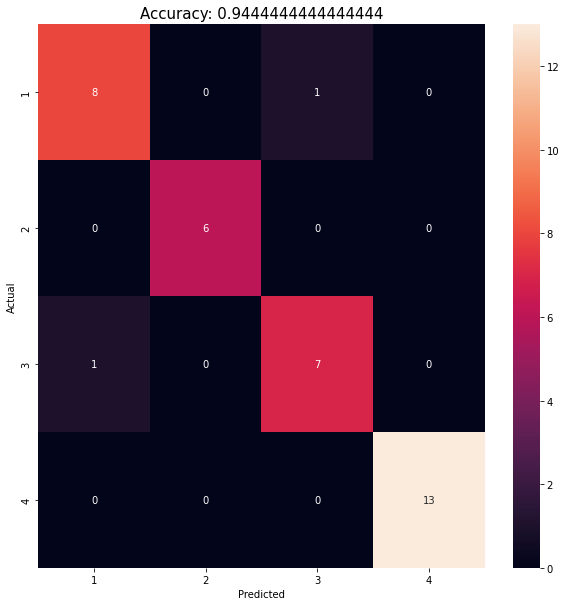

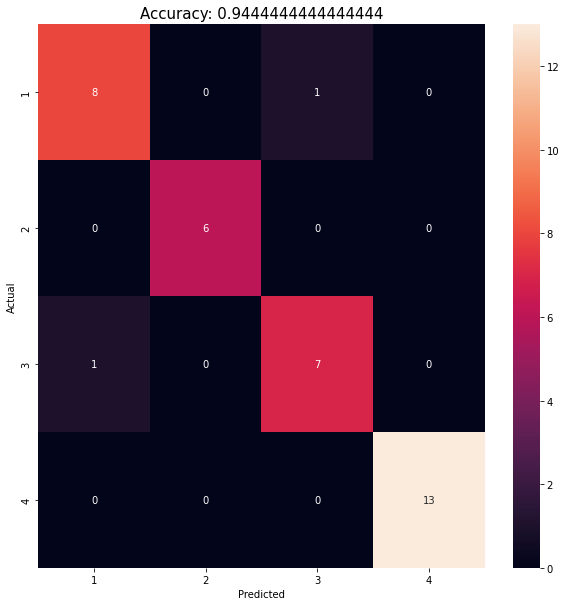

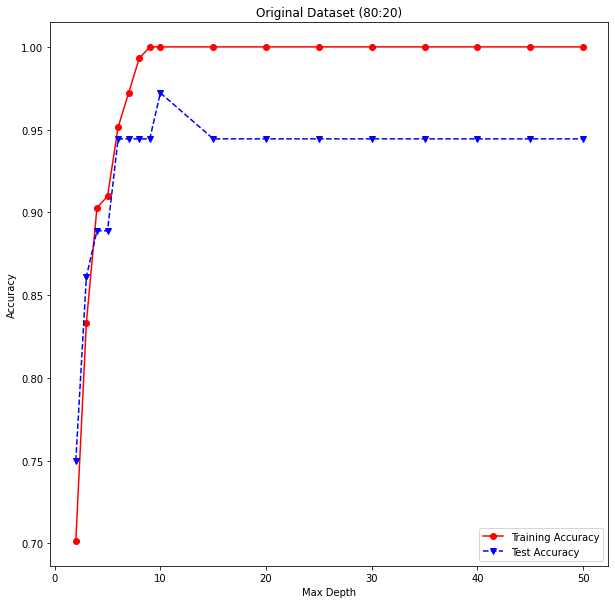

In [87]:
trainAcc, testAcc = useDecisionTree(X_D_og_train, X_D_og_test, Y_D_og_train, Y_D_og_test)
plotAccuracyGraph(xValue=maxDepths, trainAcc=trainAcc, testAcc=testAcc, xLabel='Max Depth', title=title_og[0])

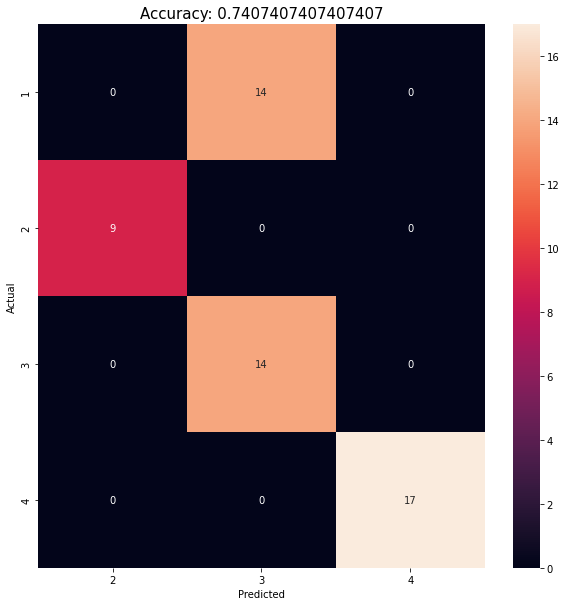

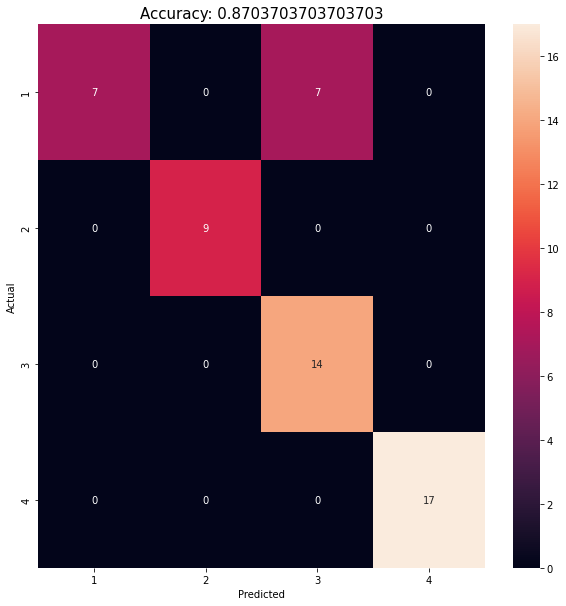

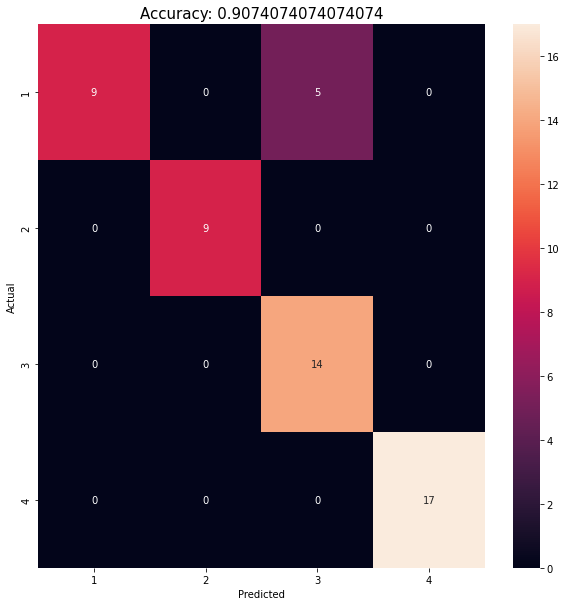

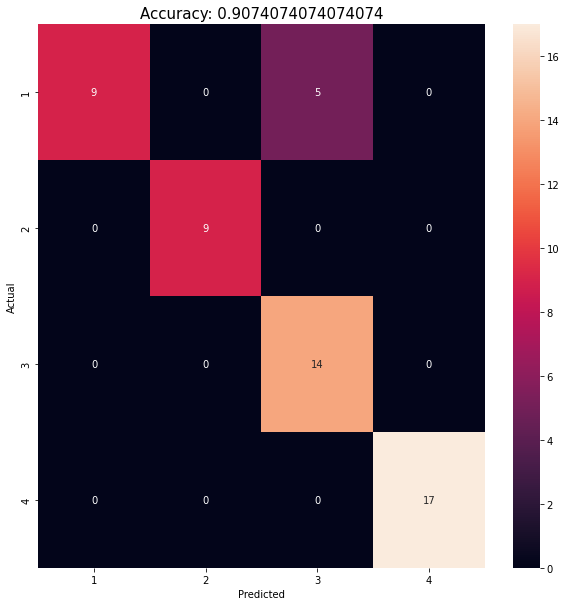

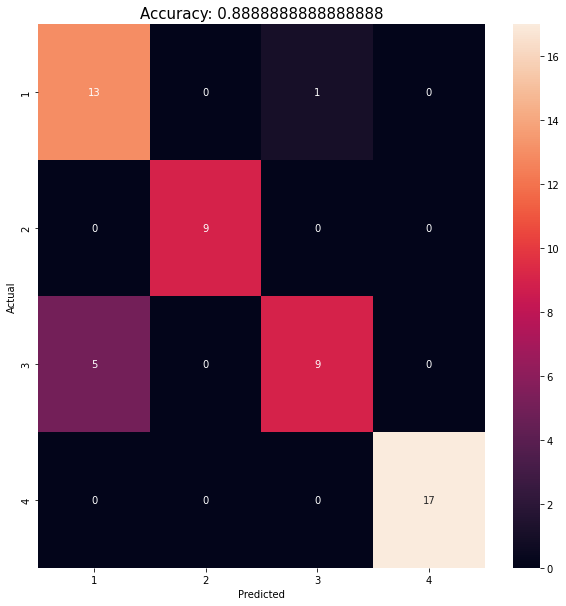

...

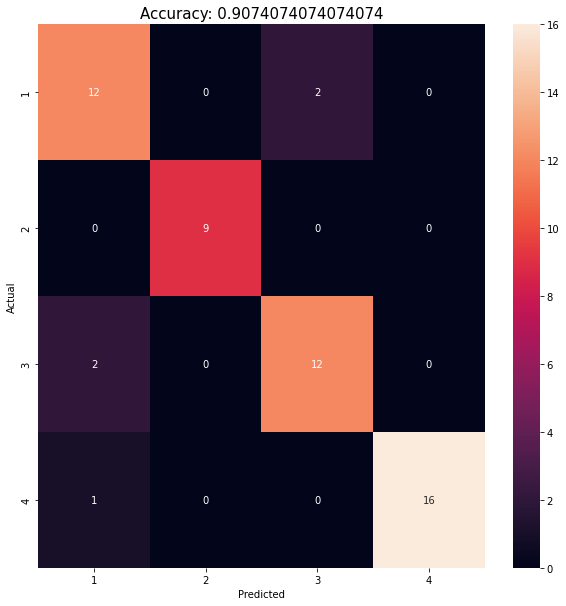

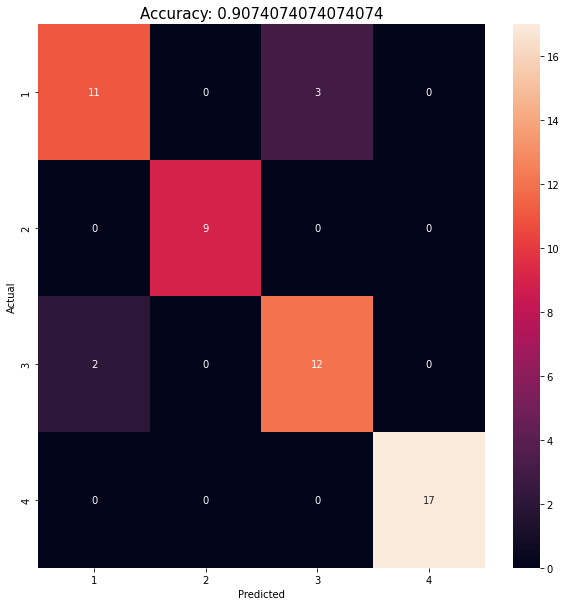

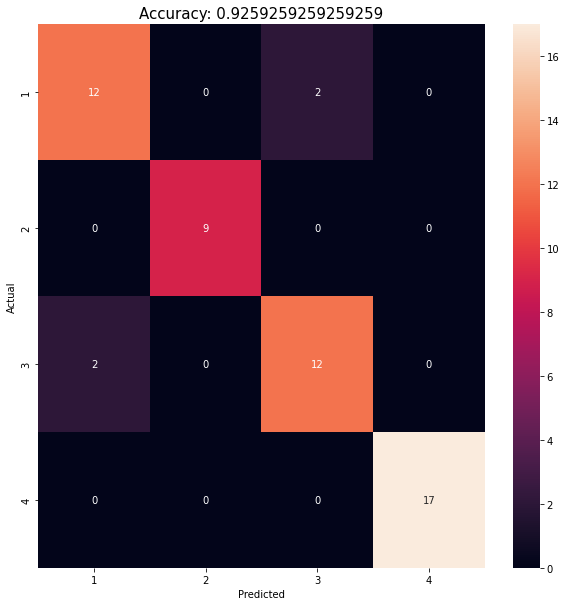

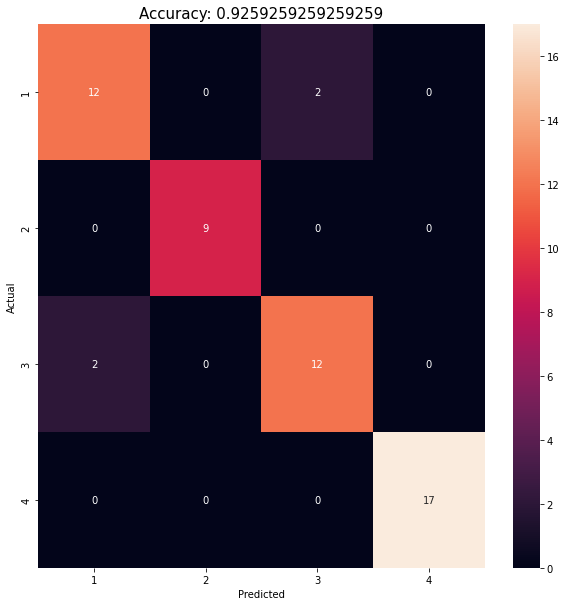

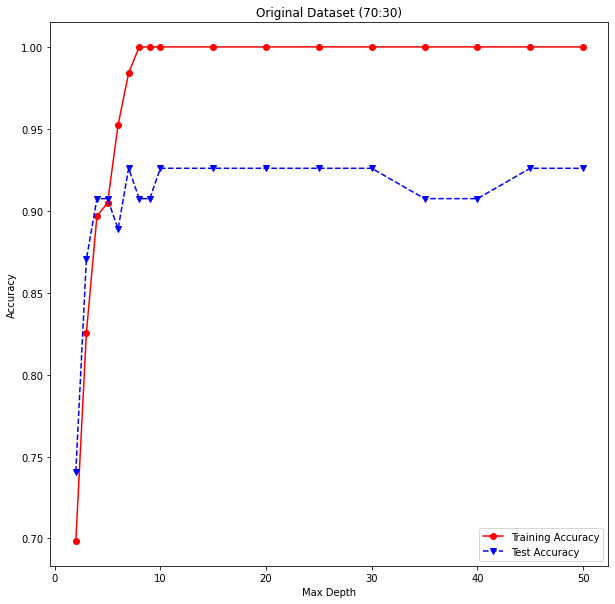

In [88]:
trainAcc, testAcc = useDecisionTree(X_D_og_train_2, X_D_og_test_2, Y_D_og_train_2, Y_D_og_test_2)
plotAccuracyGraph(xValue=maxDepths, trainAcc=trainAcc, testAcc=testAcc, xLabel='Max Depth', title=title_og[1])

#### __4.D.4. Logistic Regression__

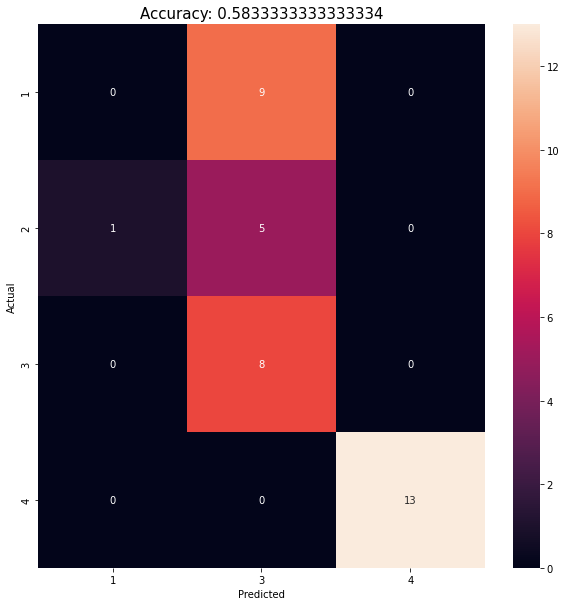

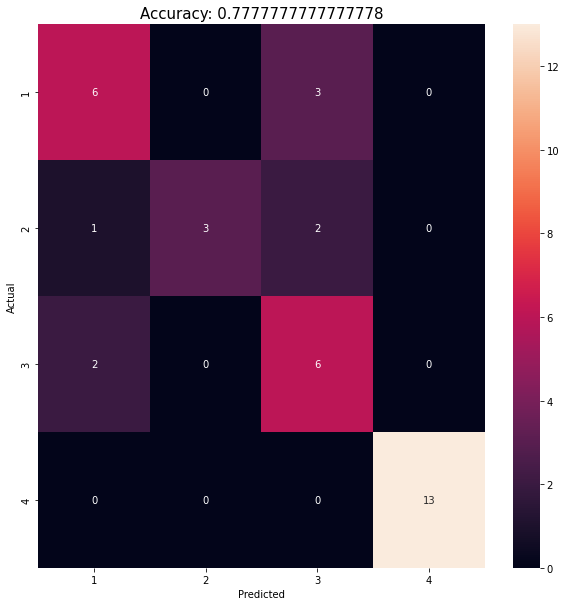

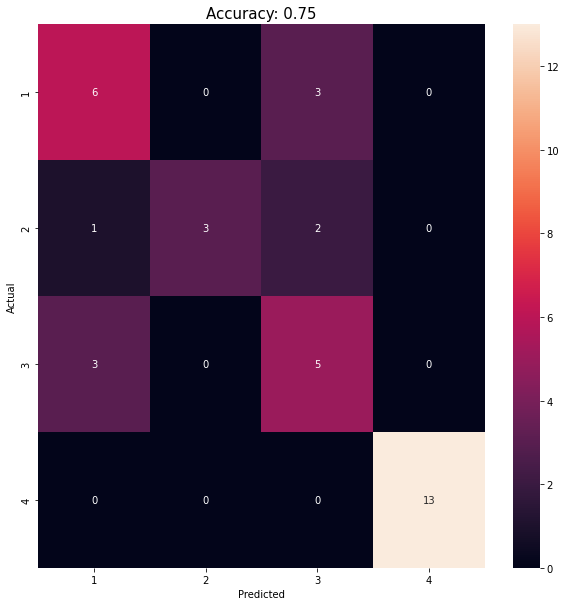

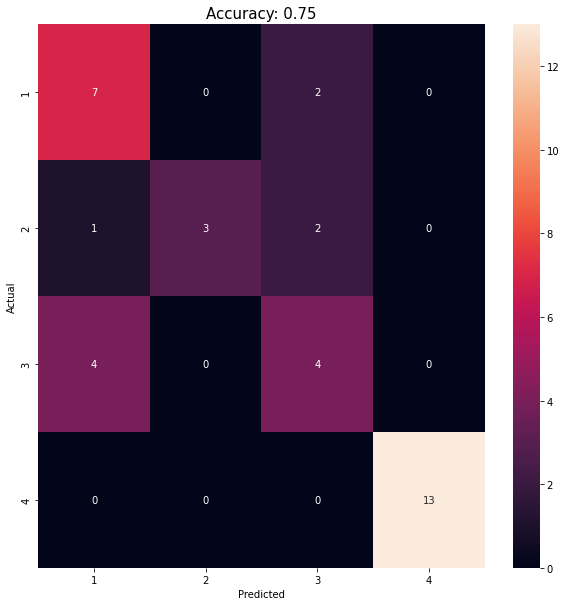

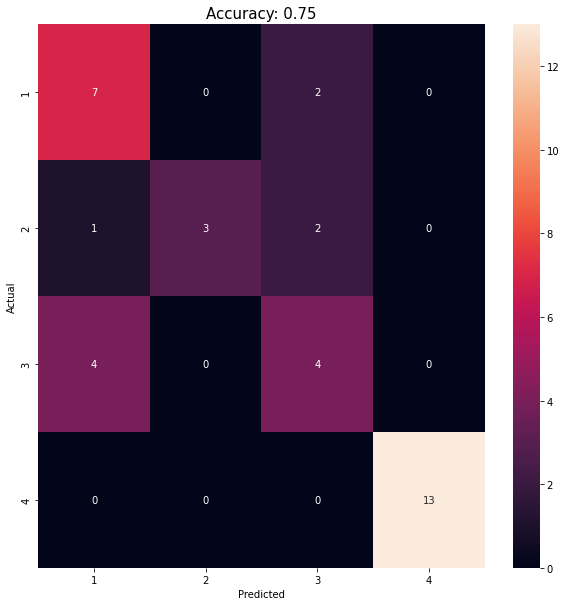

...

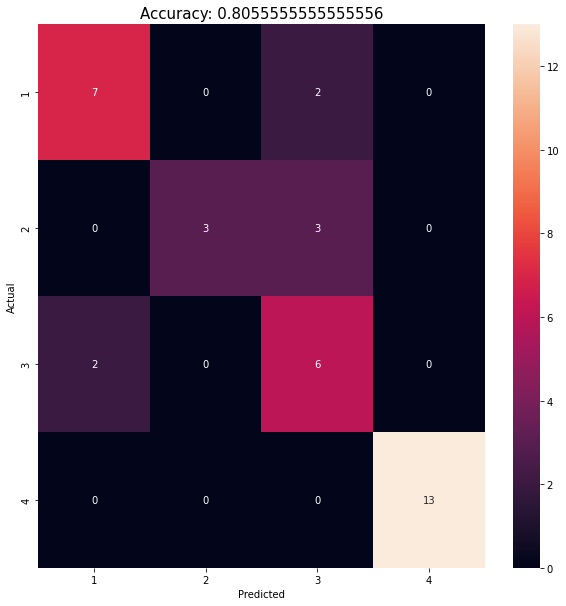

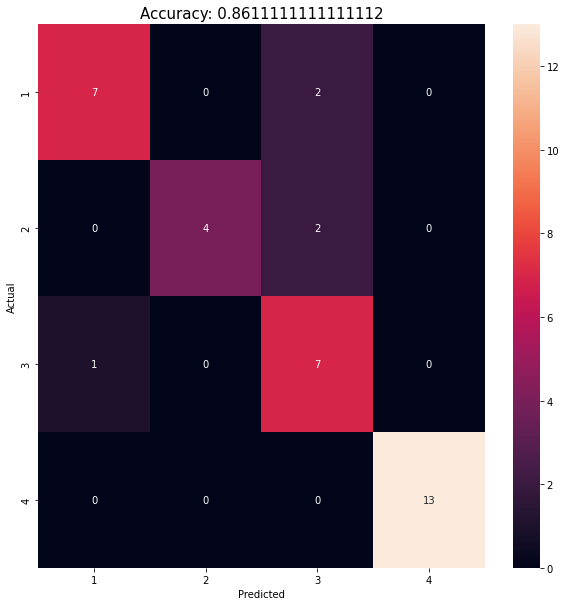

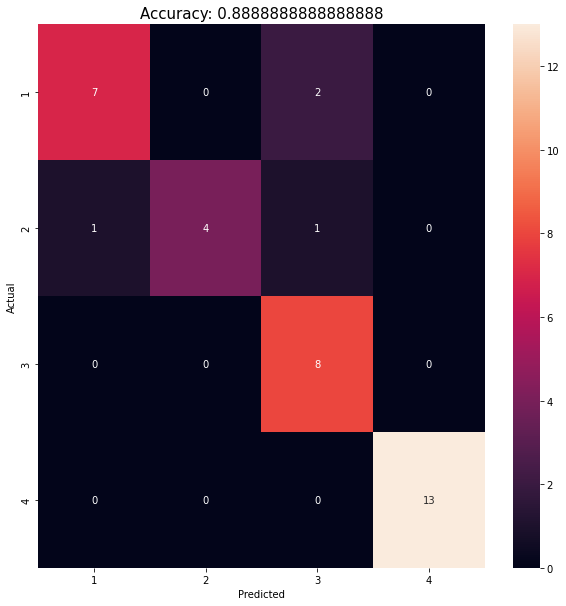

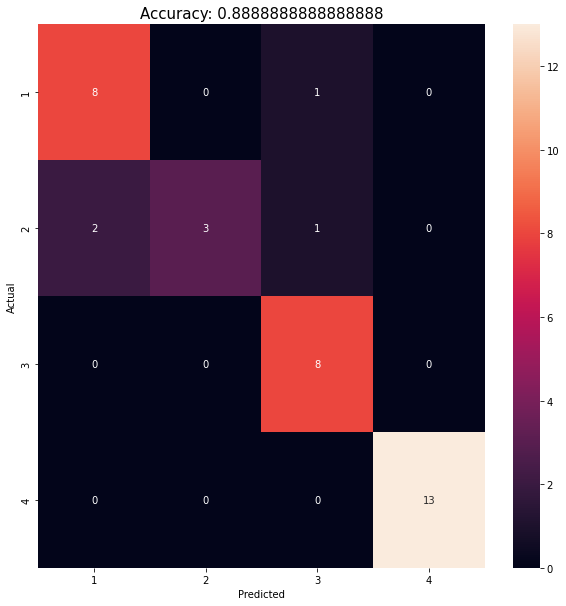

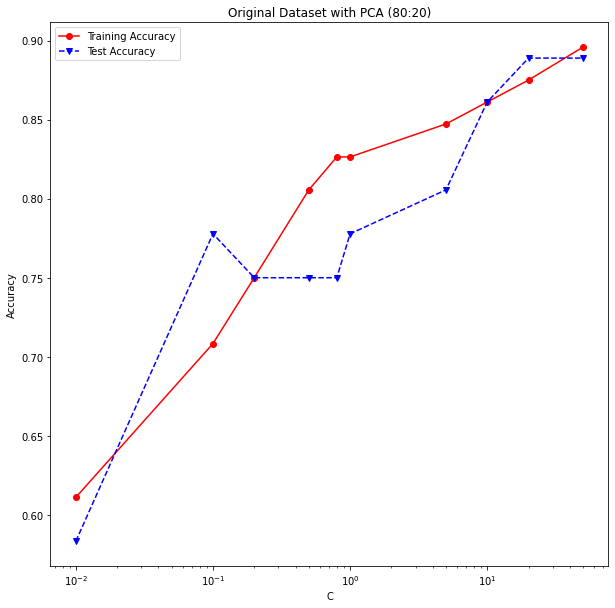

In [89]:
trainAcc, testAcc = useLogisticRegession(X_D_train, X_D_test, Y_D_train, Y_D_test)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[0])

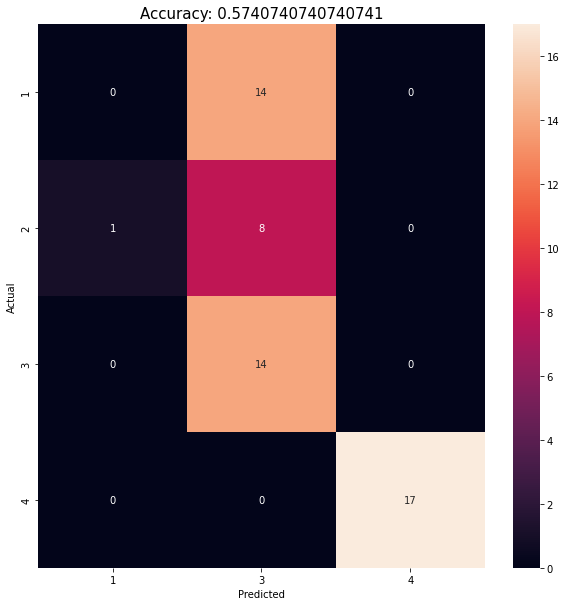

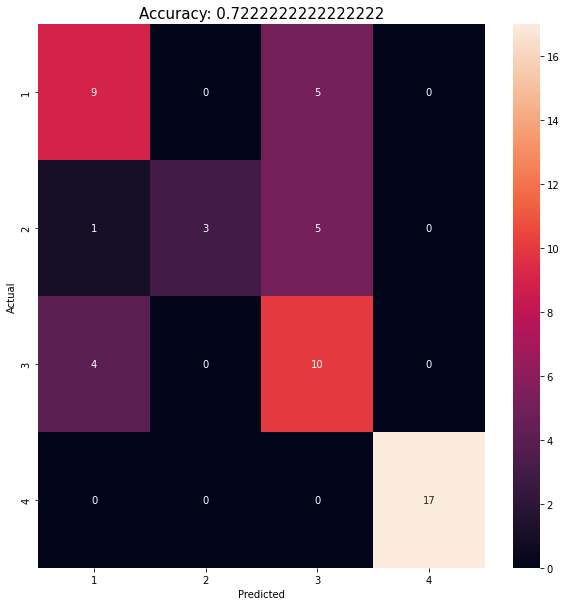

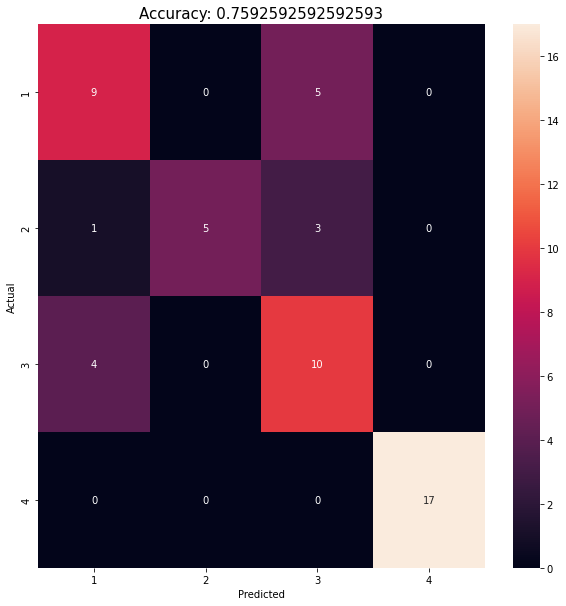

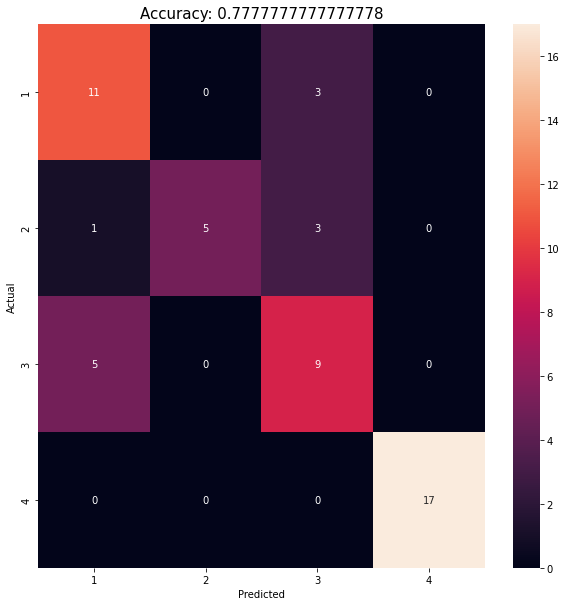

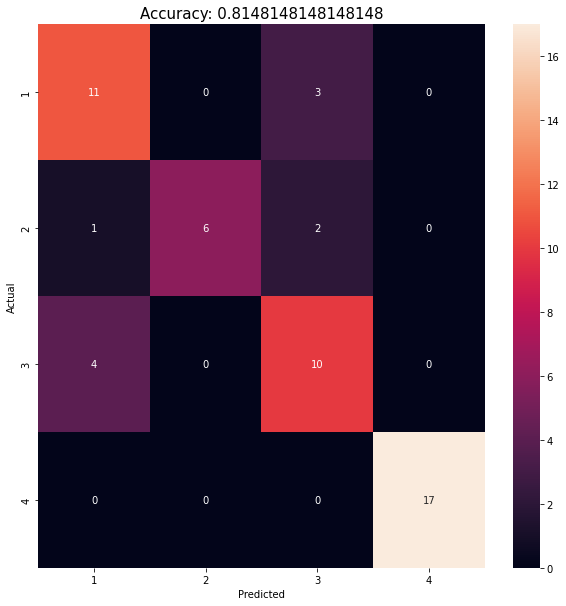

...

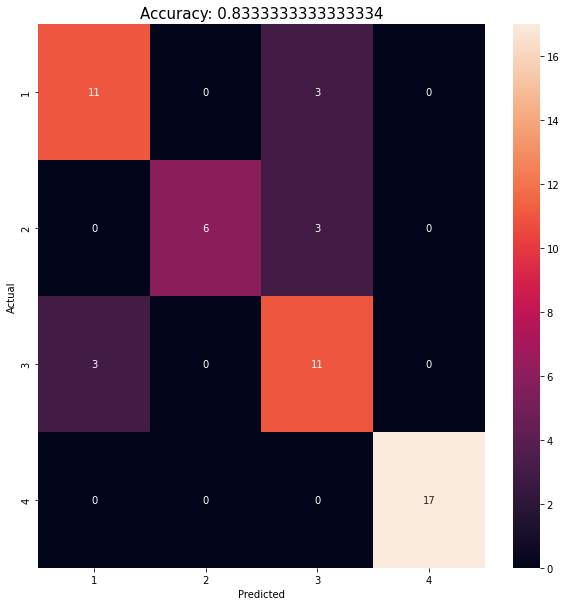

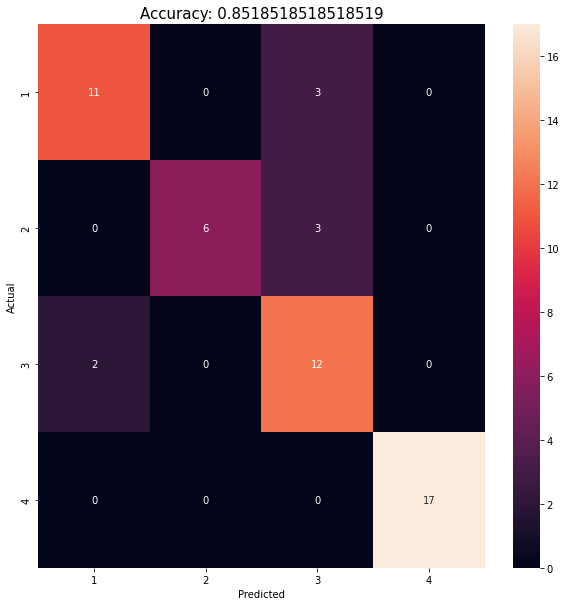

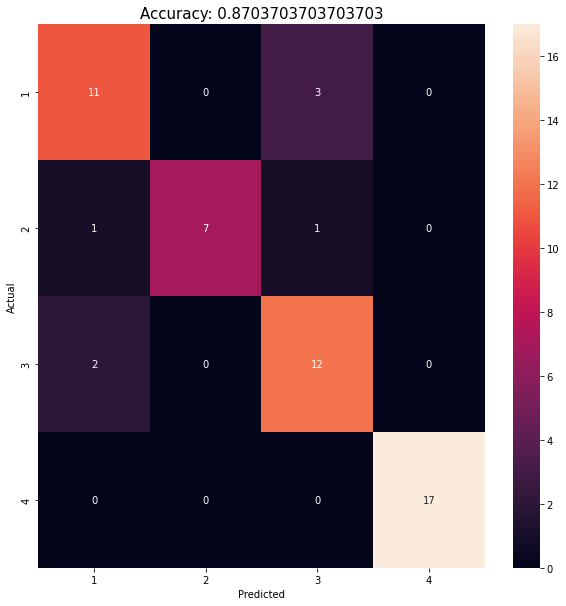

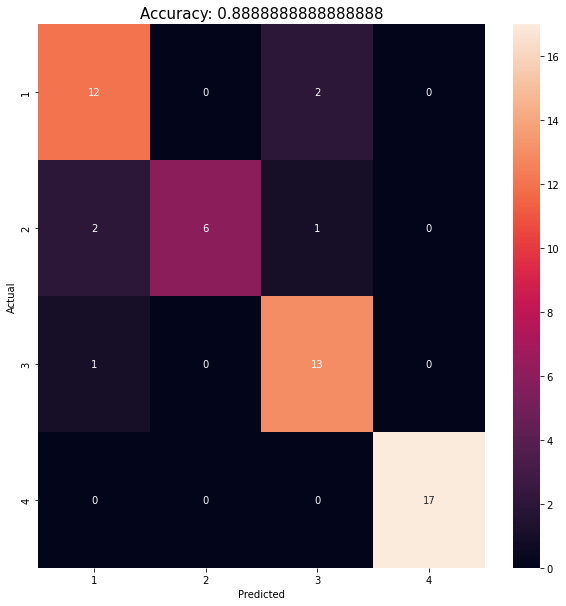

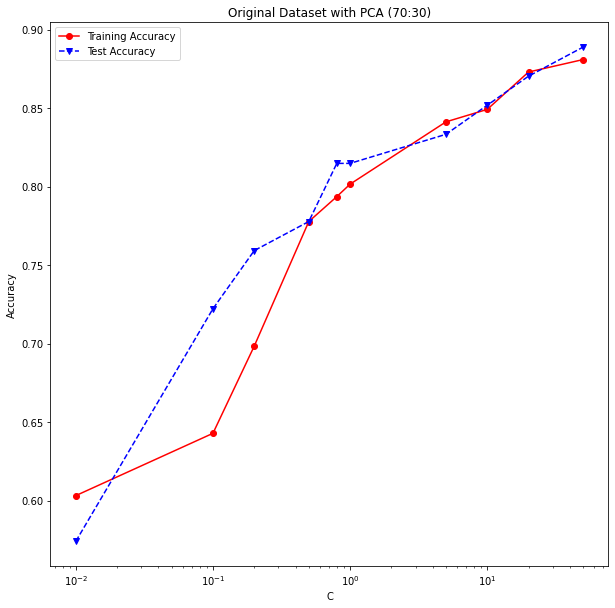

In [90]:
trainAcc, testAcc = useLogisticRegession(X_D_train_2, X_D_test_2, Y_D_train_2, Y_D_test_2)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[1])

#### __4.D.X. Neural Network__

d:\Kendrick\SIT\Modules\Year 2\Sem 3\CSC3005 Data Analytics\Project\Code\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



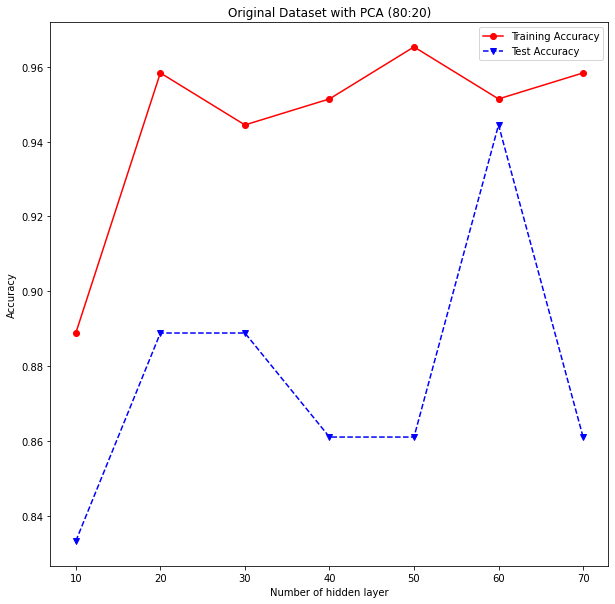

In [91]:
trainAcc, testAcc = useNN(X_D_train, X_D_test, Y_D_train, Y_D_test)
plotAccuracyGraph(xValue=hidden_layer_size, trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of hidden layer', title=title[0])

d:\Kendrick\SIT\Modules\Year 2\Sem 3\CSC3005 Data Analytics\Project\Code\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:702: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.



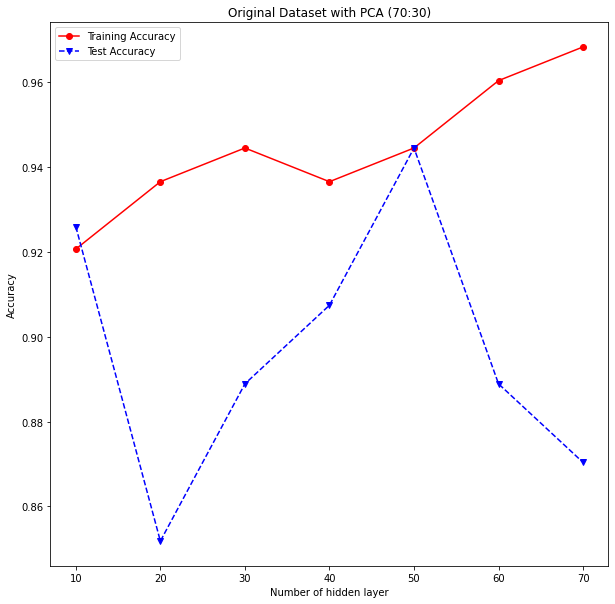

In [92]:
trainAcc, testAcc = useNN(X_D_train_2, X_D_test_2, Y_D_train_2, Y_D_test_2)
plotAccuracyGraph(xValue=hidden_layer_size, trainAcc=trainAcc, testAcc=testAcc, xLabel='Number of hidden layer', title=title[1])

### __5.X. Linear Support Vector Machine(SVM)__

### __5.X. Non-linear Support Vector Machine(SVM)__

In [93]:
C = [0.01, 0.1, 0.2, 0.5, 0.8, 1, 5, 10, 20, 50]

def nonLinearSVM(X_train, X_test, Y_train, Y_test):
    trainAcc = []
    testAcc = []

    for param in C:
        clf = SVC(C=param,kernel='rbf',gamma='auto')
        clf.fit(X_train, Y_train)

        Y_predTrain = clf.predict(X_train)
        Y_predTest = clf.predict(X_test)

        trainAcc.append(accuracy_score(Y_train, Y_predTrain))
        testAcc.append(accuracy_score(Y_test, Y_predTest))

    return trainAcc, testAcc

In [94]:
trainAcc, testAcc = nonLinearSVM(X_train_pca, X_test_pca, Y_train, Y_test)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[0], xScale='log')

NameError: name 'X_train_pca' is not defined

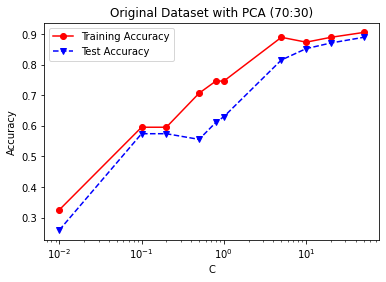

In [ ]:
trainAcc, testAcc = nonLinearSVM(X_train_pca_2, X_test_pca_2, Y_train_2, Y_test_2)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[1], xScale='log')

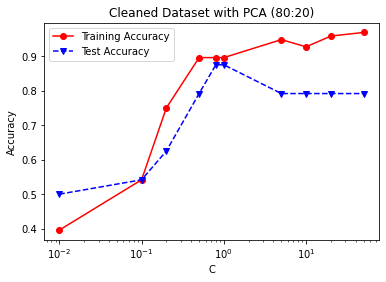

In [ ]:
trainAcc, testAcc = nonLinearSVM(X_clean_train_pca, X_clean_test_pca, Y_clean_train, Y_clean_test)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[2], xScale='log')

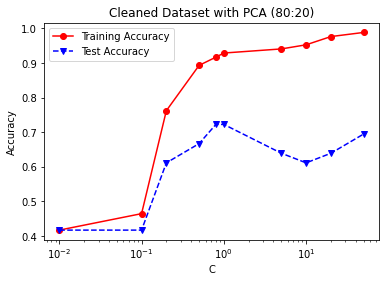

In [ ]:
trainAcc, testAcc = nonLinearSVM(X_clean_train_pca_2, X_clean_test_pca_2, Y_clean_train_2, Y_clean_test_2)
plotAccuracyGraph(xValue=C, trainAcc=trainAcc, testAcc=testAcc, xLabel='C', title=title[2], xScale='log')

In [ ]:
# x_min, x_max = X_test[:, 0].min() - 1, X_test[:, 0].max() + 1
# y_min, y_max = X_test[:, 1].min() - 1, X_test[:, 1].max() + 1
# xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),np.arange(y_min, y_max, 0.1))

# plt.plot(X[:int(N/2),0],X[:int(N/2),1],'r+',X[int(N/2):,0],X[int(N/2):,1],'k.',ms=5)

# f, axarr = plt.subplots(4, 2, sharex='col', sharey='row', figsize=(10, 8))

# for idx, clf, tt in zip([[0, 0],[0,1],[1,0],[1,1],[2,0],[2,1],[3,0]], [clf1,clf2,clf3,clf4,clf5,clf6,clf7],['KNN(K=30)','NB', 'LR','Linear SVM','nonlinear SVM','Neural Network','Decision Tree(Depth=10)']):

#     Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
#     Z = Z.reshape(xx.shape)
#     axarr[idx[0], idx[1]].contourf(xx, yy, Z,alpha=0.4)
#     axarr[idx[0], idx[1]].set_title(tt)
# plt.show()

## __X. Conclusion__